<a href="https://colab.research.google.com/github/aerehn/Capstone/blob/main/Kopio_App5_Sleep_stage_classification_using_electromyography_and_electro_oculography_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DTEK0086 Biosignal Analytics
#Sleep stage classification using electromyography and electro-oculography

#Background
Sleep can be dividedinto distinct categories, including rapid eye movement (REM) sleep and non-rapid eye movement (NREM) sleep. In REM sleep, the eyes move rapidly from side to side, breathing becomes faster and irregular, and heart rate and blood pressure increase to near waking levels [1].  REM sleep is essential for healthy emotion regulation. NREM sleep consists of light 
sleep and deep sleep. Both light and deep sleep are essential for various 
processesin the body. The sleep stages can be measured using the polysomnography
method, containing electromyography(EMG), electrooculography(EOG), and electroencephalography. Facial EMG shows differences between the sleep stages. EOG is a technique to collect the electrical activity of the eye’s muscles. It 
can also be used to track eye movements.

##Objective
The objective of this project is toperform sleep stage classification leveraging features derived from EOG and EMG signals. Using machine learning, you need to differentiate the records into three classes: i.e., awake, REM, and NREM. The analysis should be done in Python(more details in the Instruction Section). 

For this course project, you need to:
1. Submit your Python script and your report of the observations, graphs, and conclusions made upon analyzing the given signals. It is suggested to submit a Jupyter Notebook file, including your code and report. 
2. Give a 20-minute presentation about your work. Your presentation should includea description of 
  - The problem and the biosignals.
  - The steps in your analysis: e.g., what pre-processing methods you use, which features you extract, which machine-learning algorithms you use.
  - The results that you obtain: e.g., the accuracy of two machine learning methods
  - Your evaluation and conclusion on the findings and methods

##Data collection setup
The single-channel EOG was measured from the left side of the face
(referenced to the contralateral ear lobe). The single-channel EMG was collected from the chin. The signals were measured in microvolts with the 
sampling frequency of 200 Hz. The data annotations were performed by human experts. The data is extracted from the Physionets You Snooze You Win challenge database (challenge-2018)

##Structure of the data
The project includes the records of 100 subjects (i.e., 80 for training and 20 for test). There are 4-9 records for each subject.
Each record (i.e., file) consists of one minute of EOG and EMG signals, and it corresponds to the awake, REM, or NREM stage. The dataset includes separate “Train” and “Test” folders. The folders contain three subfolders as “awake”, “rem”, and “nonrem.” Each record is saved as a CSV file, including two columns corresponding to the EOG and EMG signals. The filename includes the event number
and the subject number. For example, 100 is the event number, 
and 61 is the subject number in “100_subj_61.csv.”

##Instruction
For the analysis, you should:
1. Use pre-processing techniques (such as filtering) if necessary.
2. Extract relevant time-domain and frequency-domain features from the EOG and EMGsignals (e.g., summary statistics, RMS value, and resonance frequency).
3. Standardize your data: i.e., use the mean and standard deviation of the training data to standardize the training data and the test data.
4. Select two supervised machine learning algorithms and train two classifiers using the training set. Each classifier should predict 0 for “awake”, 1 for “rem”, or 2 for “nonrem”.
5. Compare the two classifiers by evaluating the results using the test set. 
  - Obtain the confusion matrix, accuracy, precision, recall, and F1-score. These can be calculated from the predicted and true values. Hint: You can utilize packages such as scipy, tsfresh, and tsfel for the pre-processing and feature-extraction steps, and packages such as scikit-learn for the machine-
learning step.





In [399]:
!pip install tsfel

#Import the libraries

In [400]:
import pandas as pd
import tsfel
import os
import random
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal as sgnl
from scipy.fft import fft, fftfreq
from scipy.stats import kurtosis,skew

In [401]:
sample_length_in_seconds=60

In [402]:
#Mounting on drive
#jos tulee ongelmia niin lisää omaan driveen nuo datat
from google.colab import drive
drive.mount('/content/gdrive')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Data imports, paths and names

In [403]:
main_path = "/content/gdrive/My Drive/Colabdata/DataDTEK0086"
train_paths=["/Train"]
!ls "/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train"

awake  nonrem  rem


In [404]:
train_paths={"awake":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train/awake","nonrem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train/nonrem", "rem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train/rem"}
print(os.listdir(train_paths["awake"])[0:5])

['105_subj_63.csv', '0_subj_50.csv', '149_subj_22.csv', '0_subj_57.csv', '332_subj_4.csv']


Collecting data of subject 01.

In [405]:
subject1_files={"awake":[],"nonrem":[],"rem":[]}

subject2_files={"awake":[],"nonrem":[],"rem":[]}

subject3_files={"awake":[],"nonrem":[],"rem":[]}
for sleep_state in train_paths.keys():
  files = os.listdir(train_paths[sleep_state])
  for filename in files:
    if "subj_1.csv" in filename:
      subject1_files[sleep_state].append(filename)
    if "subj_2.csv" in filename:
      subject2_files[sleep_state].append(filename)
    if "subj_4.csv" in filename:
      subject3_files[sleep_state].append(filename)


In [406]:
rem_data = pd.read_csv(train_paths["rem"]+"/"+subject1_files["rem"][0])
rem_data2= pd.read_csv(train_paths["rem"]+"/"+subject2_files["rem"][0])
rem_data3= pd.read_csv(train_paths["rem"]+"/"+subject3_files["rem"][0])
nonrem_data=pd.read_csv(train_paths["nonrem"]+"/"+subject1_files["nonrem"][0])
nonrem_data2=pd.read_csv(train_paths["nonrem"]+"/"+subject2_files["nonrem"][0])
nonrem_data3=pd.read_csv(train_paths["nonrem"]+"/"+subject3_files["nonrem"][0])
awake_data=pd.read_csv(train_paths["awake"]+"/"+subject1_files["awake"][1])
awake_data2=pd.read_csv(train_paths["awake"]+"/"+subject2_files["awake"][1])
awake_data3=pd.read_csv(train_paths["awake"]+"/"+subject3_files["awake"][1])

In [407]:
print(rem_data2["emg"][12000])

nan


#Plot samples of subjects for awake, rem and nonrem

In [408]:
def draw_figure_from_raw_data(sequence, title, fs=200, xlim=(0,60),ylim=(-400,400)):
  data=sequence
  fs=len(data)/sample_length_in_seconds
  dt=1/fs
  t = np.arange(0,60,dt)
  fig, axs = plt.subplots()
  fig.set_size_inches(35, 10.5)
  axs.set_title(title)
  axs.plot(t, data, color='C0')
  axs.set_xlabel("Time")
  axs.set_ylabel("Amplitude")
  plt.xlim([xlim[0], xlim[1]]);
  plt.ylim([ylim[0], ylim[1]])
  plt.show()

def draw_figure_from_dual_raw_data(sequence, title, fs=200, xlim=(0,60),ylim=(-400,400)):
  emg_data=sequence["emg"]
  eog_data=sequence["eog"]
  fs=len(eog_data)/sample_length_in_seconds
  dt=1/fs
  t1 = np.arange(0,60,dt)
  t2 =t1[0:len(emg_data)]
  fig, axs = plt.subplots()
  fig.set_size_inches(35, 10.5)
  axs.set_title(title)
  axs.plot(t2, emg_data, color='blue',label="emg")
  axs.plot(t1, eog_data, color='red',label="eog")
  axs.set_xlabel("Time")
  axs.set_ylabel("Amplitude")
  axs.legend(loc="upper left")
  plt.xlim([xlim[0], xlim[1]]);
  plt.ylim([ylim[0], ylim[1]])
  plt.show()

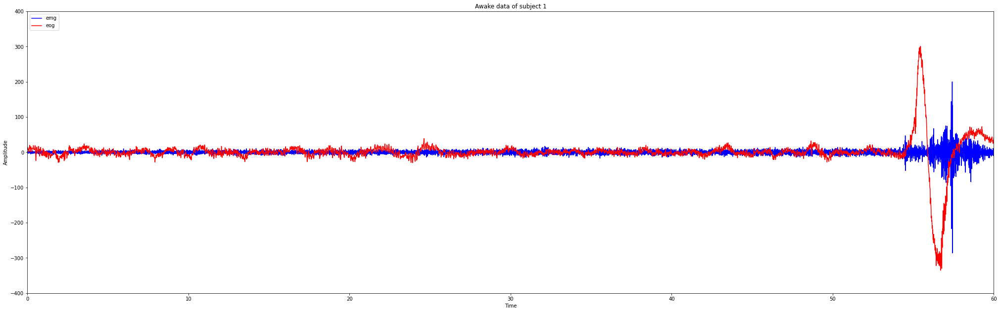

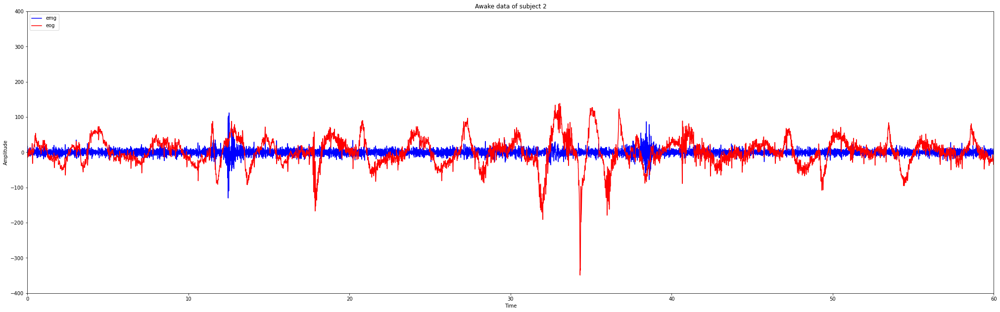

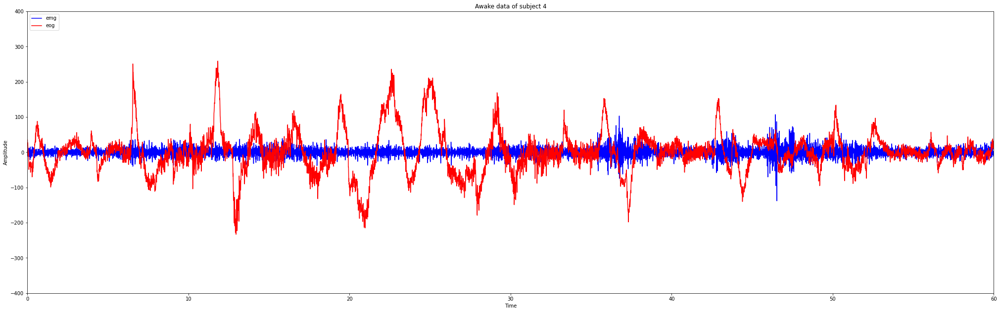

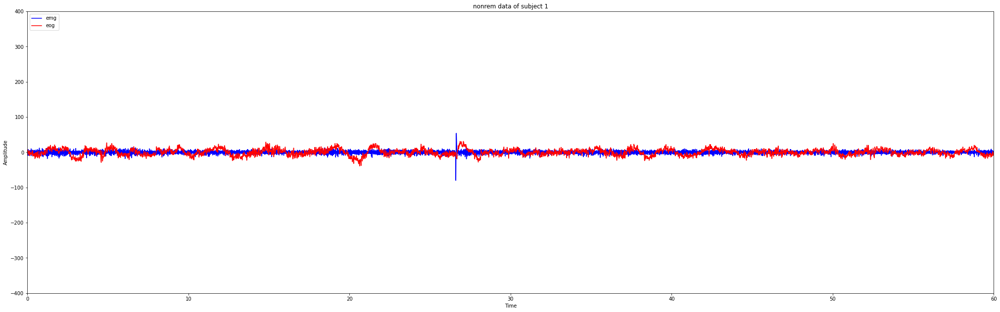

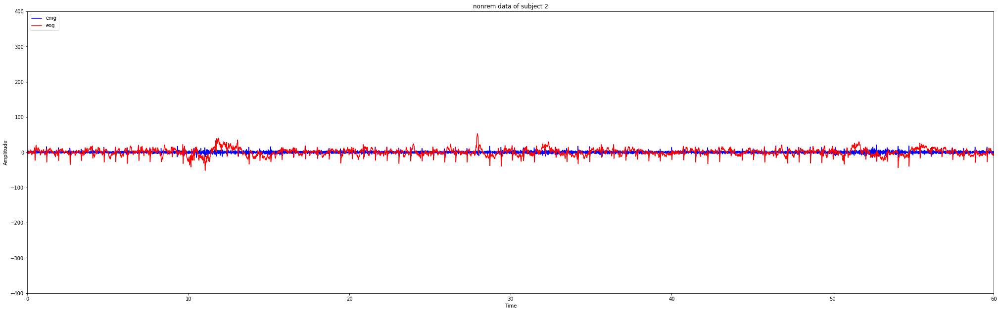

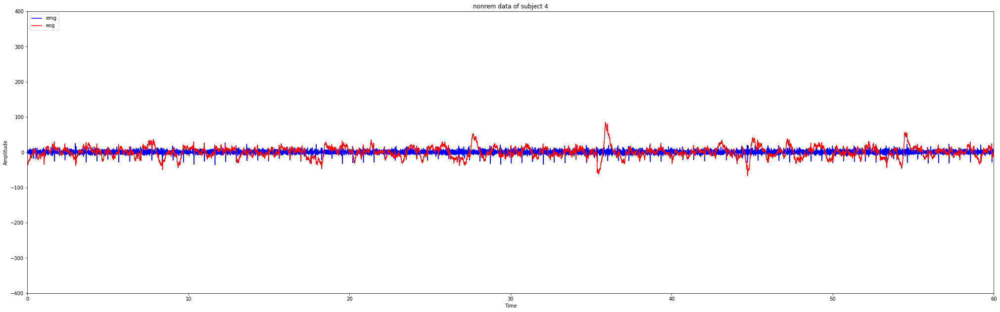

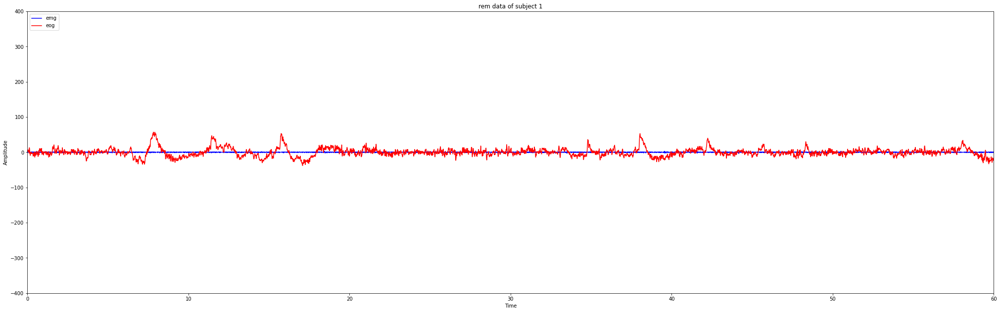

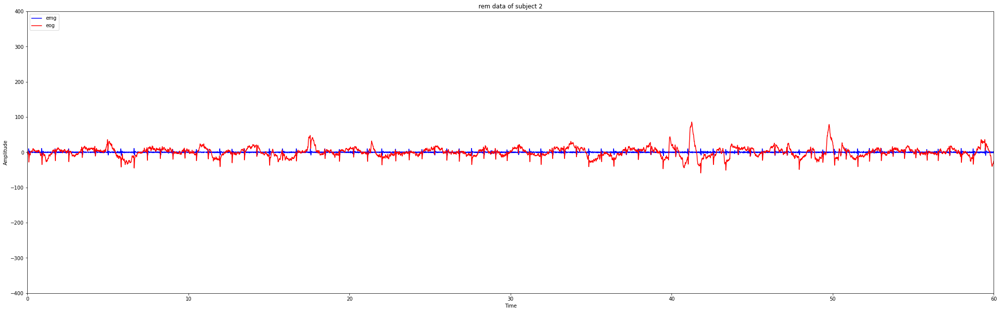

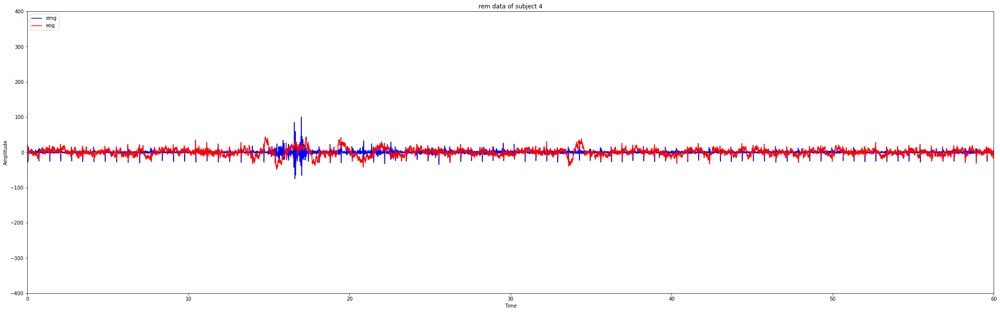

In [409]:
draw_figure_from_dual_raw_data(awake_data[0:-1], "Awake data of subject 1")

draw_figure_from_dual_raw_data(awake_data2[0:-1], "Awake data of subject 2")

draw_figure_from_dual_raw_data(awake_data3[0:-1], "Awake data of subject 4")

draw_figure_from_dual_raw_data(nonrem_data[0:-1], "nonrem data of subject 1")

draw_figure_from_dual_raw_data(nonrem_data2[0:-1], "nonrem data of subject 2")

draw_figure_from_dual_raw_data(nonrem_data3[0:-1], "nonrem data of subject 4")

draw_figure_from_dual_raw_data(rem_data[0:-1], "rem data of subject 1")

draw_figure_from_dual_raw_data(rem_data2[0:-1], "rem data of subject 2")

draw_figure_from_dual_raw_data(rem_data3[0:-1], "rem data of subject 4")

#Frequency domain inspection of the signals

Possible sources of noise:
* Ambient noise such as powerline interference
* ECG artifacts
* Motion artifacts i.e breathing and such



In [410]:
from scipy.fft import fft, fftfreq
import numpy as np

In [411]:

def plot_fourier_transform(data, title, fs=200,xlim=(0,100),ylim=(-1,1)):
  data=np.array(data[0:-1])
  N=len(data)
  yf = fft(data)
  #xf = fftfreq(N, 1 / fs)[:N//2]
  xf = fftfreq(N, 1 / fs)
  fig, axs = plt.subplots()
  fig.set_size_inches(18.5, 10.5)
  axs.set_title(title)
  #axs.plot(xf, 2/N*np.abs(yf[0:N//2]), color='C0')
  axs.plot(xf, 2/N*np.abs(yf), color='C0')
  axs.set_xlabel("Frequency")
  axs.set_ylabel("Amplitude")
  plt.xlim([xlim[0], xlim[1]]);
  plt.ylim([ylim[0], ylim[1]])
  plt.show()

##EMG frequency inspection


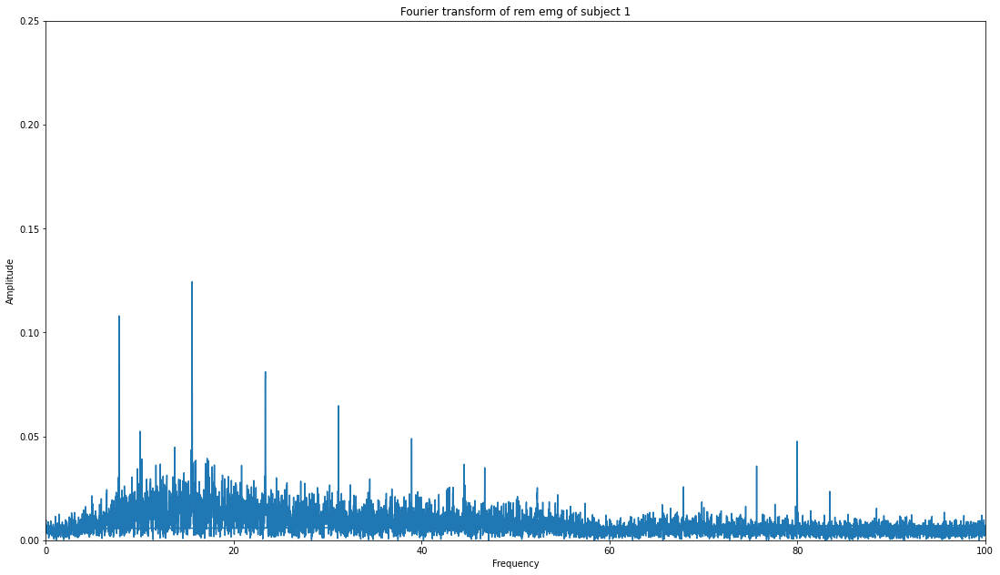

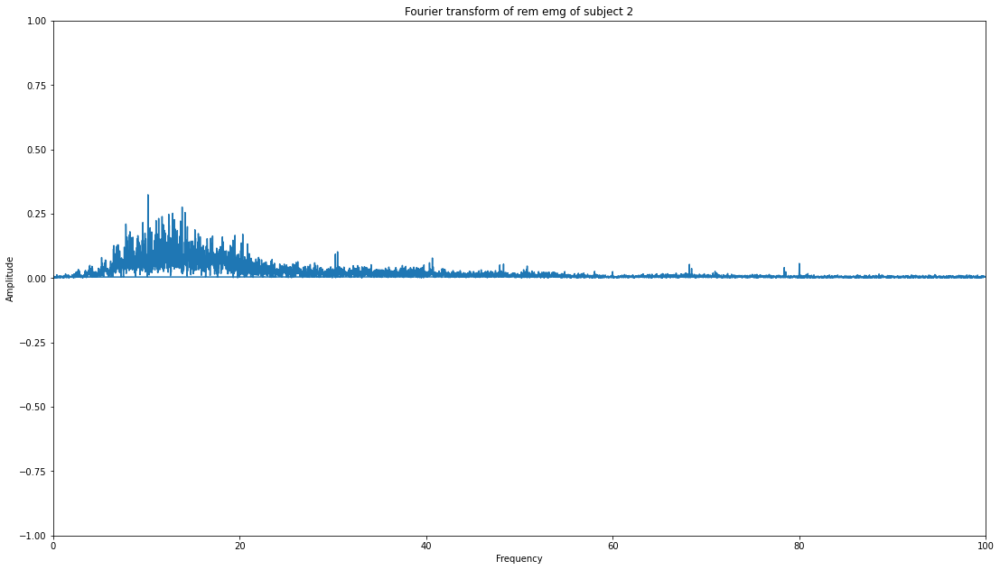

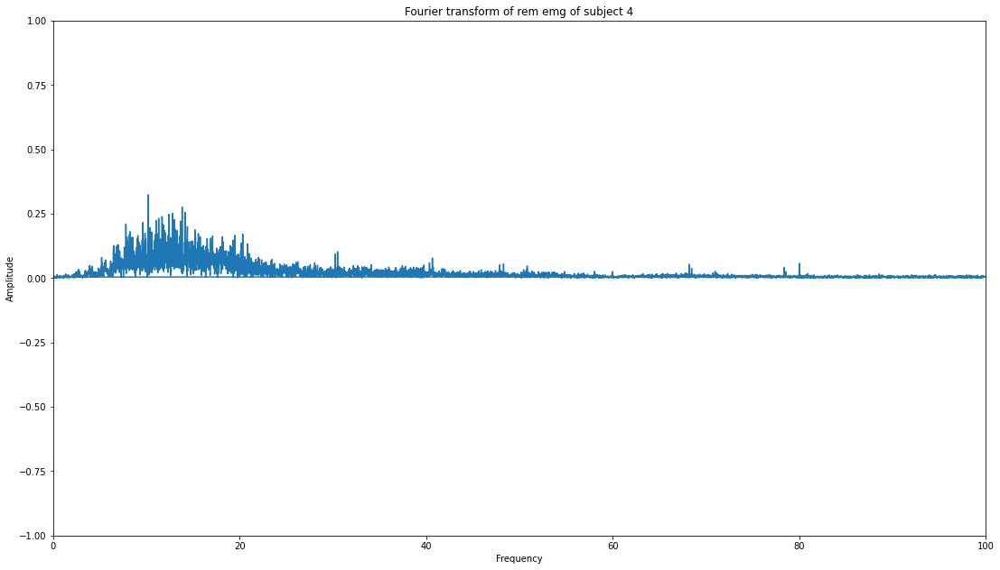

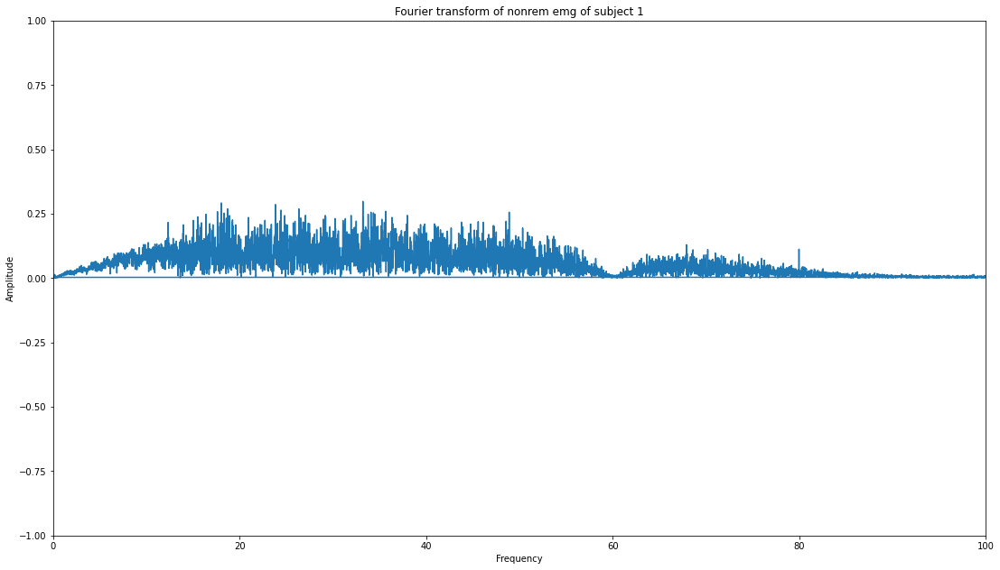

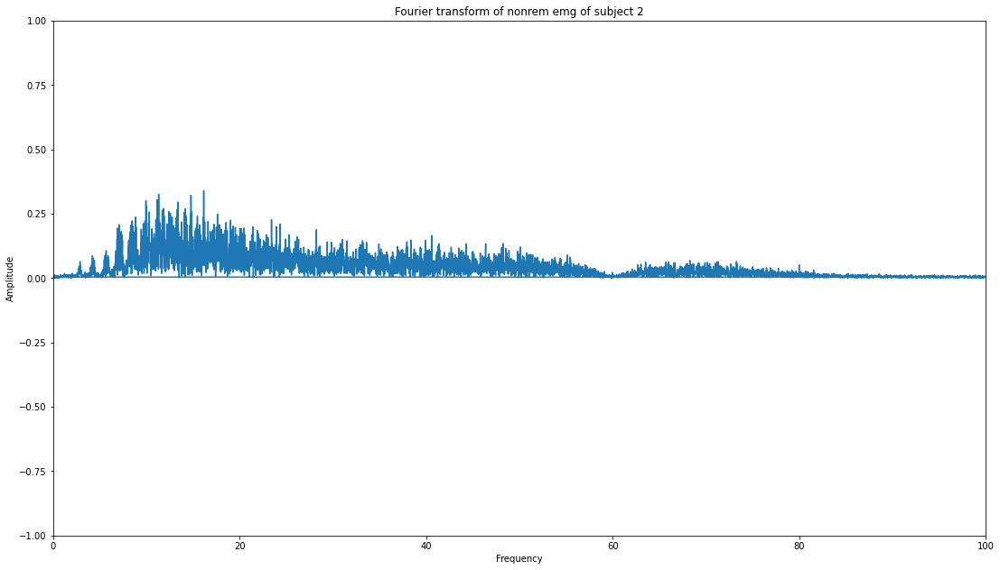

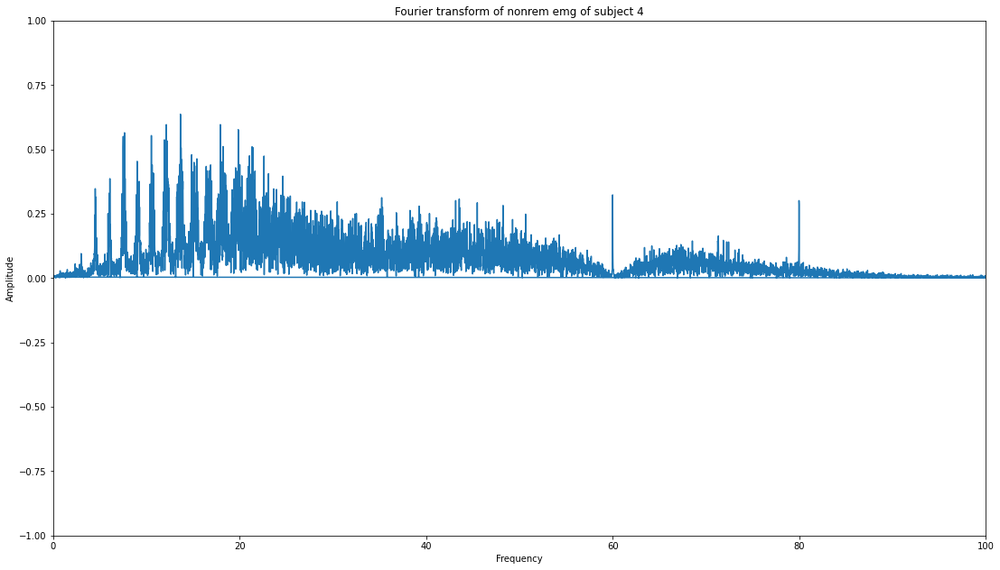

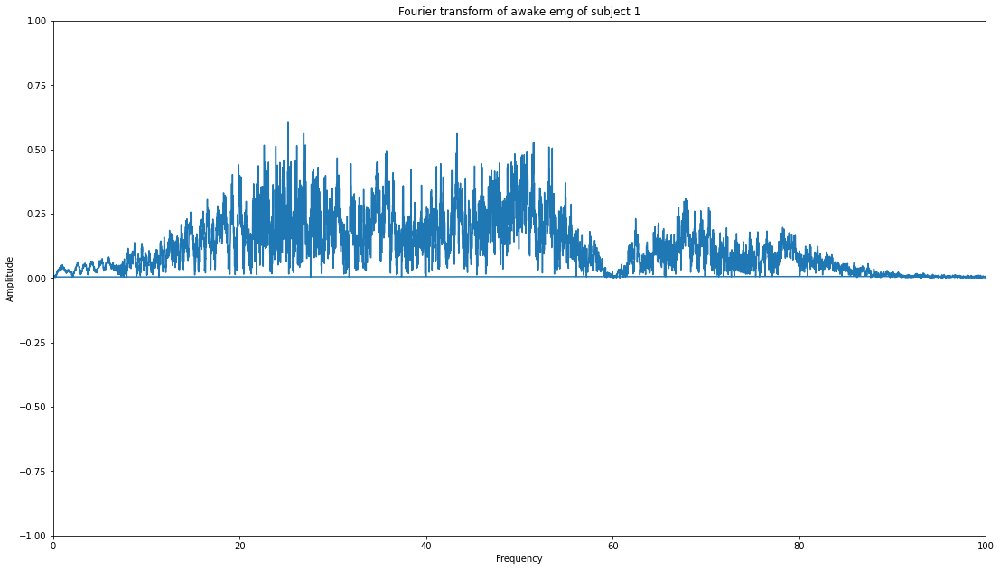

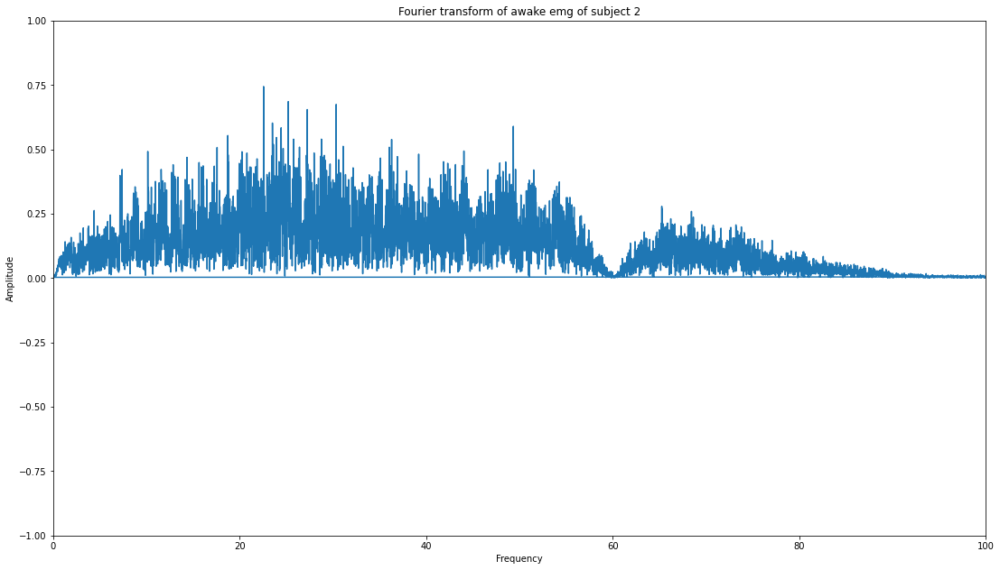

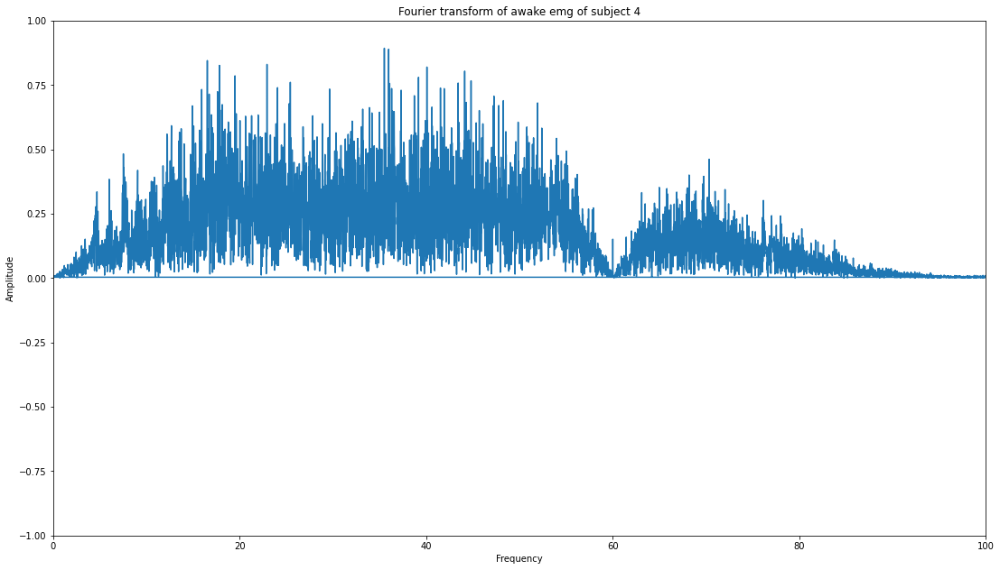

In [412]:
plot_fourier_transform(rem_data["emg"], "Fourier transform of rem emg of subject 1", fs=200,ylim=(0,0.25))
plot_fourier_transform(rem_data2["emg"], "Fourier transform of rem emg of subject 2", fs=200)
plot_fourier_transform(rem_data2["emg"], "Fourier transform of rem emg of subject 4", fs=200)
plot_fourier_transform(nonrem_data["emg"], "Fourier transform of nonrem emg of subject 1", fs=200)
plot_fourier_transform(nonrem_data2["emg"], "Fourier transform of nonrem emg of subject 2", fs=200)
plot_fourier_transform(nonrem_data3["emg"], "Fourier transform of nonrem emg of subject 4", fs=200)
plot_fourier_transform(awake_data["emg"], "Fourier transform of awake emg of subject 1", fs=200)
plot_fourier_transform(awake_data2["emg"], "Fourier transform of awake emg of subject 2", fs=200)
plot_fourier_transform(awake_data3["emg"], "Fourier transform of awake emg of subject 4", fs=200)

##EOG frequency inspection

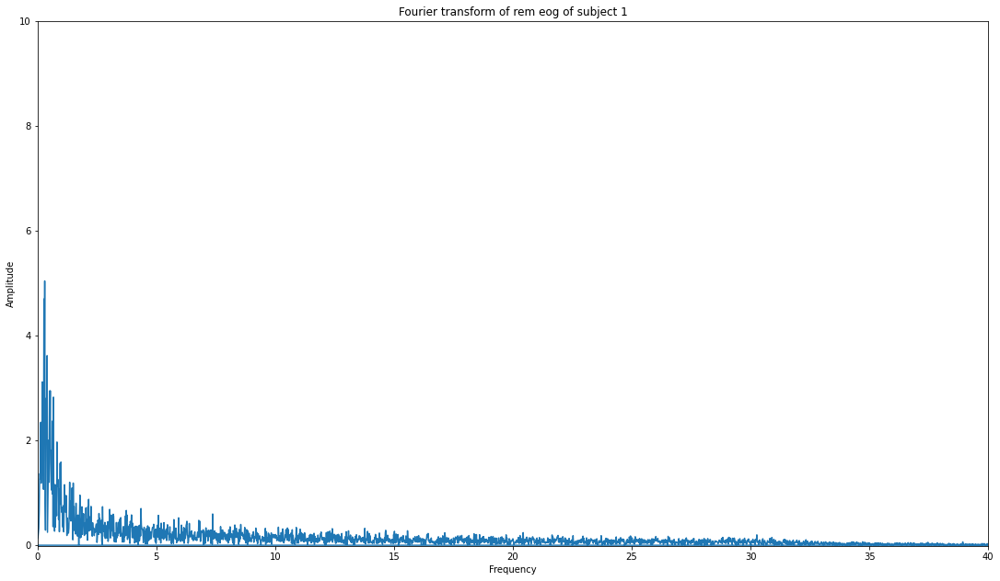

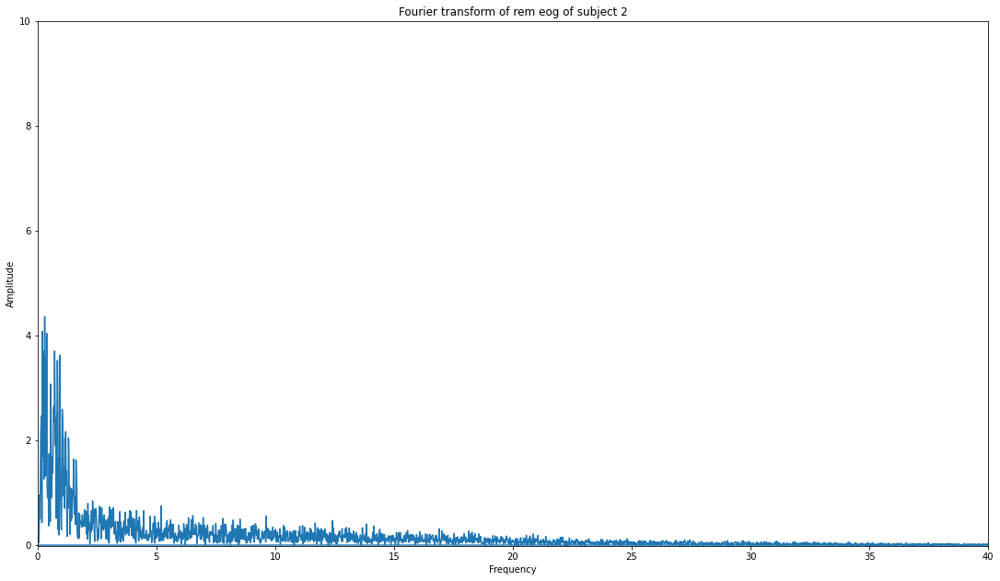

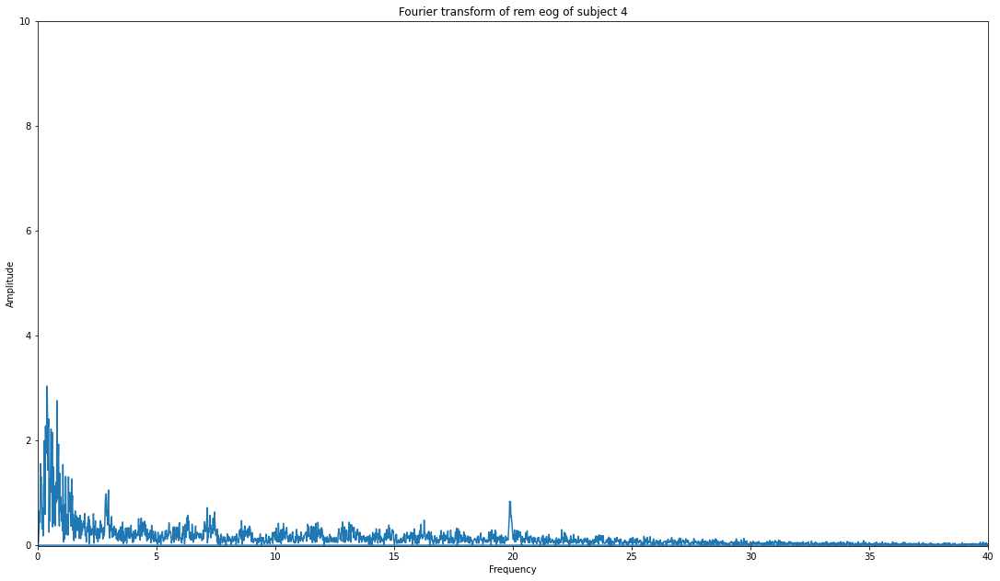

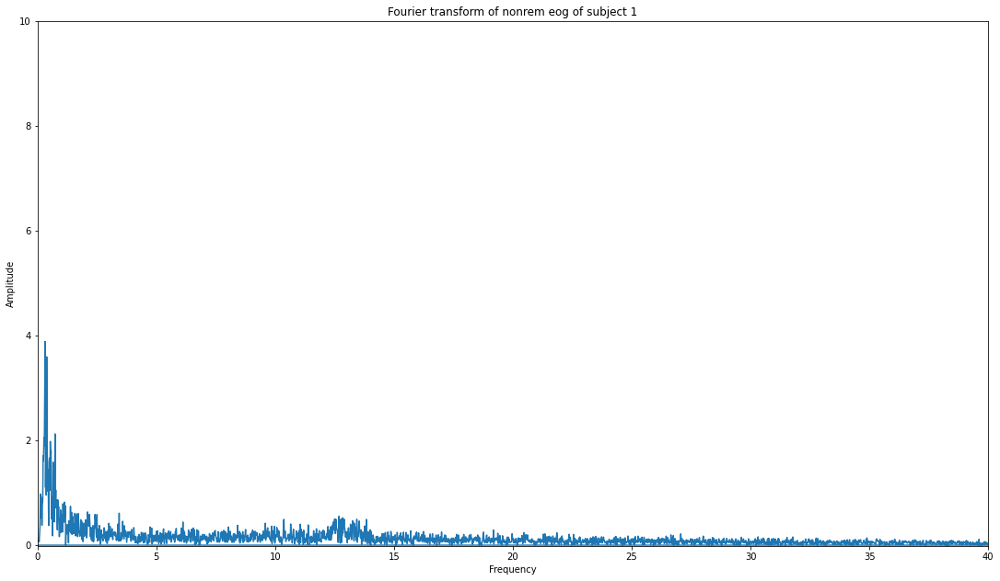

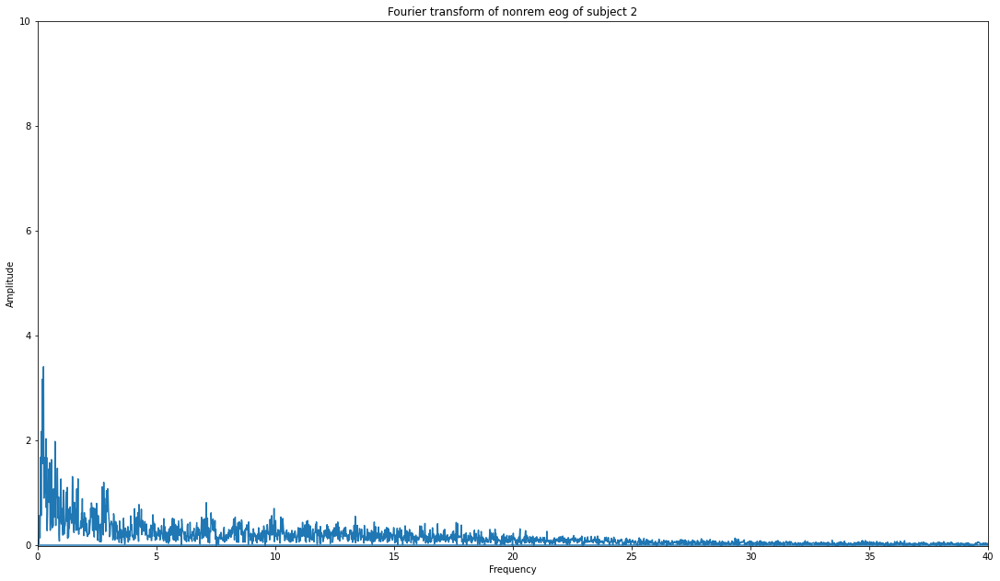

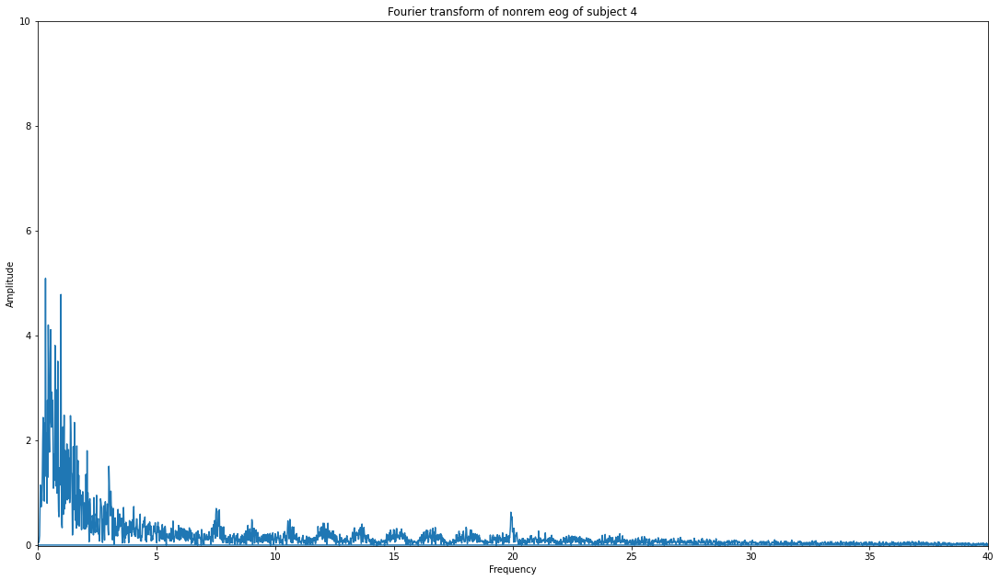

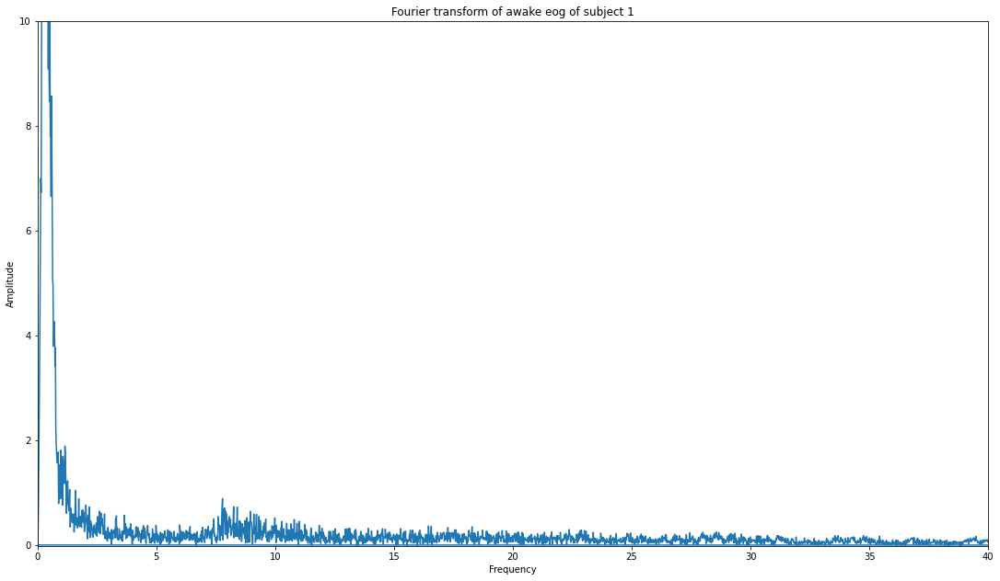

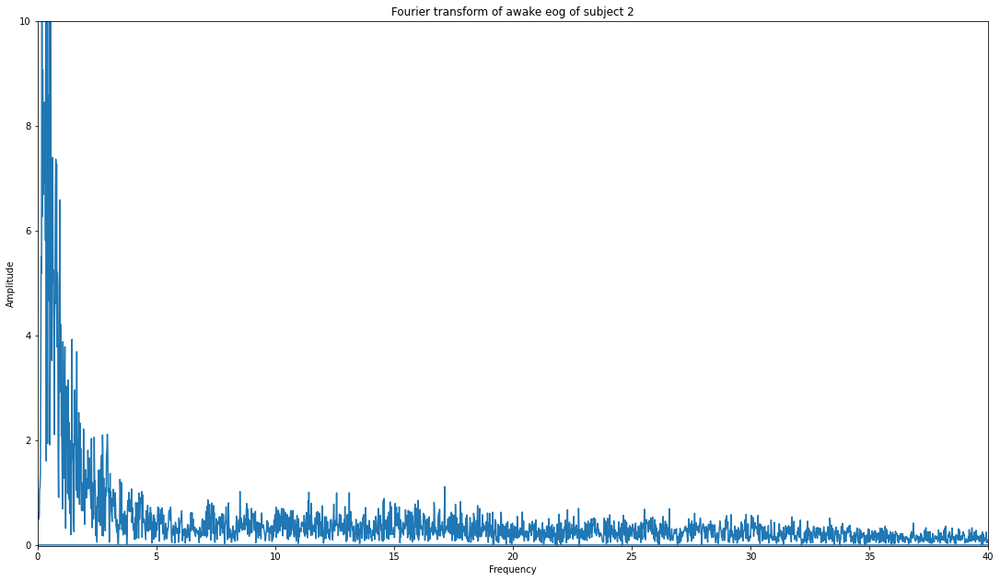

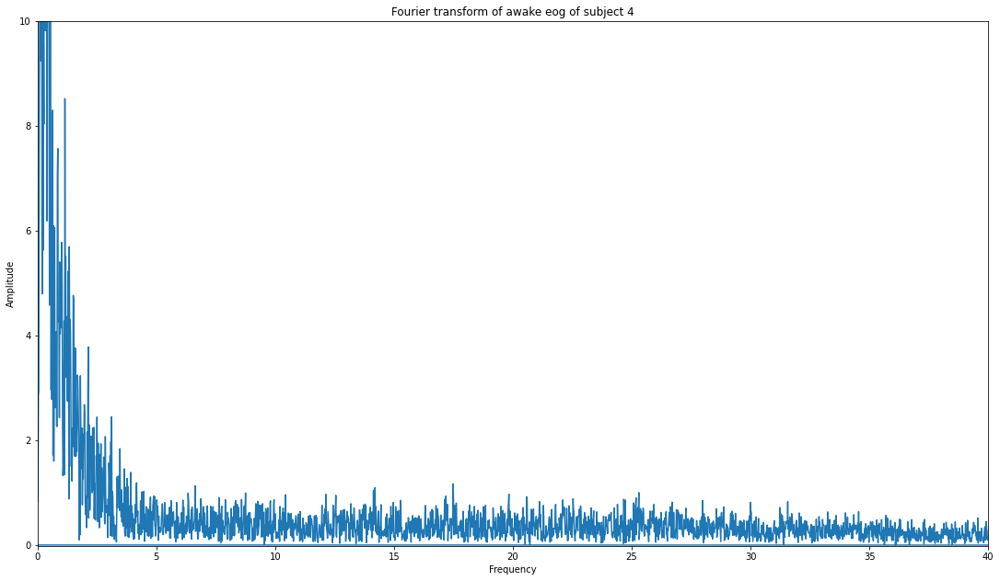

In [413]:
plot_fourier_transform(rem_data["eog"], "Fourier transform of rem eog of subject 1", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(rem_data2["eog"], "Fourier transform of rem eog of subject 2", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(rem_data3["eog"], "Fourier transform of rem eog of subject 4", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(nonrem_data["eog"], "Fourier transform of nonrem eog of subject 1", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(nonrem_data2["eog"], "Fourier transform of nonrem eog of subject 2", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(nonrem_data3["eog"], "Fourier transform of nonrem eog of subject 4", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(awake_data["eog"], "Fourier transform of awake eog of subject 1", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(awake_data2["eog"], "Fourier transform of awake eog of subject 2", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(awake_data3["eog"], "Fourier transform of awake eog of subject 4", fs=200,xlim=(0,40),ylim=(-0.01,10))

Power line interference in eog

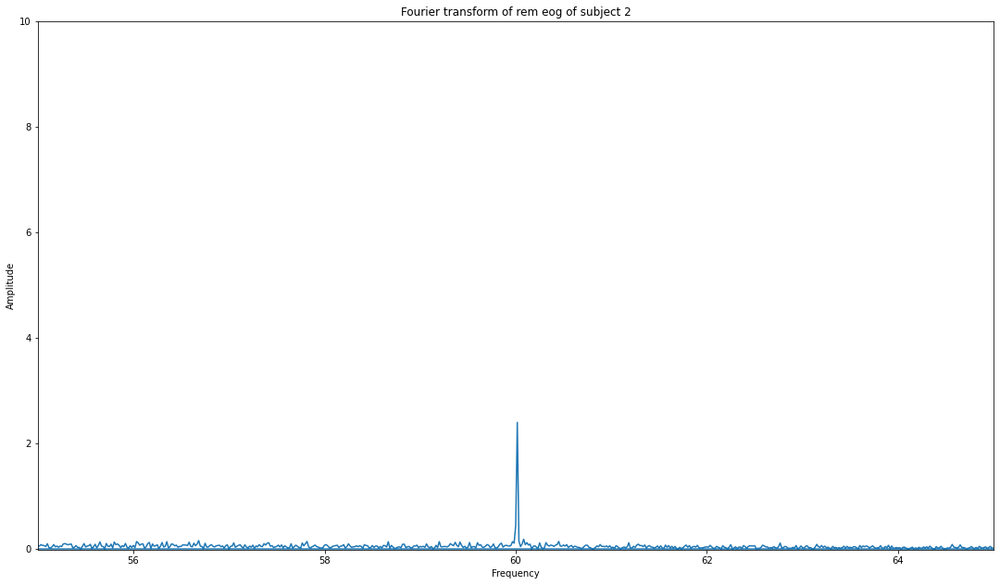

In [414]:
plot_fourier_transform(awake_data3["eog"], "Fourier transform of rem eog of subject 2", fs=200,xlim=(55,65),ylim=(-0.01,10))

#Discovered noise types
##EMG:
* ECG interference
* AWGN - white Gaussian noise cannot be necessarily removed for 100% 

##EOG:
* Typical inteferences that is present in eog signals include sensor, powerline, emg, eeg, electrical network, speech and blinks
* We can see a powerline interference affecting the eog signal. There is a spike in frequency domain at 60Hz.
* We can also see that the eog is affected by the ECG signal since there is a signal component causing distortions every second or so.
* AWGN additive white noise is general while signal acquisition

#Conclusions
There appears to be disrepancies in the data:
In emg samples the frequency component at 60 Hz has been flattened leading to a conclusion that the emg data has been filtered with 60Hz notch filter.

The same will have to be done to the EOG samples.

#Filtration to be done:
* Highpass-filter with 0.1 Hz threshold to get rid of any baseline wondering. 
* Then a notch filter to get rid of any remaining powerline interference.
* Bandpass filtering for certain frequency cut-offs

#Emg filtering
* For emg filtering, the muscle force and the muscle activity are often filtered with a low pass filter to capture the shape or “envelope” of the emg signal as this usually captures better the reflect force generated by a muscle. By changing the low pass cut-off frequency, we can see differences in the signals
* EMG signal is digitally band-pass filtered at 20–90Hz and we can recognize sleep epoches that can be studied further in order to study the emg signal amplitudes within a sleep epoch
* Signal rectification (absolute values) may be needed depending on the analysis but as we are also studying eog signals, we have decided not to use rectification
* Noise cancellation filter is going to be used to remove ecg interference from emg signals

#Eog filtering
* Previous literature uses mainly lowpass and notch filtering in eog signals (Dasgupta1 et al. 2016), hence it is also used in our eog signal filtering
* Powerline interference is a common source of noise in electrical biosignals that occurs usually between 50-60Hz. A notch filer is used to remove the powerline interference at 60Hz
* The signals are band-pass filtered between 1 and 7.5 Hz


###Designing the filters
Notch filter:

* notch fequency: 60 Hz 
* sampling frequency: 200 Hz
* Quality factor: 20

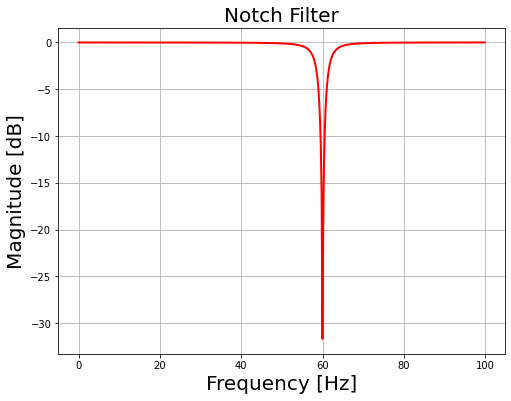

In [415]:
# Create/view notch filter
samp_freq = 200 # Sample frequency (Hz)
notch_freq = 60.0 # Frequency to be removed from signal (Hz)
quality_factor = 20.0 # Quality factor
# Design a notch filter using signal.iirnotch
# method that defines and returns a notch filter's nominator and denominators
def notch(notch_freq,quality_factor,samp_freq):
  b_notch, a_notch = sgnl.iirnotch(notch_freq, quality_factor, samp_freq)
  return b_notch, a_notch
#method that filters a signal with a notch filter
def notch_filter(data,fs=200,notch_freq=60,quality_factor=20):
  b_notch, a_notch = notch(notch_freq, quality_factor, fs)
  return(sgnl.filtfilt(b_notch, a_notch, data))


b_notch, a_notch = notch(notch_freq, quality_factor, samp_freq)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_notch, a_notch, fs=samp_freq)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)),
         'r', label='Bandpass filter', linewidth='2')
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('Notch Filter', fontsize=20)
plt.grid()


Designing the Highpass filter:
* Type: butterworth
* Order: 5
* Cutoff_freq: 0.1 Hz

Designing the Lowpass filter:
* Type: butterworth
* Order: 5
* Cutoff_freq: X Hz

Designing the Bandpass filter:
* Type: butterworth
* Order: 5
* Cutoff_freq: X Hz

In [416]:
def butter_highpass(cutoff, fs=200, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = sgnl.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(signal, cutoff=0.1, fs=200, order=5):
    b, a = butter_highpass(cutoff=cutoff, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, signal)
    return y

def butter_lowpass(cutoff, fs=200, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = sgnl.butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(signal, cutoff=0.1, fs=200, order=5):
    b, a = butter_lowpass(cutoff=cutoff, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, signal)
    return y

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = sgnl.butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut=1, highcut=7.5, fs=200, order=5):
    b, a = butter_bandpass(lowcut=lowcut, highcut=highcut, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, data)
    return y

# Bandpass filter for emg
def butter_bandpass_filter_2(data, lowcut=20, highcut=80, fs=200, order=5):
    b, a = butter_bandpass(lowcut=lowcut, highcut=highcut, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, data)
    # process EMG signal: rectify
    #emg_rectified = abs(y)
    return y #emg_rectified
def butter_bandstop(lowcut,highcut,fs=200,order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = sgnl.butter(order, [low, high], btype='bandstop')
    return b,a

def butter_bandstop_filter(data, lowcut, highcut, fs=200, order=5):
        b,a=butter_bandstop(lowcut,highcut,fs,order)
        y = sgnl.filtfilt(b, a, data)
        return y

# Lowpass filter for emg
def butter_lowpass_filter_2(signal, cutoff=20, fs=200, order=5):
    b, a = butter_lowpass(cutoff=cutoff, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, signal)
    #emg_rectified = abs(y)
    return y #emg_rectified

def moving_average(signal, window_length_in_samples):
  moving_averages=[]
  for i in range(0,len(signal) - window_length_in_samples+1):
    window_average = round(np.sum(signal[i:i+window_length_in_samples])/window_length_in_samples,4)
    moving_averages.append(window_average)
  return moving_averages

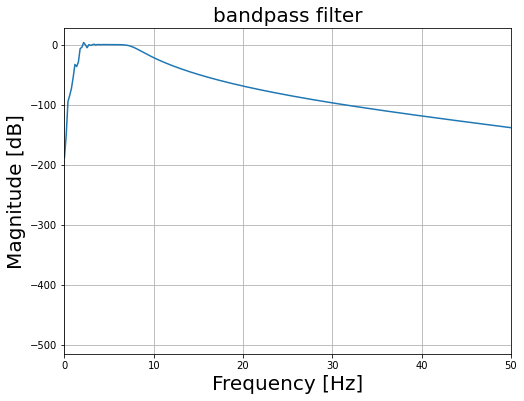

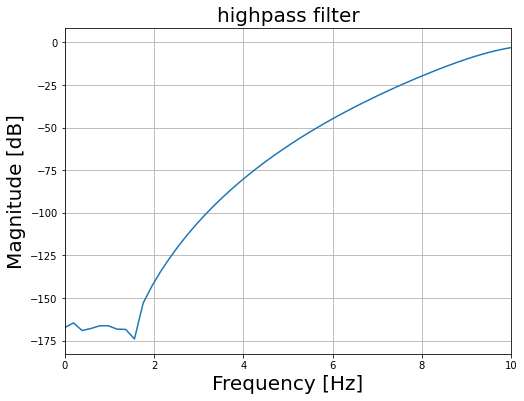

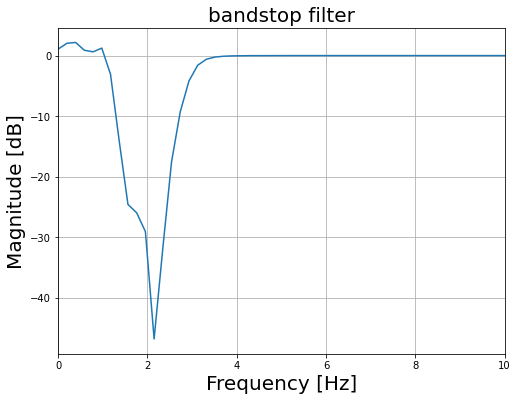

In [417]:
#frequency responces
b_butter, a_butter = butter_bandpass(1,7.5,200,7)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_butter, a_butter, fs=200)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)))
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('bandpass filter', fontsize=20)
plt.xlim([0,50])
plt.grid()

b_butter, a_butter = butter_highpass(10,200,10)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_butter, a_butter, fs=200)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)))
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('highpass filter', fontsize=20)
plt.xlim([0,10])
plt.grid()

b_butter, a_butter = butter_bandstop(1,3,200,5)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_butter, a_butter, fs=200)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)))
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('bandstop filter', fontsize=20)
plt.xlim([0,10])
plt.grid()

In [418]:
def filter_emg_signal(signal, fs=200, window_length=3):
  notched_signal=notch_filter(signal,fs=fs,notch_freq=60)
  #filtered_signal = butter_bandpass_filter(notched_signal, lowcut=30, highcut=90, fs=200, order=5)
  filtered_signal=butter_bandstop_filter(notched_signal,lowcut=5, highcut=30, fs=200, order=6)
  absolute_valued_signal=np.absolute(filtered_signal)
  return absolute_valued_signal
  moving_averaged_signal=moving_average(absolute_valued_signal,window_length)
  return moving_averaged_signal
"""
def filter_emg_signal(signal, fs=200):
  notched_signal=notch_filter(signal,fs=fs,notch_freq=60)
  #notched_signal=notch_filter(notched_signal,fs=fs, notch_freq=1.5)
  #filtered_signal=butter_bandstop_filter(notched_signal,1,3,fs=fs,order=5)
  filtered_signal=butter_bandstop_filter(notched_signal,lowcut=5, highcut=30, fs=200, order=6)
  return filtered_signal
  #return notched_signal
"""
def filter_eog_signal(signal,fs=200):
  filtered_signal=butter_lowpass_filter(signal,cutoff=8,fs=fs)
  return filtered_signal

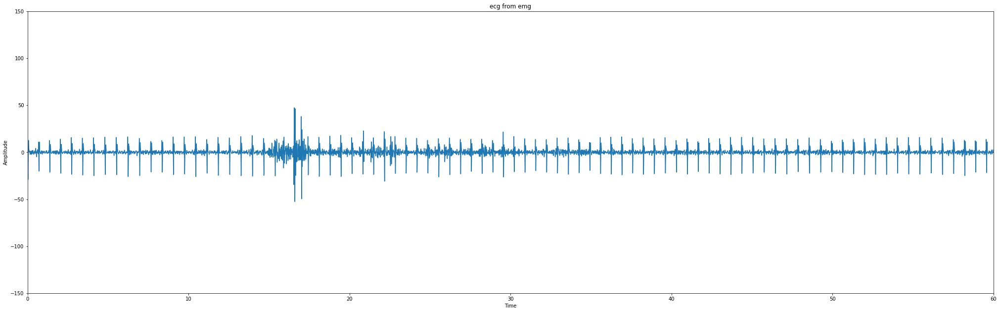

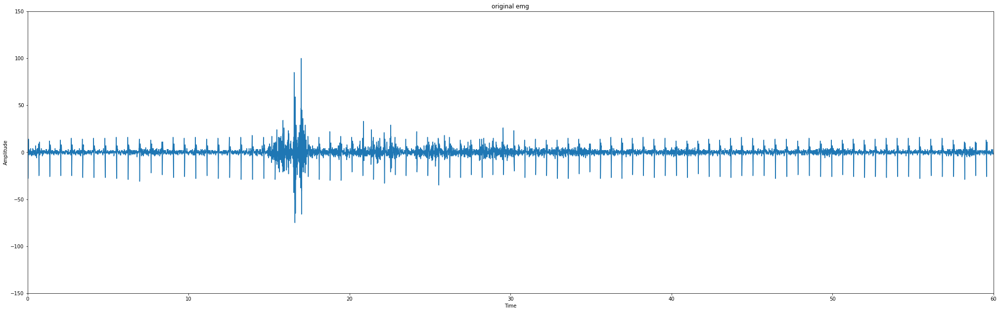

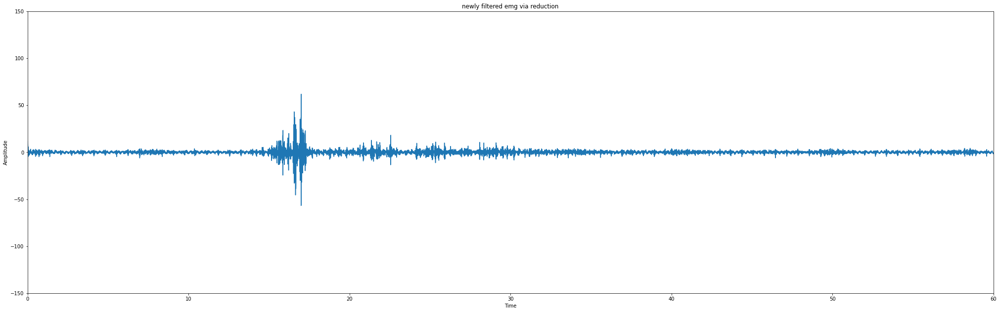

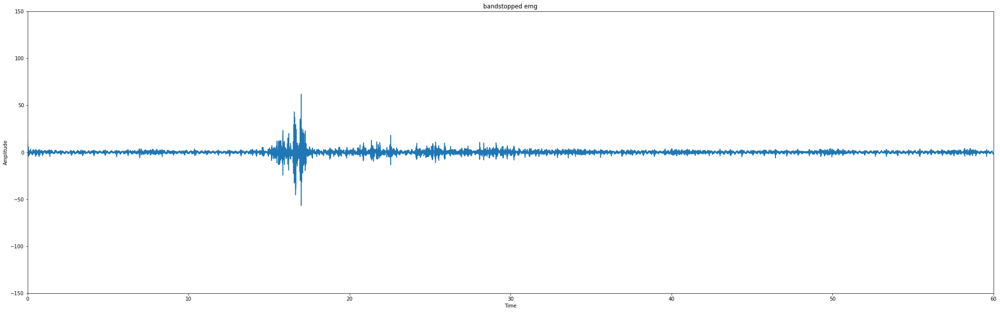

In [419]:
ecg_from_emg={"eog":filter_eog_signal(rem_data3["eog"][0:-1]),"emg":butter_bandpass_filter(rem_data3["emg"][0:-1],lowcut=5, highcut=30, fs=200, order=6)}
draw_figure_from_raw_data(ecg_from_emg["emg"], "ecg from emg",ylim=(-150,150))
draw_figure_from_raw_data(rem_data3["emg"], "original emg",ylim=(-150,150))
def reduce(listA,listB):
  new_list=[]
  for itema,itemb in zip(listA,listB):
    new_list.append(itema-itemb)
  return new_list
reduction = reduce(rem_data3["emg"][0:-1],ecg_from_emg["emg"])
draw_figure_from_raw_data(reduction, "newly filtered emg via reduction",ylim=(-150,150))

filtered_awake_emg=butter_bandstop_filter(rem_data3["emg"][0:-1],lowcut=5, highcut=30, fs=200, order=6)
draw_figure_from_raw_data(filtered_awake_emg, "bandstopped emg",ylim=(-150,150))

In [420]:
filtered_awake_data={"eog":filter_eog_signal(awake_data["eog"][0:-1]),"emg":filter_emg_signal(awake_data["emg"][0:-1])}
filtered_awake_data2={"eog":filter_eog_signal(awake_data2["eog"][0:-1]),"emg":filter_emg_signal(awake_data2["emg"][0:-1])}
filtered_awake_data3={"eog":filter_eog_signal(awake_data3["eog"][0:-1]),"emg":filter_emg_signal(awake_data3["emg"][0:-1])}
filtered_nonrem_data={"eog":filter_eog_signal(nonrem_data["eog"][0:-1]),"emg":filter_emg_signal(nonrem_data["emg"][0:-1])}
filtered_nonrem_data2={"eog":filter_eog_signal(nonrem_data2["eog"][0:-1]),"emg":filter_emg_signal(nonrem_data2["emg"][0:-1])}
filtered_nonrem_data3={"eog":filter_eog_signal(nonrem_data3["eog"][0:-1]),"emg":filter_emg_signal(nonrem_data3["emg"][0:-1])}
filtered_rem_data={"eog":filter_eog_signal(rem_data["eog"][0:-1]),"emg":filter_emg_signal(rem_data["emg"][0:-1])}
filtered_rem_data2={"eog":filter_eog_signal(rem_data2["eog"][0:-1]),"emg":filter_emg_signal(rem_data2["emg"][0:-1])}
filtered_rem_data3={"eog":filter_eog_signal(rem_data3["eog"][0:-1]),"emg":filter_emg_signal(rem_data3["emg"][0:-1])}


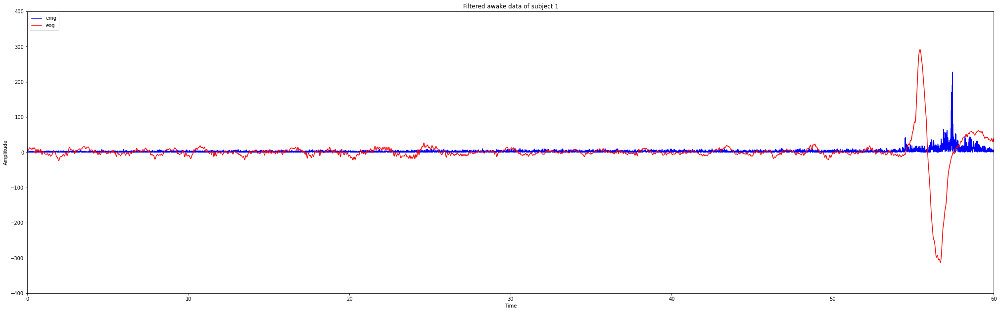

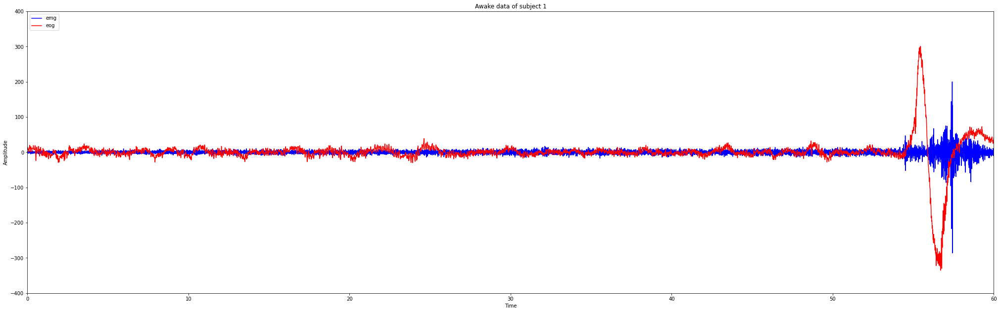

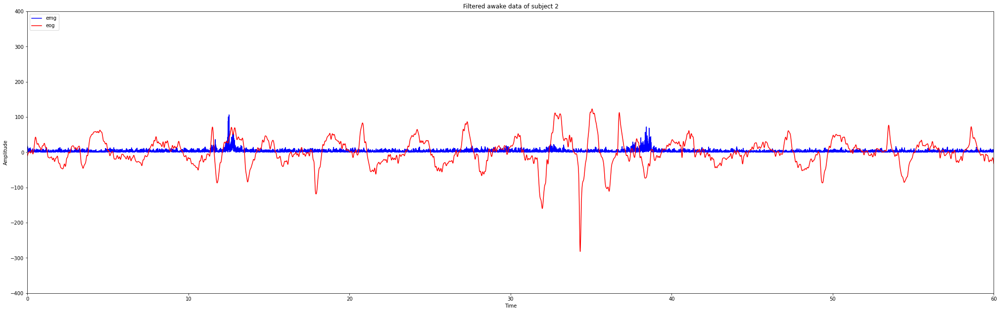

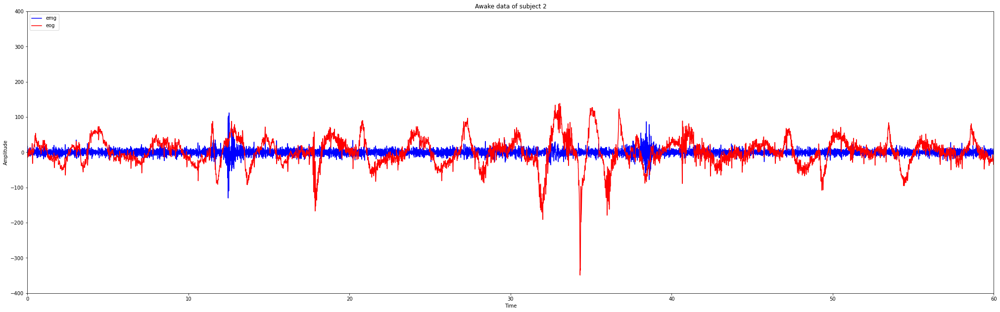

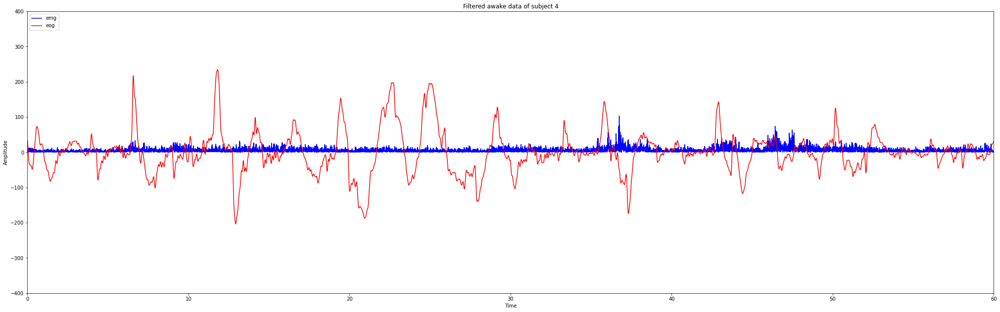

...

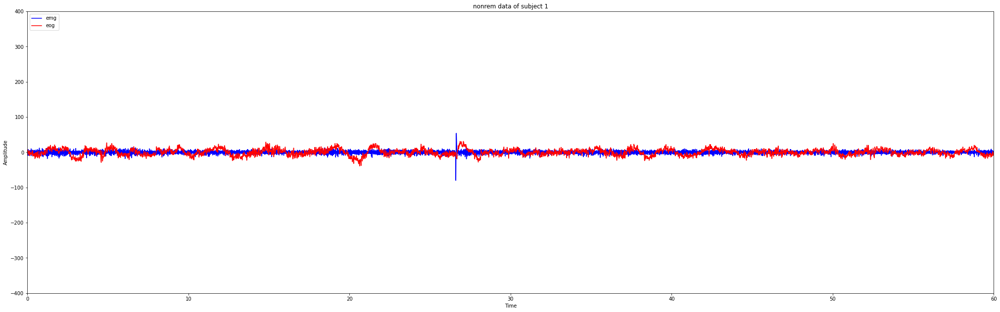

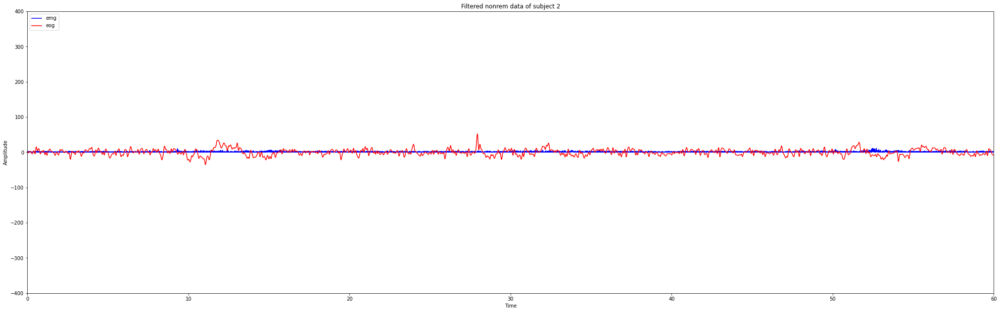

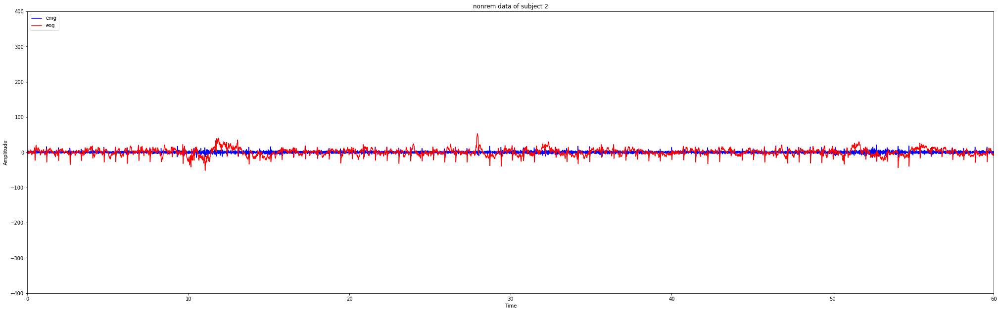

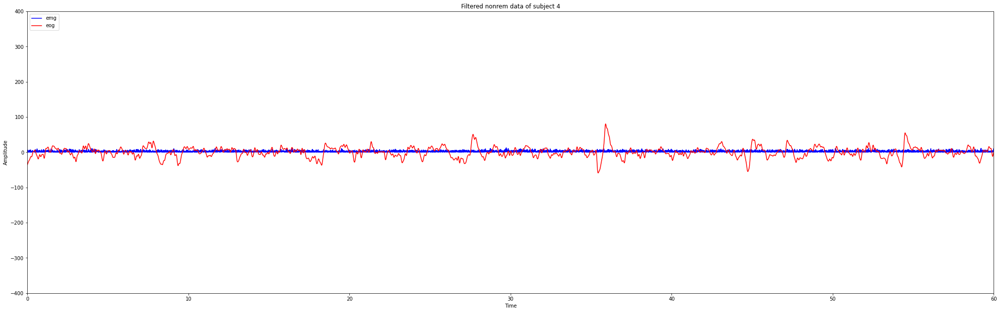

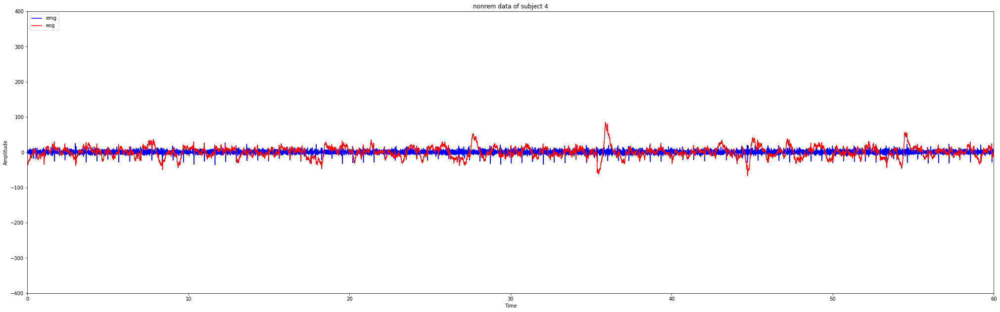

In [421]:
draw_figure_from_dual_raw_data(filtered_awake_data, "Filtered awake data of subject 1" )
draw_figure_from_dual_raw_data(awake_data[0:-1], "Awake data of subject 1")
draw_figure_from_dual_raw_data(filtered_awake_data2, "Filtered awake data of subject 2")
draw_figure_from_dual_raw_data(awake_data2[0:-1], "Awake data of subject 2")
draw_figure_from_dual_raw_data(filtered_awake_data3, "Filtered awake data of subject 4")
draw_figure_from_dual_raw_data(awake_data3[0:-1], "Awake data of subject 4")
draw_figure_from_dual_raw_data(filtered_rem_data, "Filtered rem data of subject 1")
draw_figure_from_dual_raw_data(rem_data[0:-1], "rem data of subject 1")
draw_figure_from_dual_raw_data(filtered_rem_data2, "Filtered rem data of subject 2")
draw_figure_from_dual_raw_data(rem_data2[0:-1], "rem data of subject 2")
draw_figure_from_dual_raw_data(filtered_rem_data3, "Filtered rem data of subject 4")
draw_figure_from_dual_raw_data(rem_data3[0:-1], "rem data of subject 4")
draw_figure_from_dual_raw_data(filtered_nonrem_data, "Filtered nonrem data of subject 1")
draw_figure_from_dual_raw_data(nonrem_data[0:-1], "nonrem data of subject 1")
draw_figure_from_dual_raw_data(filtered_nonrem_data2, "Filtered nonrem data of subject 2")
draw_figure_from_dual_raw_data(nonrem_data2[0:-1], "nonrem data of subject 2")
draw_figure_from_dual_raw_data(filtered_nonrem_data3, "Filtered nonrem data of subject 4")
draw_figure_from_dual_raw_data(nonrem_data3[0:-1], "nonrem data of subject 4")

#Feature extraction

In [422]:
def standardize(dataframe,columns,std_dict=0):
  if std_dict == 0:
    std_dict = {}
    for column_name in columns:
      column=dataframe[column_name]
      mean = np.mean(column)
      std = np.std(column)
      std_dict[column_name]=(mean,std)
      z_scores=[]
      for value in column:
          z_scores.append((value-mean)/std)
      for i in range(len(z_scores)):
          dataframe.at[i, column_name]=z_scores[i]
    return std_dict
  else:
    for column_name in columns:
      column=dataframe[column_name]
      mean = std_dict[column_name][0]
      std = std_dict[column_name][1]
      z_scores=[]
      for value in column:
          z_scores.append((value-mean)/std)
      for i in range(len(z_scores)):
          dataframe.at[i, column_name]=z_scores[i]

def getTypes(array):
    types=[]
    for i in range(len(array)):
        if(array[i] not in types):
            types.append(array[i])
    return types

def plotPCA(PCA,labels,message):
    colors=["green","blue","red"]
    types=getTypes(labels)
    temp_PCA=PCA.copy()
    temp_PCA['cluster']=labels
    x=[]
    y=[]
    for typ in types:
        x_type=[]
        y_type=[]
        for i in range( len(labels)):
            if(temp_PCA["cluster"][i]==typ):
                x_type.append(temp_PCA['principal component 1'][i])
                y_type.append(temp_PCA['principal component 2'][i])
        x.append(x_type)
        y.append(y_type)
    fig = plt.figure(figsize = (11,11))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('principal component 1', fontsize = 15)
    ax.set_ylabel('principal component 2', fontsize = 15)
    ax.set_title('PCA of clustering with '+message, fontsize = 20)
    number_of_colors = len(types)

    #colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    #         for i in range(number_of_colors)]
    #print(len(colors))
    #print(len(types))
    for i, color in zip(range(len(types)),colors):  
        ax.scatter(x[i], y[i], c = color, s = 50)
    ax.legend(types)
    ax.grid()

In [423]:
# Defining and choosing feature extraction
# We have chosed different feature selection methods to include variaty of features subsets that contains statistical measurements (e.g., mean, variance, kurtosis, and skewness), spectral measurements (e.g., spectral centroid), and nonlinear features (e.g., energy)
# Nonlinear features support a complex and dynamic description for nonstationary electrophysiological signals, which are generally applied in sleep stage studies. For instance, a well-known nonlinear measurement includes energy


from scipy.stats.stats import kurtosis
def threshold_cross(data,threshold):
  count =0 
  for index in range(1,len(data)):
    if abs(data[index])>=threshold:
      count += 1
  return count
def emg_peak_statistics(data1):
  peak_indices=sgnl.find_peaks(data1,width=10)[0] #returns tuple
  if len(peak_indices)==0:
    return 0,0,0,0
  peaks = np.asarray(data1)[peak_indices]
  mean = np.mean(peaks)
  variance=(np.std(peaks))**2
  prominences=sgnl.peak_prominences(data1,peak_indices)
  peak_prominence_mean,peak_prominences_variance=np.mean(prominences),np.std(prominences)**2
  return variance, mean,peak_prominence_mean,peak_prominences_variance


def eog_peak_statistics(data1):
  peak_indices=sgnl.find_peaks(data1,width=10)[0] #returns tuple
  if len(peak_indices)==0:
    return 0,0,0,0,0
  peaks = np.absolute(data1[peak_indices])
  mean = np.mean(peaks)
  variance=(np.std(peaks))**2
  prominences=sgnl.peak_prominences(data1,peak_indices)
  peak_prominence_mean,peak_prominences_variance=np.mean(prominences),np.std(prominences)**2
  peak_count=float(len(peak_indices))
  return variance, mean,peak_prominence_mean,peak_prominences_variance, peak_count

def extract_features_emg(data,fs=200):
  spectral_centroid=tsfel.feature_extraction.features.spectral_centroid(data, fs=fs) # spectral centroid is the frequency-weighted sum of the magnitude spectrum of the signal normalized by its unweighted sum, showing the location of spectrum centre
  rms =tsfel.feature_extraction.features.rms(data) # by computing the  rms  value  in  emg,  it  reveals information about the contraction level of muscles amplitude observed over the data
  spectral_spread = tsfel.feature_extraction.features.spectral_spread(data, fs=fs)
  mean = np.mean(data)
  positive_turning = float(tsfel.feature_extraction.features.positive_turning(data)) #the number of positive wave turns in frequency changes
  negative_turning = float(tsfel.feature_extraction.features.negative_turning(data)) #the number of negative wave turns in frequency changes
  abs_energy = tsfel.feature_extraction.features.abs_energy(data) # Energy is a measure that indicates instantaneous changes of signal amplitude
  variance = (np.std(data))**2 #VAR expresses the power of eog and emg signals as useable features
  threshold_cross60 = float(threshold_cross(data,15)) #the number of times the eog and emg signals pass the threshold amplitude value of 60
  threshold_cross25 = float(threshold_cross(data,8)) #the number of times the eog and emg signals pass the threshold amplitude value of 25
  peakvariance,peakmean, peak_prominence_mean,peak_prominences_variance = emg_peak_statistics(data) #mean and variance values of eog and emg signal peaks
  kurtosiss = kurtosis(data) # this parameter is a good indicator of the amplitude and distribution of time series in terms of data distribution
  skewness = skew(data) # this parameter is a good indicator of the amplitude and distribution of time series in terms of data distribution
  return [rms,spectral_centroid,spectral_spread,mean,positive_turning,negative_turning,abs_energy,threshold_cross60,threshold_cross25,variance,peakvariance,peakmean,peak_prominence_mean,peak_prominences_variance,kurtosiss,skewness]


def extract_features_eog(data,fs=200):
  spectral_centroid=tsfel.feature_extraction.features.spectral_centroid(data, fs=fs) # spectral centroid is the frequency-weighted sum of the magnitude spectrum of the signal normalized by its unweighted sum, showing the location of spectrum centre
  rms =tsfel.feature_extraction.features.rms(data) # by computing the  rms  value  in  emg,  it  reveals information about the contraction level of muscles amplitude observed over the data
  mean=np.mean(np.absolute(data))
  spectral_spread = tsfel.feature_extraction.features.spectral_spread(data, fs=fs)
  zero_cross = float(tsfel.feature_extraction.features.zero_cross(data)) # ZC is the number of times that emg/eog signals crosses zero
  positive_turning = float(tsfel.feature_extraction.features.positive_turning(data)) #the number of positive wave turns in frequency changes
  negative_turning = float(tsfel.feature_extraction.features.negative_turning(data)) #the number of negative wave turns in frequency changes
  abs_energy = tsfel.feature_extraction.features.abs_energy(data) # Energy is a measure that indicates instantaneous changes of signal amplitude
  variance = (np.std(data))**2 #VAR expresses the power of eog and emg signals as useable features
  threshold_cross60 = float(threshold_cross(data,60)) #the number of times the eog and emg signals pass the threshold amplitude value of 60
  threshold_cross25 = float(threshold_cross(data,25)) #the number of times the eog and emg signals pass the threshold amplitude value of 25
  peakvariance,peakmean, peak_prominence_mean,peak_prominences_variance,peak_count = eog_peak_statistics(data) #mean and variance values of eog and emg signal peaks
  kurtosiss = kurtosis(data) # this parameter is a good indicator of the amplitude and distribution of time series in terms of data distribution
  skewness = skew(data) # this parameter is a good indicator of the amplitude and distribution of time series in terms of data distribution
  return [rms,mean,spectral_centroid,spectral_spread,zero_cross,positive_turning,negative_turning,abs_energy
          ,threshold_cross60,threshold_cross25,variance,peakvariance,peakmean
          ,peak_prominence_mean,peak_prominences_variance,peak_count,kurtosiss,skewness]

#Lable setting including features for sleep stages of awake, nonrem and rem

In [424]:
#data_set={"labels":[],"rms_eog":[],"spectral_centroid_eog":[],"spectral_spread_eog":[]}
data_set={"labels":[]}
features_emg=["rms_emg", 	"spectral_centroid_emg", 	"spectral_spread_emg" 
              ,"mean_emg","positive_turning_emg","negative_turning_emg"
              ,"abs_energy_emg","threshold_cross_emg_60","threshold_cross_emg_25","variance_emg","peak_variance_emg","peak_mean_emg","peak_prominence_mean_emg","peak_prominences_variance_emg","kurtosis_emg","skew_emg"]
features_eog=["rms_eog", "mean_eog",	"spectral_centroid_eog", 	"spectral_spread_eog"
              ,"zero_cross_eog","positive_turning_eog","negative_turning_eog"
              ,"abs_energy_eog","threshold_cross_eog_60","threshold_cross_eog_25","variance_eog"
              ,"peak_variance_eog","peak_mean_eog","peak_prominence_mean_eog","peak_prominences_variance_eog"
              ,"peak_count_eog","kurtosis_eog","skew_eog"]

for feature in features_emg:
  data_set[feature]=[]
for feature in features_eog:
  data_set[feature]=[]

for sleep_state in train_paths.keys():
  files = os.listdir(train_paths[sleep_state])
  for filename in files:
    if ".csv" in filename:
      signal_df=pd.read_csv(train_paths[sleep_state]+"/"+filename)
      real_features_emg = extract_features_emg(filter_emg_signal(signal_df["emg"][0:-1]))
      real_features_eog = extract_features_eog(filter_eog_signal(signal_df["eog"][0:-1]))
      data_set["labels"].append(sleep_state)
      for i in range(0,len(features_emg)):
        data_set[features_emg[i]].append(real_features_emg[i])
      for i in range(0,len(features_eog)):
        data_set[features_eog[i]].append(real_features_eog[i])
      

data_set_df=pd.DataFrame(data_set)
features=features_emg+features_eog
data_set_df.head()

,labels,rms_emg,spectral_centroid_emg,spectral_spread_emg,mean_emg,positive_turning_emg,negative_turning_emg,abs_energy_emg,threshold_cross_emg_60,threshold_cross_emg_25,variance_emg,peak_variance_emg,peak_mean_emg,peak_prominence_mean_emg,peak_prominences_variance_emg,kurtosis_emg,skew_emg,rms_eog,mean_eog,spectral_centroid_eog,spectral_spread_eog,zero_cross_eog,positive_turning_eog,negative_turning_eog,abs_energy_eog,threshold_cross_eog_60,threshold_cross_eog_25,variance_eog,peak_variance_eog,peak_mean_eog,peak_prominence_mean_eog,peak_prominences_variance_eog,peak_count_eog,kurtosis_eog,skew_eog
0,awake,35.004085,43.219074,35.250411,18.773144,4414.0,4414.0,1.470343e+07,4270.0,6718.0,872.855041,0.0,0.0,0.0,0.0,43.300725,5.215395,41.111477,30.198472,1.977283,2.979210,120.0,255.0,255.0,2.028184e+07,1442.0,5366.0,1689.890813,838.564838,29.106290,4043.177248,1.627273e+07,162.0,1.970064,0.165050
1,awake,7.747439,47.860584,33.209995,6.004673,4372.0,4373.0,7.202737e+05,666.0,3311.0,23.966712,0.0,0.0,0.0,0.0,2.666815,1.370983,13.720646,7.930038,2.581667,5.806057,201.0,289.0,289.0,2.259073e+06,99.0,596.0,188.253563,117.746293,7.567823,4147.028481,1.659091e+07,204.0,18.398905,1.077491
2,awake,5.563242,44.917078,34.390552,3.710419,4434.0,4434.0,3.713959e+05,253.0,1118.0,17.182449,0.0,0.0,0.0,0.0,38.188848,4.364371,20.553679,15.219854,7.664261,16.829948,134.0,335.0,336.0,5.069445e+06,173.0,1934.0,422.404520,246.936096,15.702321,4556.961499,1.830424e+07,233.0,4.953932,0.774360
3,awake,7.893345,40.899733,35.737493,2.285391,4391.0,4391.0,7.476588e+05,286.0,556.0,57.081886,0.0,0.0,0.0,0.0,191.424315,11.846631,9.920516,7.415039,5.478985,9.943550,480.0,437.0,438.0,1.181000e+06,0.0,272.0,98.411869,48.739500,9.371773,4259.618995,1.706572e+07,304.0,2.498506,-0.359301
4,awake,5.381629,46.997270,34.253567,4.072807,4479.0,4479.0,3.475431e+05,188.0,1392.0,12.374175,0.0,0.0,0.0,0.0,6.013295,1.868305,18.419249,10.746227,5.632739,13.282948,328.0,342.0,343.0,4.071225e+06,208.0,1163.0,339.057778,144.304953,10.208696,3853.735325,1.448183e+07,257.0,15.038759,0.145847


In [425]:
data_set_df[["labels"]+features].groupby("labels").mean()
#data_set_df[["labels","peak_mean_eog"]].groupby("labels").mean()

,rms_emg,spectral_centroid_emg,spectral_spread_emg,mean_emg,positive_turning_emg,negative_turning_emg,abs_energy_emg,threshold_cross_emg_60,threshold_cross_emg_25,variance_emg,peak_variance_emg,peak_mean_emg,peak_prominence_mean_emg,peak_prominences_variance_emg,kurtosis_emg,skew_emg,rms_eog,mean_eog,spectral_centroid_eog,spectral_spread_eog,zero_cross_eog,positive_turning_eog,negative_turning_eog,abs_energy_eog,threshold_cross_eog_60,threshold_cross_eog_25,variance_eog,peak_variance_eog,peak_mean_eog,peak_prominence_mean_eog,peak_prominences_variance_eog,peak_count_eog,kurtosis_eog,skew_eog
labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
awake,17.326957,44.933789,34.052321,9.654154,4322.262009,4322.091703,1.193549e+07,1577.406114,2790.842795,679.709502,190.082638,8.871555,1085.001628,2.903244e+06,55.837242,4.720054,74.876405,36.811285,4.194145,9.422292,204.751092,310.087336,310.104803,3.192332e+08,1202.532751,3137.388646,26600.362770,27292.568572,37.252251,4052.254957,1.597405e+07,210.991266,10.356404,0.076092
nonrem,6.684652,47.017350,32.761541,5.059649,4224.369748,4224.205882,1.974659e+06,837.063025,1594.676471,63.227902,0.176321,1.817852,682.283980,1.937776e+06,22.637357,2.281424,15.466559,11.613079,4.403162,9.423305,229.210084,313.726891,313.701681,3.833276e+06,123.210084,1241.974790,319.393759,145.822122,12.499822,4001.938827,1.596182e+07,225.163866,1.612799,-0.017502
rem,5.221689,45.172656,31.338672,4.082291,3815.435583,3815.251534,2.324623e+06,884.570552,1274.147239,73.388175,0.044379,0.866431,667.522465,1.919558e+06,60.424538,3.545655,17.047544,10.478742,4.104308,9.121578,243.374233,312.570552,312.490798,5.833357e+06,233.693252,1013.067485,486.056082,294.221192,10.366371,4012.396576,1.603563e+07,230.527607,8.455723,0.133471


In [426]:
std_data_set=data_set_df.copy()
dataset_means_and_std=standardize(std_data_set,features)
print(dataset_means_and_std)
std_data_set.head()

{'rms_emg': (10.174532775423177, 19.243257065751536), 'spectral_centroid_emg': (45.78271417821899, 2.251900559927332), 'spectral_spread_emg': (32.86258995652249, 1.944749453817476), 'mean_emg': (6.476843004913998, 11.913510165331779), 'positive_turning_emg': (4154.149206349206, 383.2456130990772), 'negative_turning_emg': (4153.977777777778, 383.1804864818385), 'abs_energy_emg': (5685888.7163610915, 25839356.34685148), 'threshold_cross_emg_60': (1118.4634920634921, 2385.8134743482055), 'threshold_cross_emg_25': (1946.5428571428572, 3023.9666586993276), 'variance_emg': (289.9428399269906, 1419.5962051446304), 'peak_variance_emg': (69.17162254812497, 989.0292459464522), 'peak_mean_emg': (4.13565607812703, 17.220209915383172), 'peak_prominence_mean_emg': (824.8493999238282, 1905.1481111832106), 'peak_prominences_variance_emg': (2284002.273554399, 6111244.255852104), 'kurtosis_emg': (44.48193480020791, 114.07114427948146), 'skew_emg': (3.4949415688024015, 3.826104546820568), 'rms_eog': (37.

,labels,rms_emg,spectral_centroid_emg,spectral_spread_emg,mean_emg,positive_turning_emg,negative_turning_emg,abs_energy_emg,threshold_cross_emg_60,threshold_cross_emg_25,variance_emg,peak_variance_emg,peak_mean_emg,peak_prominence_mean_emg,peak_prominences_variance_emg,kurtosis_emg,skew_emg,rms_eog,mean_eog,spectral_centroid_eog,spectral_spread_eog,zero_cross_eog,positive_turning_eog,negative_turning_eog,abs_energy_eog,threshold_cross_eog_60,threshold_cross_eog_25,variance_eog,peak_variance_eog,peak_mean_eog,peak_prominence_mean_eog,peak_prominences_variance_eog,peak_count_eog,kurtosis_eog,skew_eog
0,awake,1.290299,-1.138434,1.227830,1.032131,0.678027,0.678589,0.348985,1.320948,1.577880,0.410618,-0.069939,-0.240163,-0.432958,-0.373738,-0.010355,0.449662,0.039462,0.209688,-1.203857,-1.529602,-1.213969,-1.275910,-1.274759,-0.096795,0.820552,1.783417,-0.096791,-0.114287,0.142123,0.104382,0.323157,-1.543752,-0.454491,0.143205
1,awake,-0.126127,0.922718,0.178637,-0.039633,0.568436,0.571590,-0.192173,-0.189647,0.451214,-0.187360,-0.069939,-0.240163,-0.432958,-0.373738,-0.366571,-0.555123,-0.257418,-0.270729,-0.883696,-0.850340,-0.268330,-0.516237,-0.515455,-0.114467,-0.406786,-0.651103,-0.114461,-0.123229,-0.232961,0.639883,0.680967,-0.452210,1.171745,1.336831
2,awake,-0.239632,-0.384403,0.785686,-0.232209,0.730213,0.730784,-0.205674,-0.362754,-0.273992,-0.192139,-0.069939,-0.240163,-0.432958,-0.373738,-0.055168,0.227236,-0.183357,-0.113459,1.808712,1.798586,-1.050525,0.511556,0.534171,-0.111711,-0.339159,0.031788,-0.111706,-0.121626,-0.091302,2.753669,2.607674,0.301473,-0.159128,0.940285
3,awake,-0.118545,-2.168382,1.478290,-0.351823,0.618013,0.618565,-0.191113,-0.348922,-0.459841,-0.164033,-0.069939,-0.240163,-0.432958,-0.373738,1.288164,2.182818,-0.298607,-0.281839,0.651104,0.143856,2.988873,2.790574,2.812084,-0.115524,-0.497260,-0.816466,-0.115518,-0.124085,-0.201546,1.220447,1.214910,2.146699,-0.402182,-0.542734
4,awake,-0.249069,0.539347,0.715248,-0.201791,0.847631,0.848222,-0.206597,-0.389998,-0.183383,-0.195526,-0.069939,-0.240163,-0.432958,-0.373738,-0.337234,-0.425142,-0.206492,-0.209972,0.732552,0.946279,1.214340,0.667959,0.690499,-0.112690,-0.307173,-0.361716,-0.112687,-0.122900,-0.186971,-0.872460,-1.690780,0.925212,0.839136,0.118084


In [427]:
print(len(data_set_df))

630


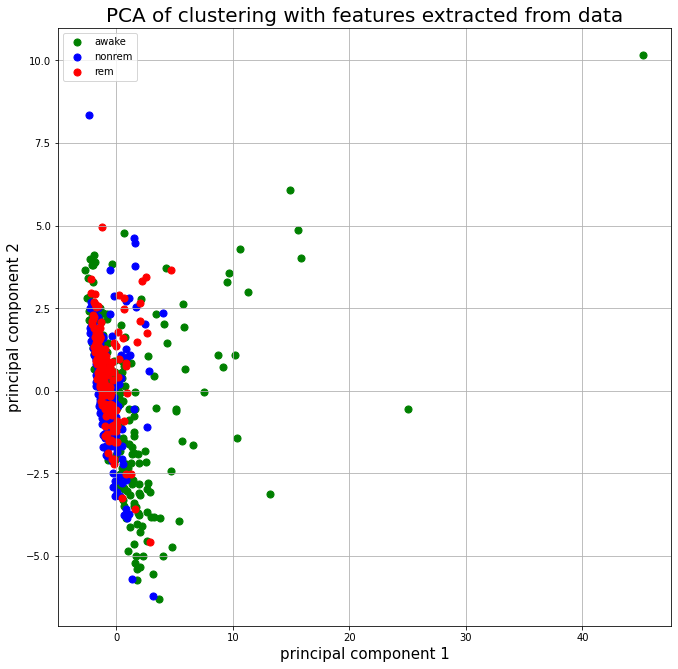

In [428]:

x=std_data_set.loc[:,features].values
pca = PCA(n_components=2)
pca=pca.fit_transform(x)
pca_df=pd.DataFrame(data=pca, columns=["principal component 1","principal component 2"])

plotPCA(pca_df,std_data_set["labels"],"features extracted from data")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


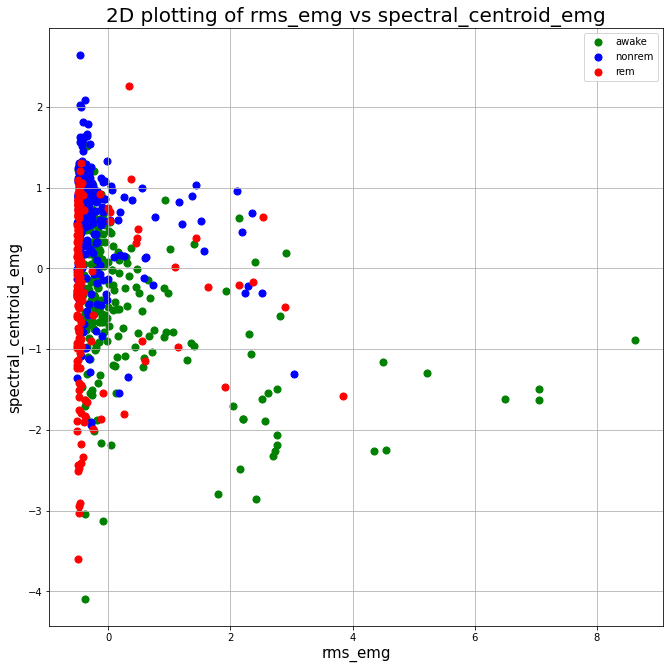

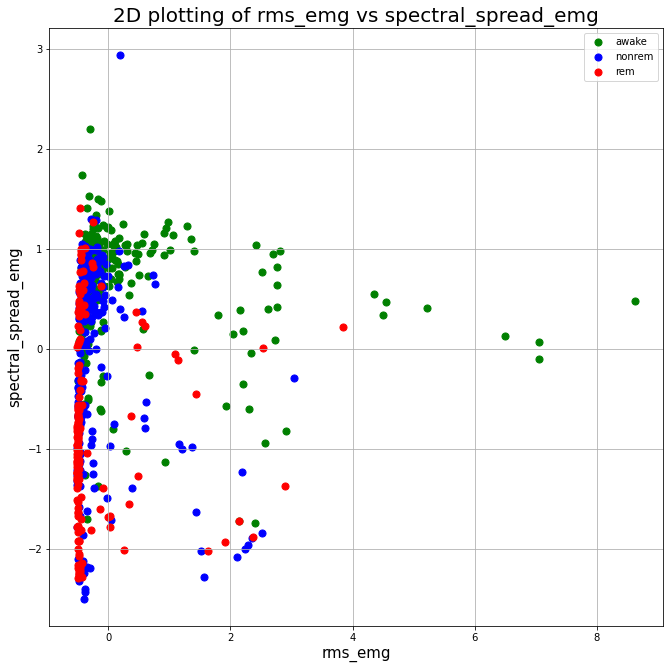

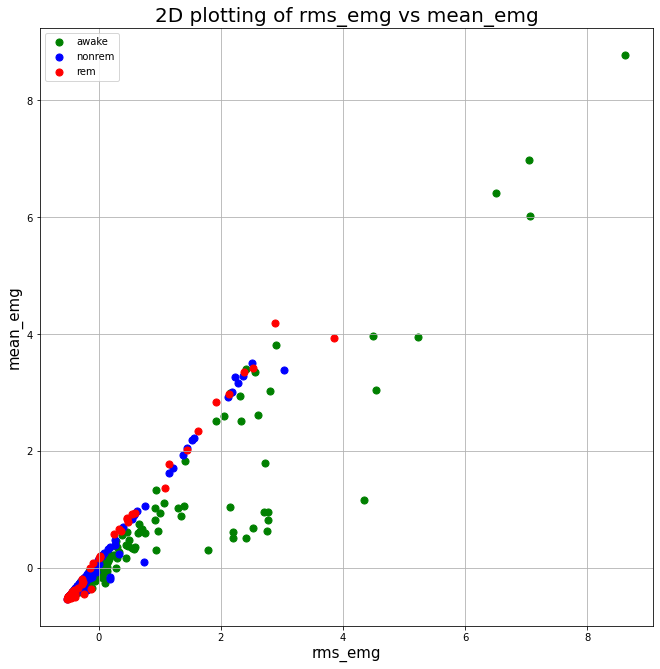

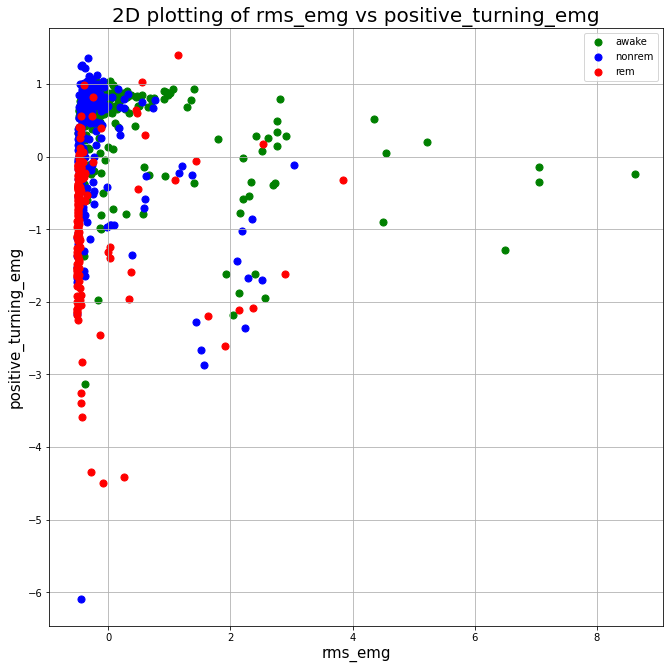

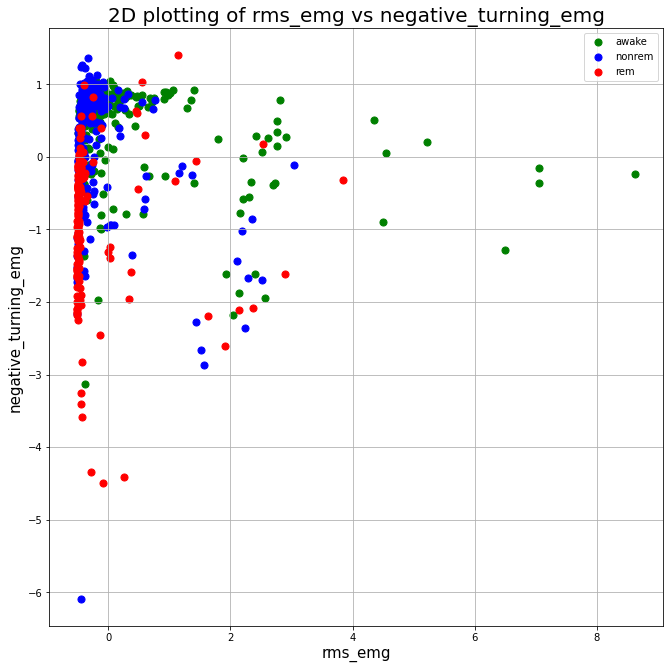

...

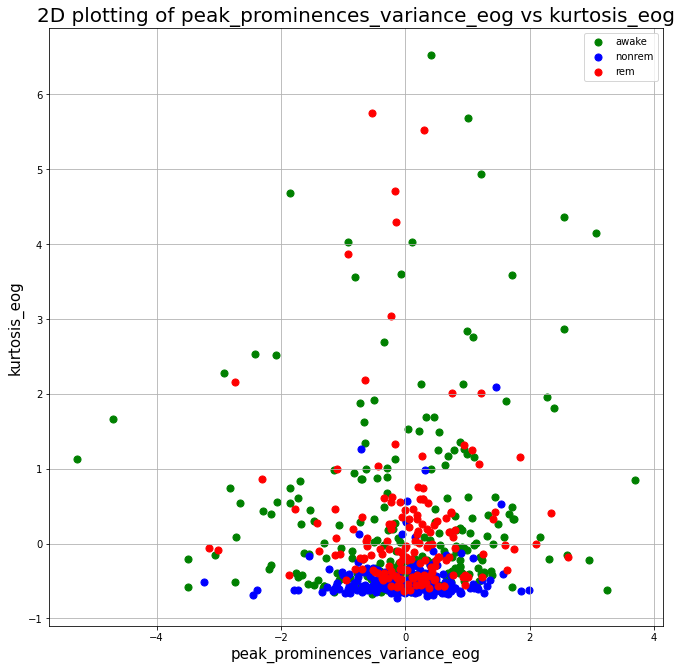

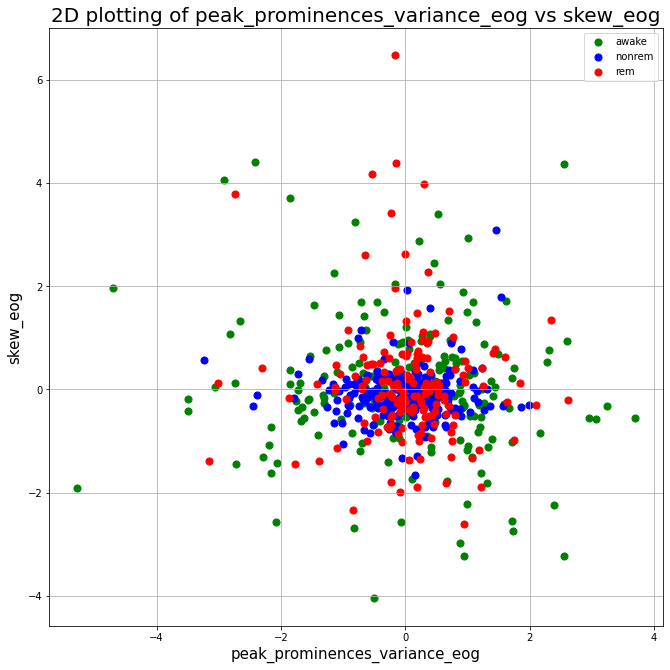

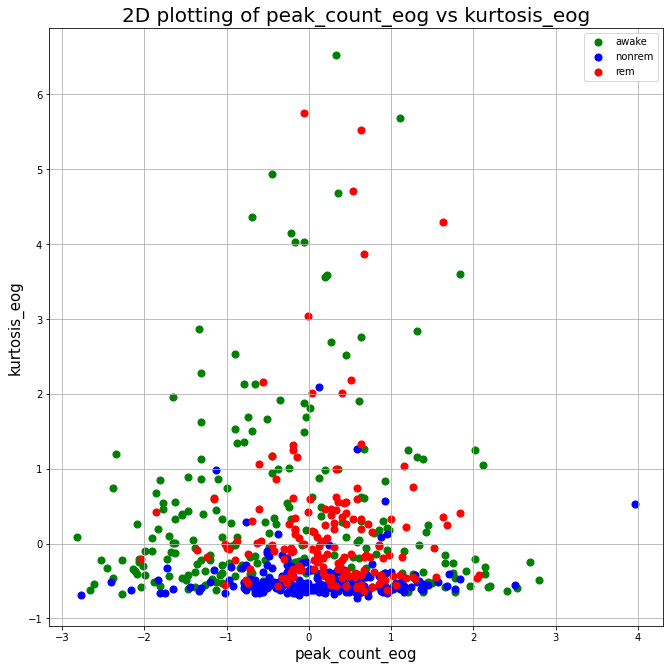

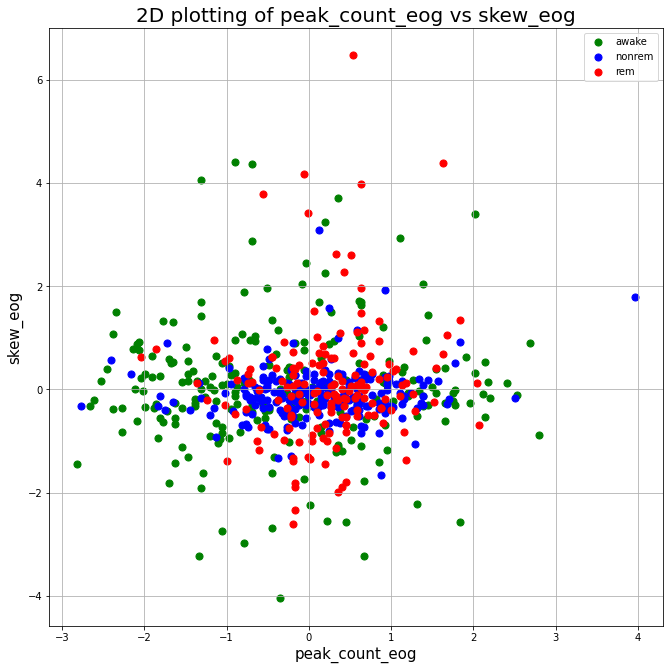

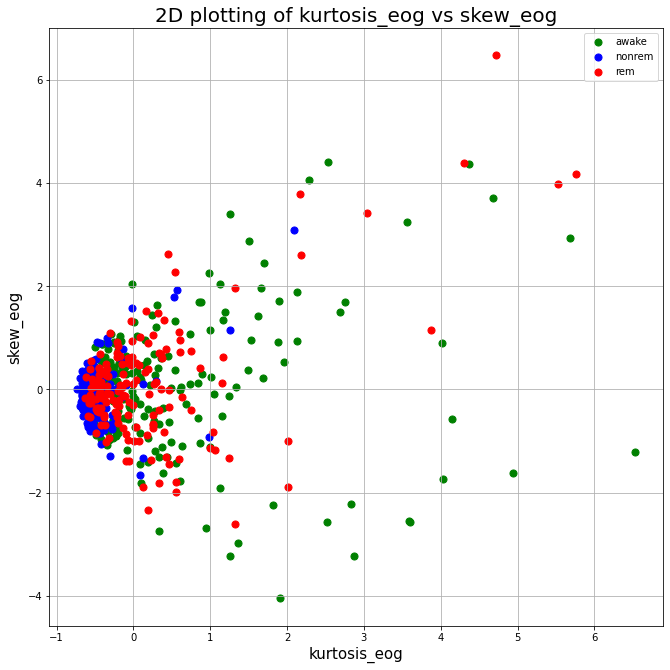

In [429]:
def plot2Dmapping(columnx,columny,labels,message,xlim=(0,0),ylim=(0,0),figsize=(11,11)):
    types=getTypes(labels)
    colors=["green","blue","red"]
    x=[]
    y=[]
    for typ in types:
        x_type=[]
        y_type=[]
        for i in range( len(labels)):
            if(labels[i]==typ):
                x_type.append(columnx[i])
                y_type.append(columny[i])
        x.append(x_type)
        y.append(y_type)
    fig = plt.figure(figsize = figsize)
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel(message[0], fontsize = 15)
    ax.set_ylabel(message[1], fontsize = 15)
    if(xlim != (0,0)):
      plt.xlim(xlim[0],xlim[1])
      plt.ylim(ylim[0],ylim[1])
    ax.set_title('2D plotting of '+message[0]+" vs "+message[1], fontsize = 20)
    number_of_colors = len(types)

    #colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    #         for i in range(number_of_colors)]
    #print(len(colors))
    #print(len(types))
    for i, color in zip(range(len(types)),colors):  
        ax.scatter(x[i], y[i], c = color, s = 50)
    ax.legend(types)
    ax.grid()

for i in range(len(features_emg)):
  for j in range(i+1,len(features_emg)):
    plot2Dmapping(std_data_set[features_emg[i]],std_data_set[features_emg[j]],std_data_set["labels"],[features_emg[i],features_emg[j]])
for i in range(len(features_eog)):
  for j in range(i+1,len(features_eog)):
    plot2Dmapping(std_data_set[features_eog[i]],std_data_set[features_eog[j]],std_data_set["labels"],[features_eog[i],features_eog[j]])


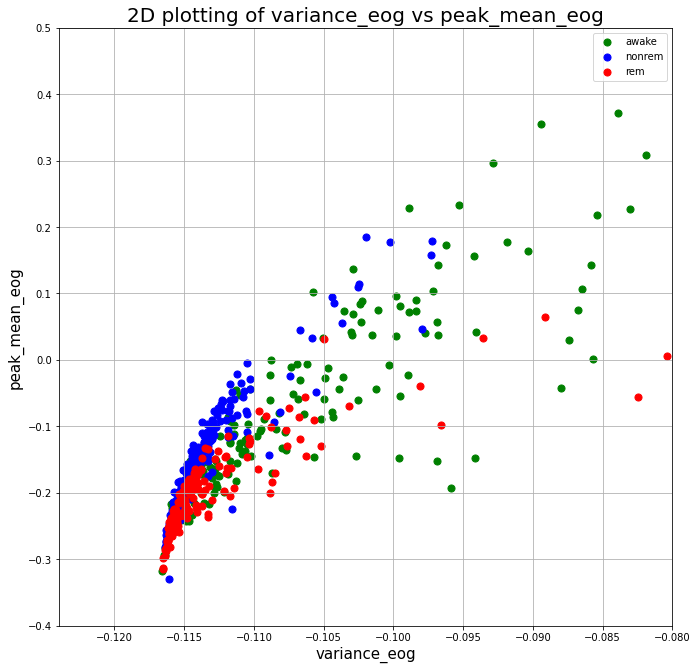

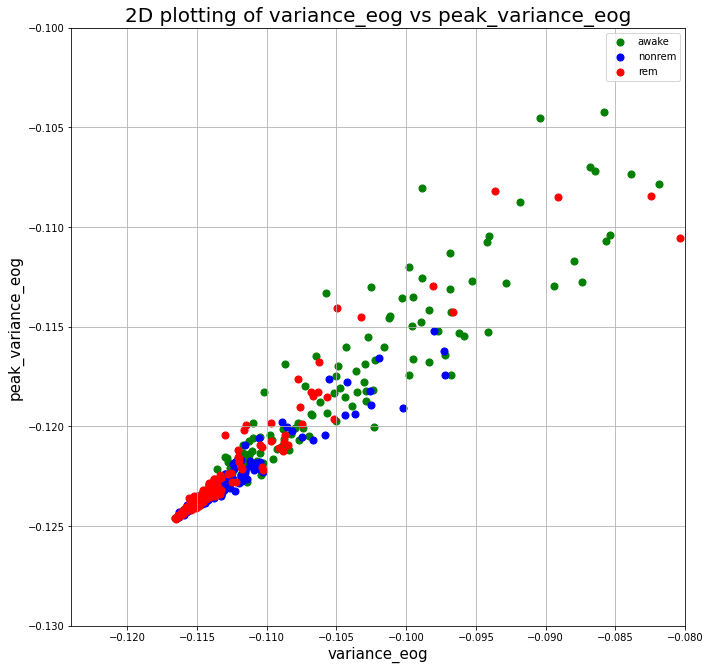

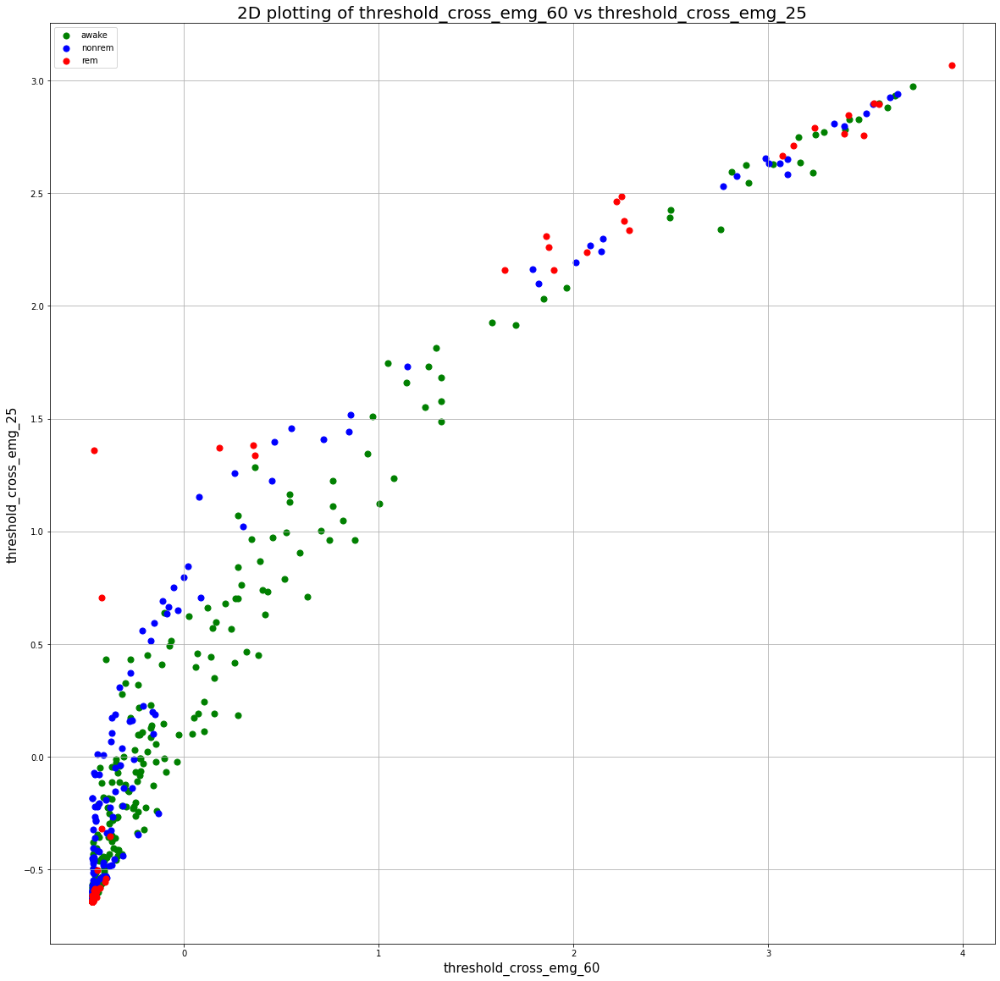

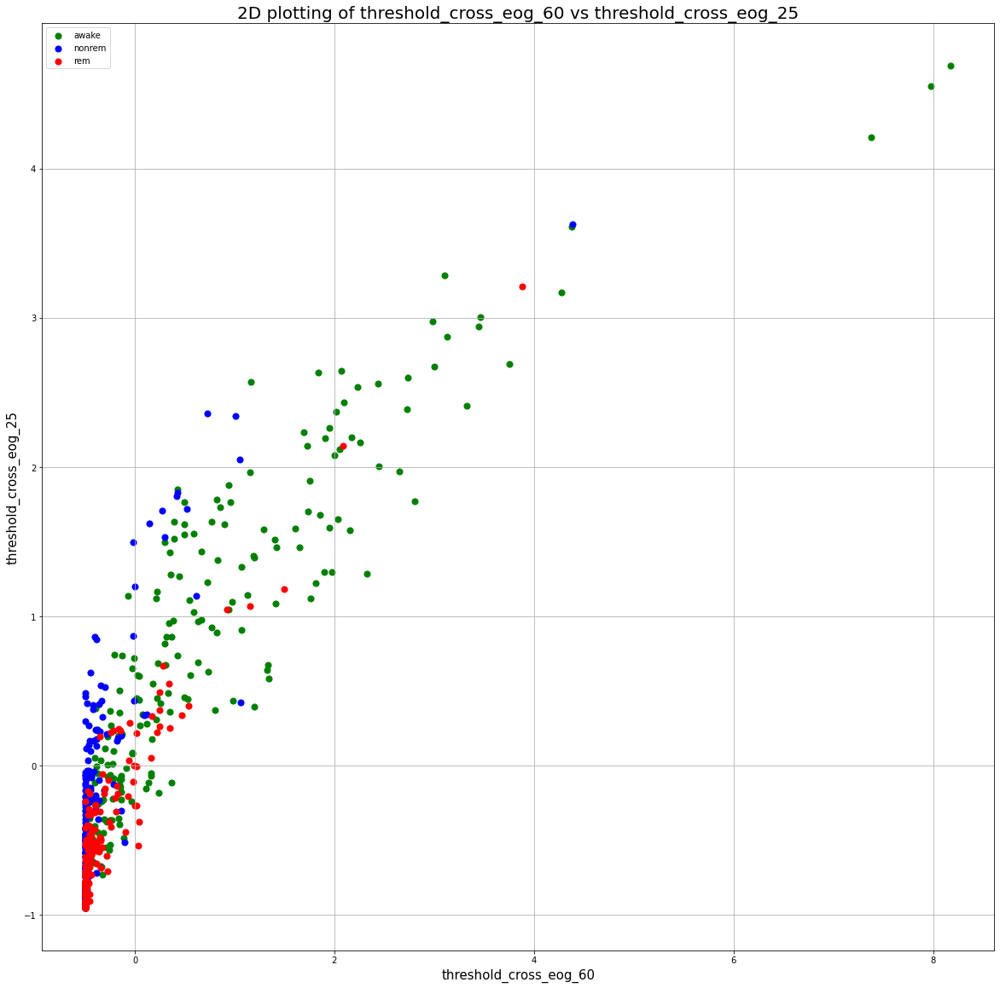

In [430]:

plot2Dmapping(std_data_set["variance_eog"],std_data_set["peak_mean_eog"],std_data_set["labels"],["variance_eog","peak_mean_eog"],xlim=(-0.124,-0.08),ylim=(-0.4,0.5))
plot2Dmapping(std_data_set["variance_eog"],std_data_set["peak_variance_eog"],std_data_set["labels"],["variance_eog","peak_variance_eog"],xlim=(-0.124,-0.08),ylim=(-0.13,-0.1))
plot2Dmapping(std_data_set["threshold_cross_emg_60"],std_data_set["threshold_cross_emg_25"],std_data_set["labels"],["threshold_cross_emg_60","threshold_cross_emg_25"],figsize=(20,20))
plot2Dmapping(std_data_set["threshold_cross_eog_60"],std_data_set["threshold_cross_eog_25"],std_data_set["labels"],["threshold_cross_eog_60","threshold_cross_eog_25"],figsize=(20,20))

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


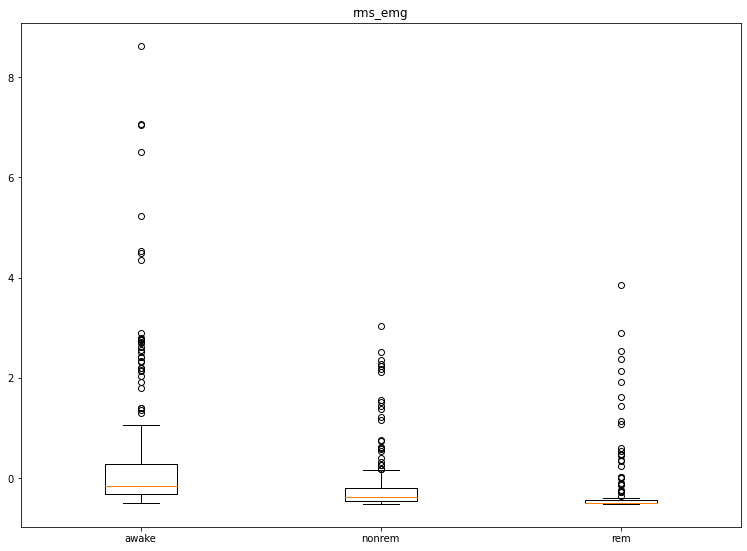

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


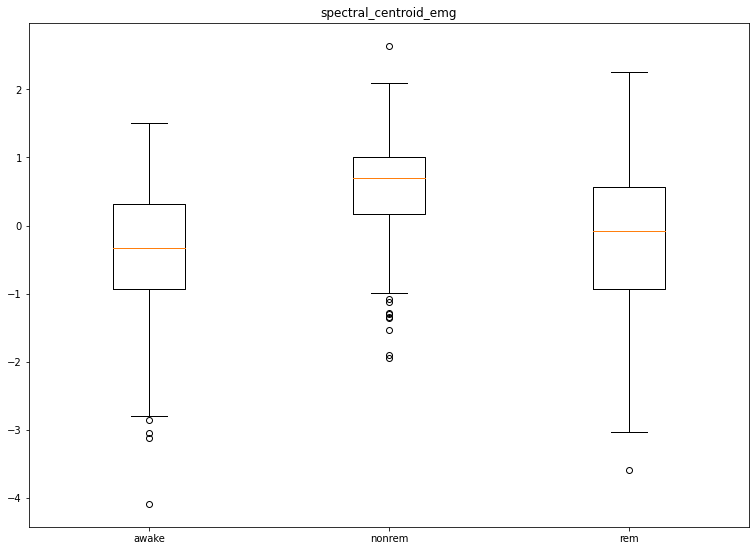

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


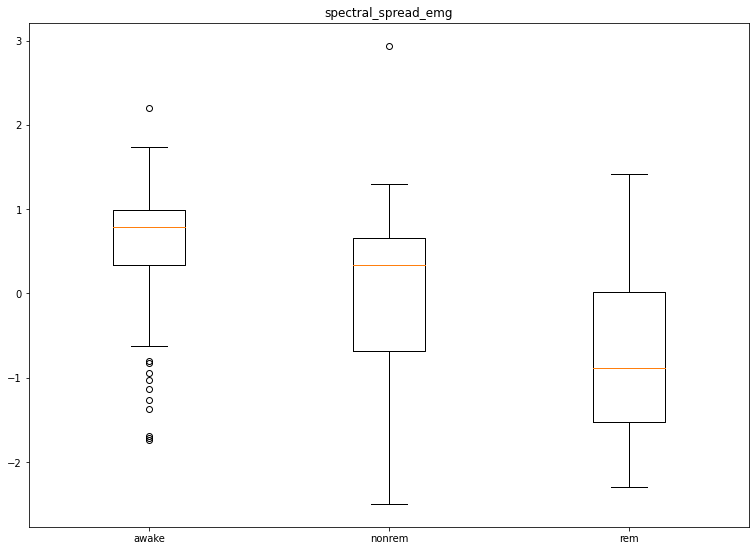

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


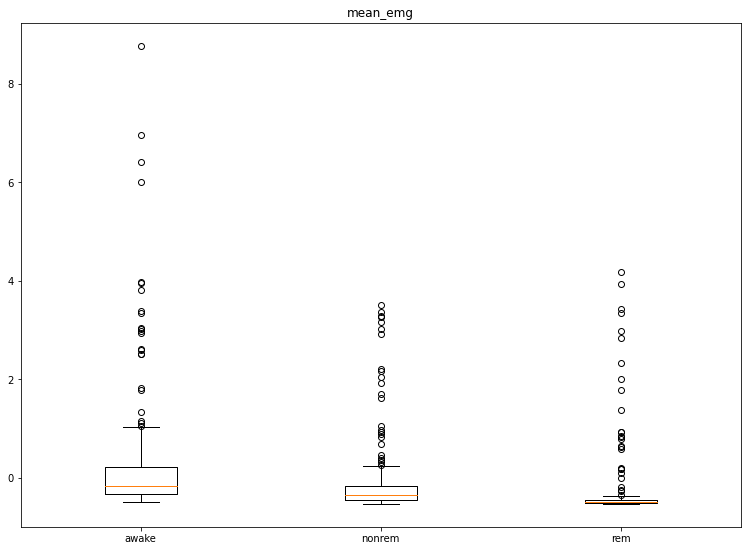

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


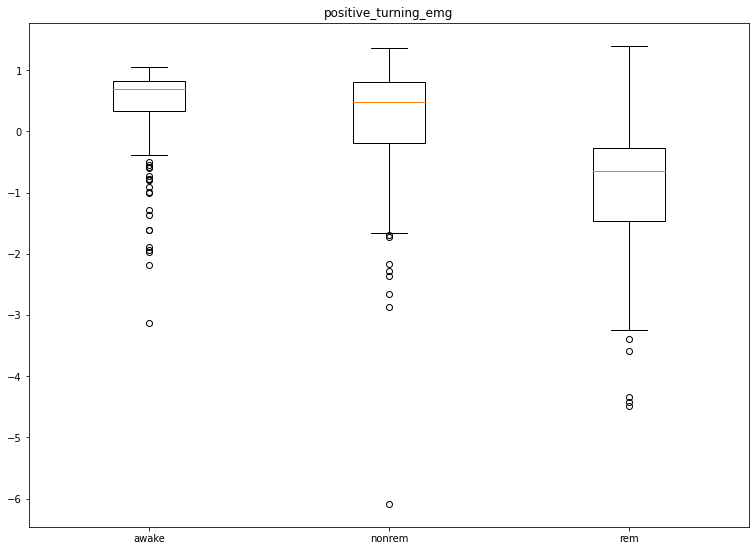

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


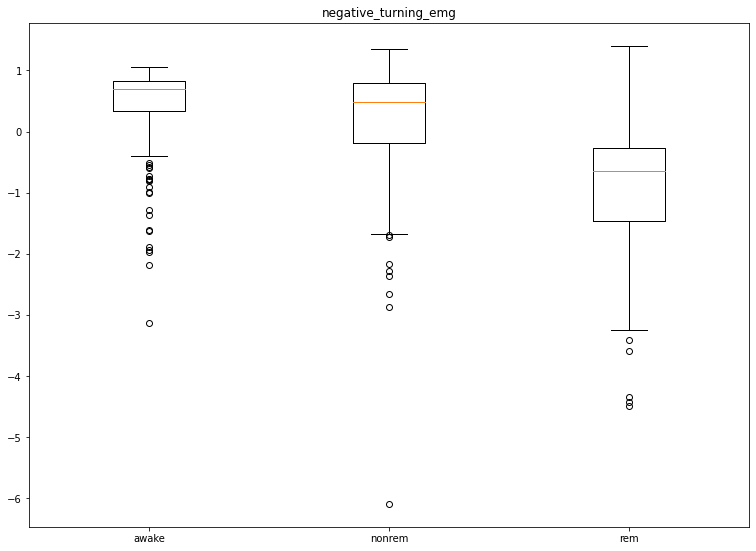

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


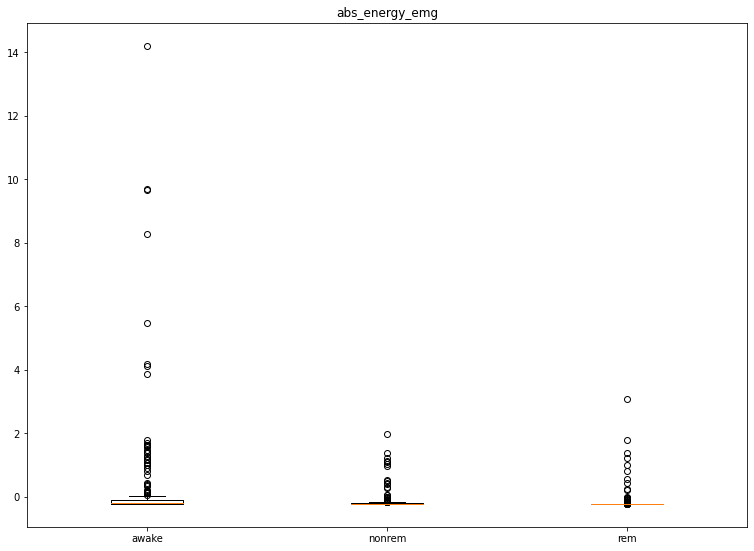

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


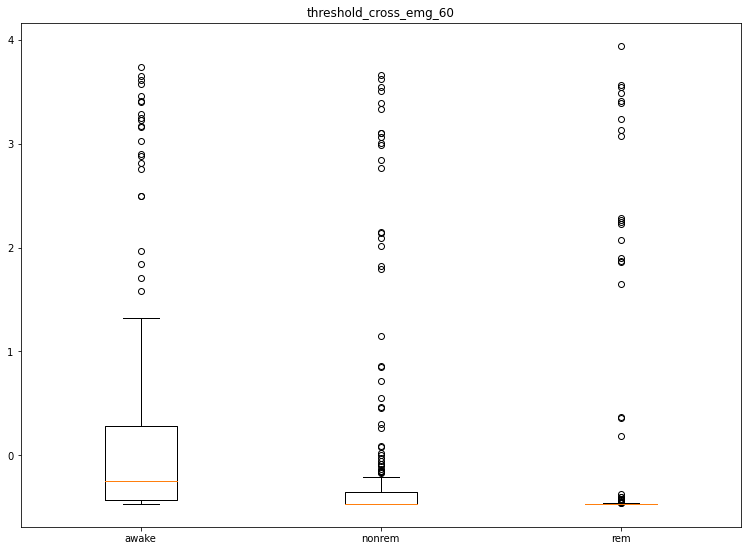

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


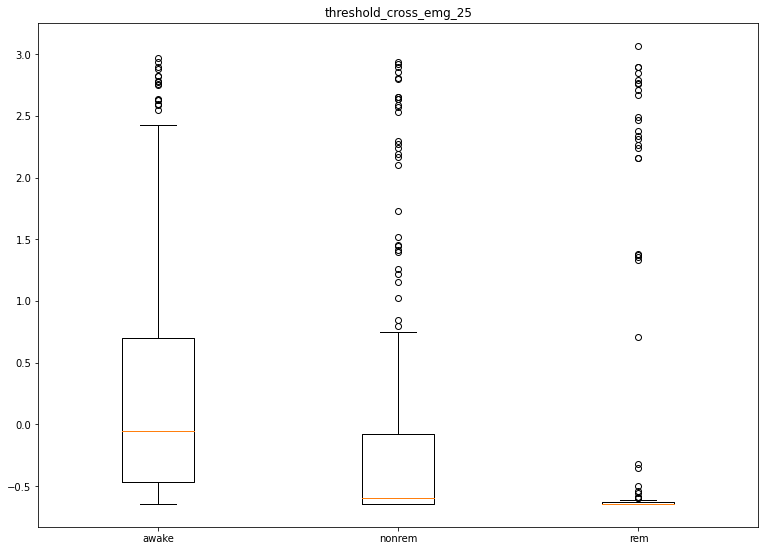

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


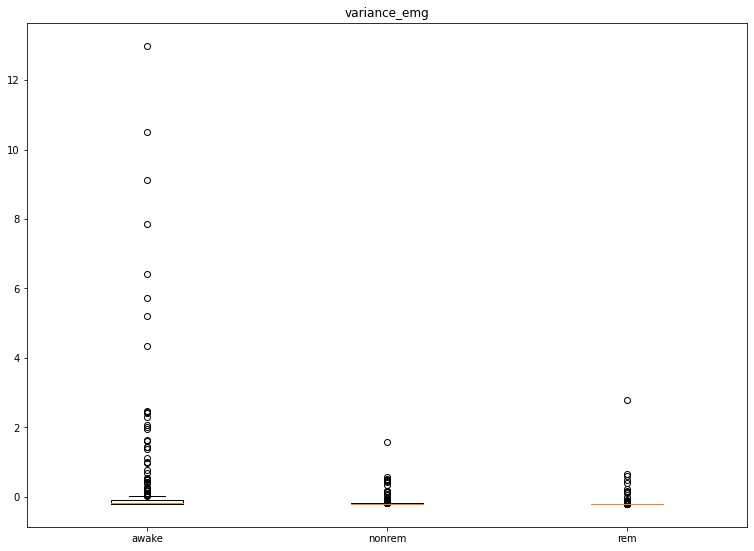

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


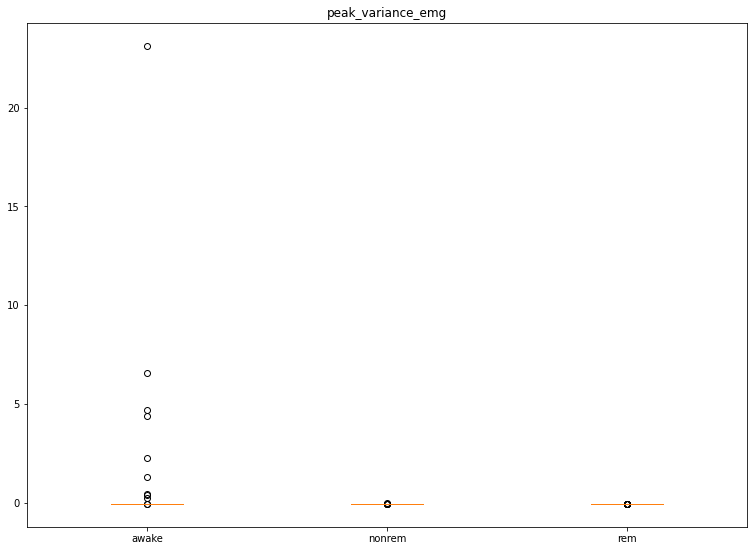

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


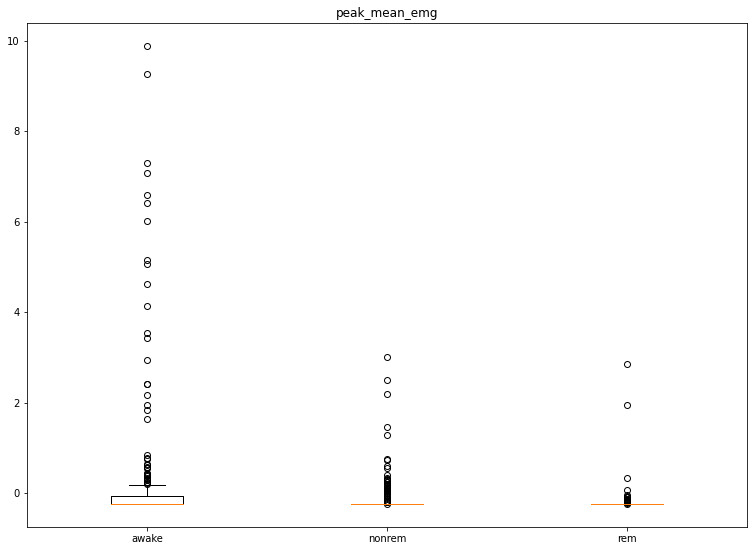

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


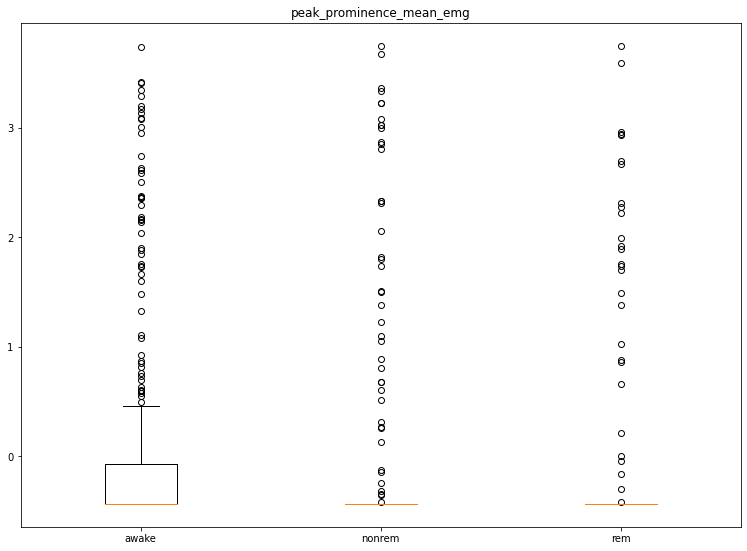

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


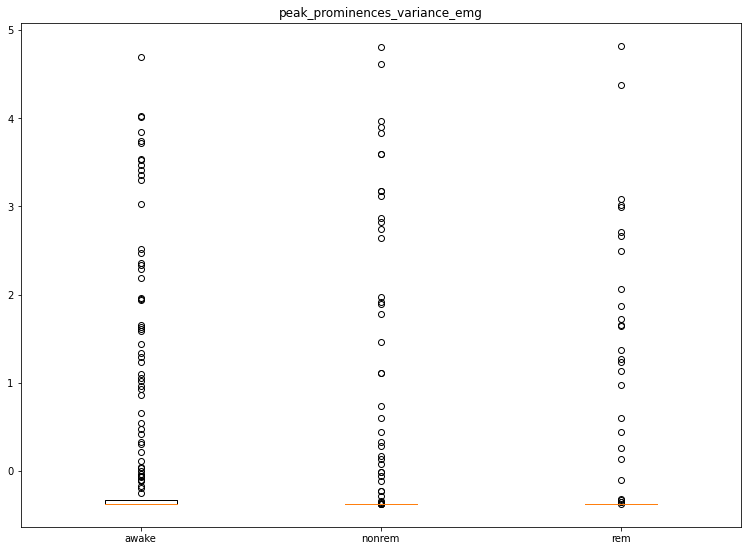

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


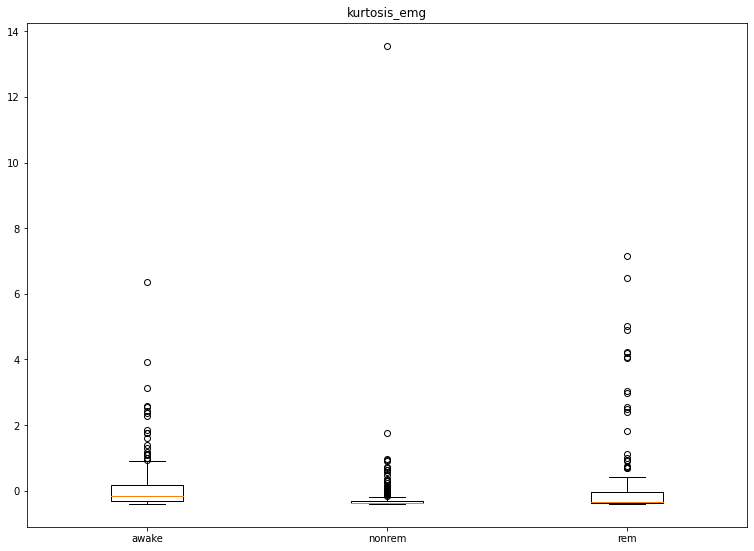

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


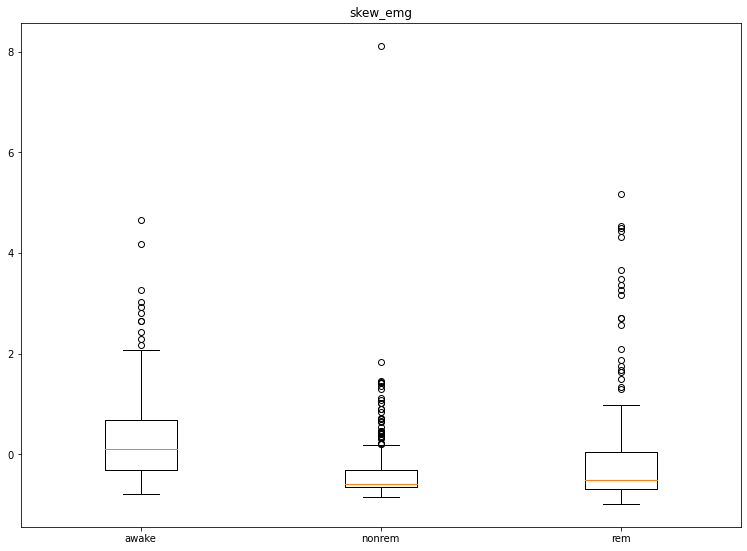

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


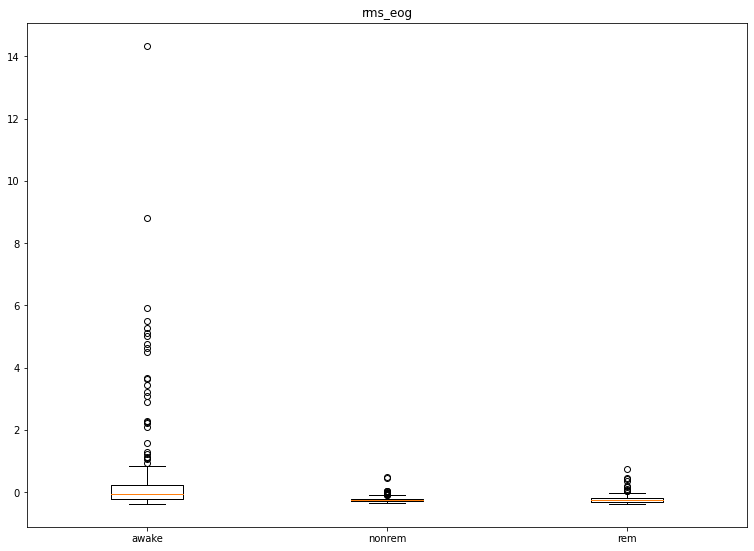

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


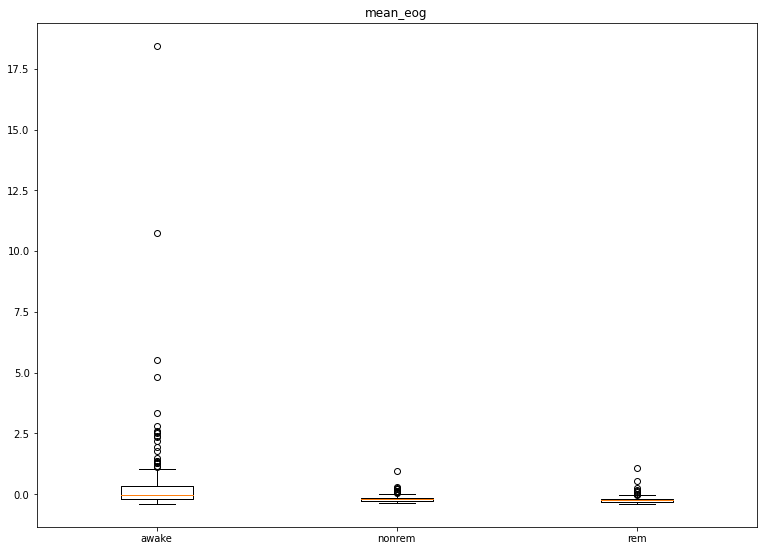

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


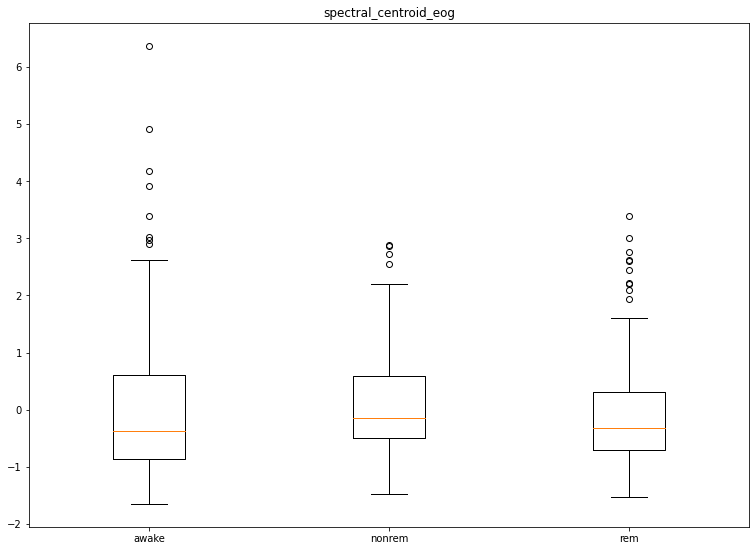

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


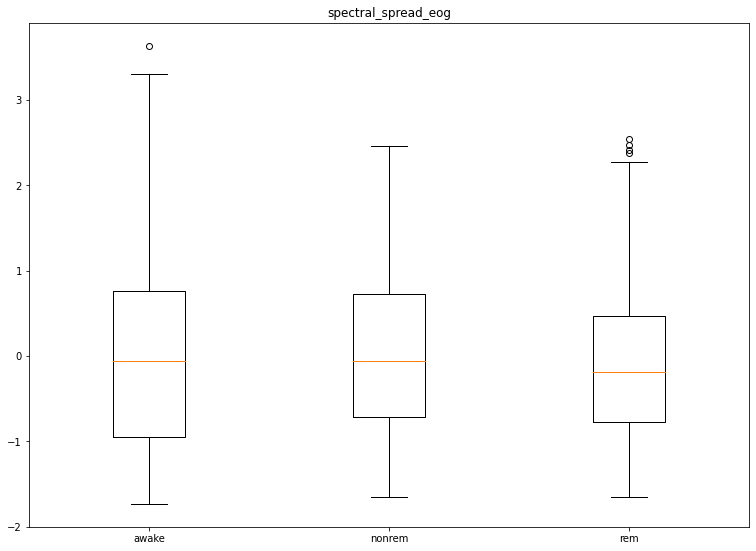

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


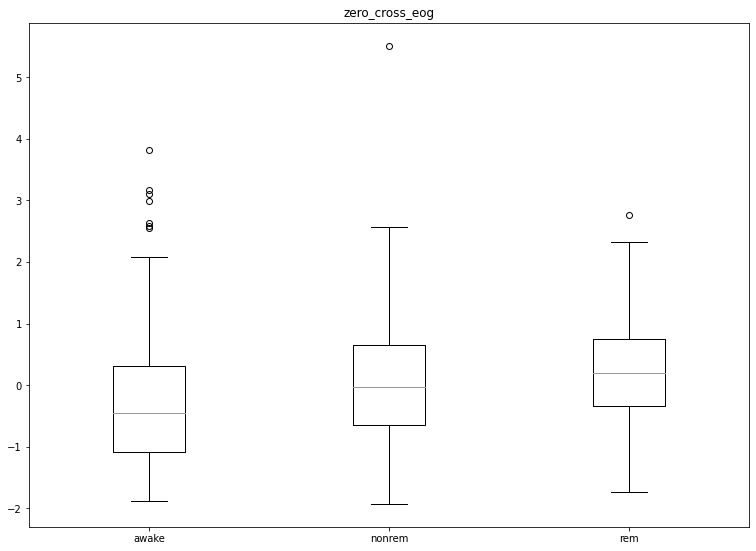

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


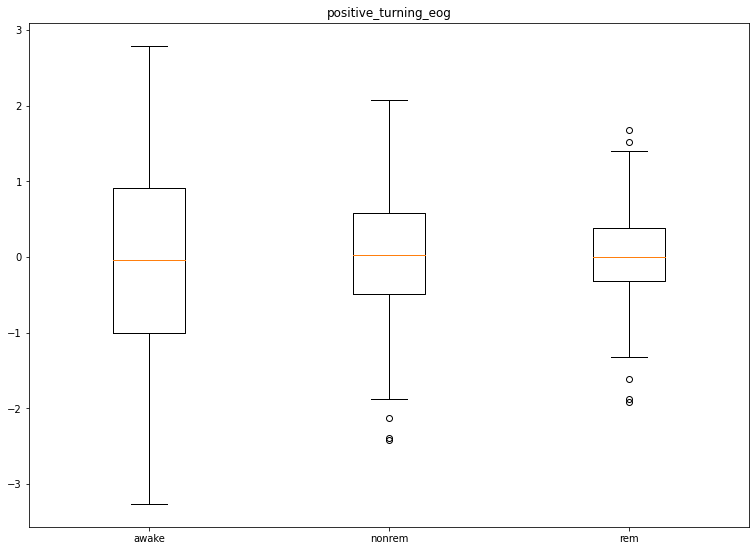

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


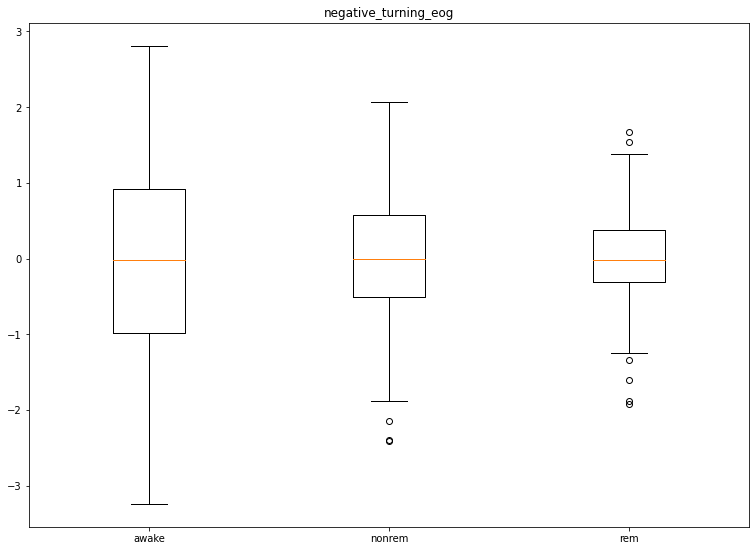

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


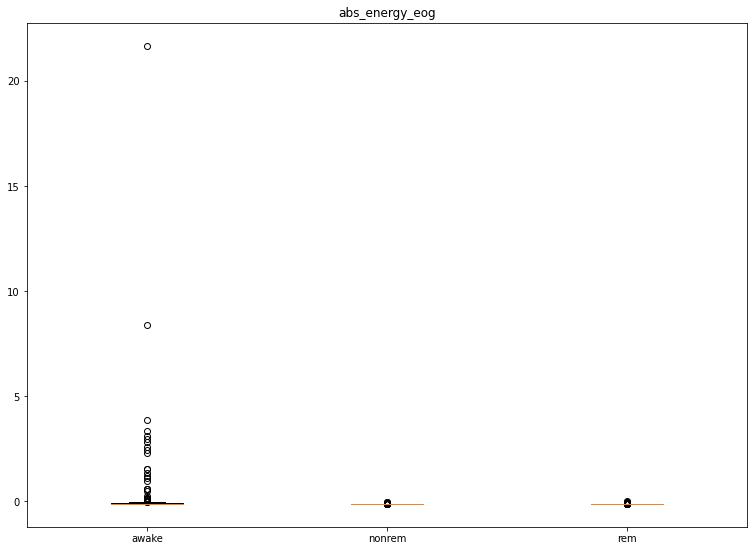

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


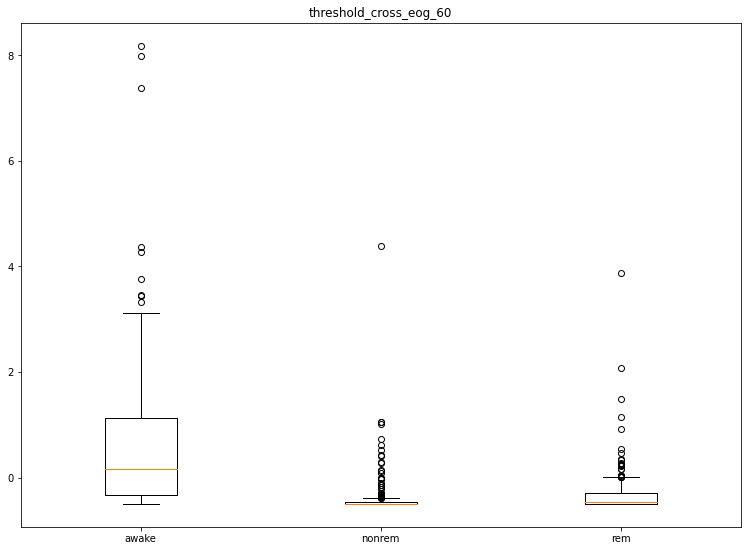

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


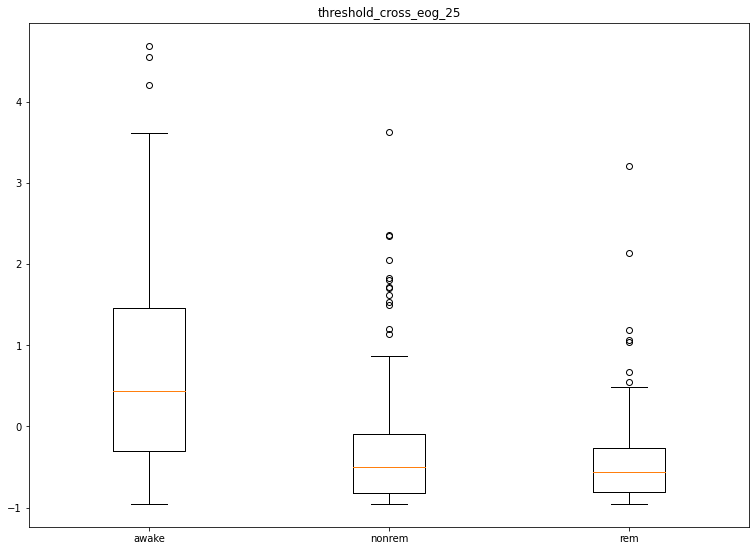

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


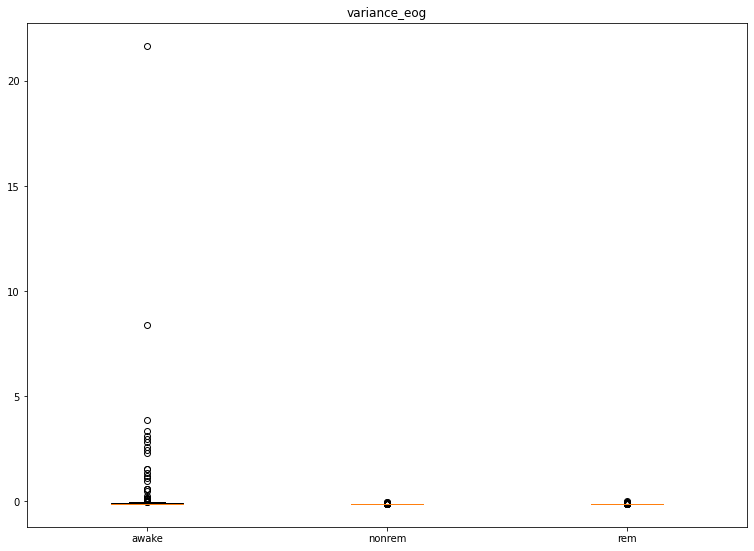

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


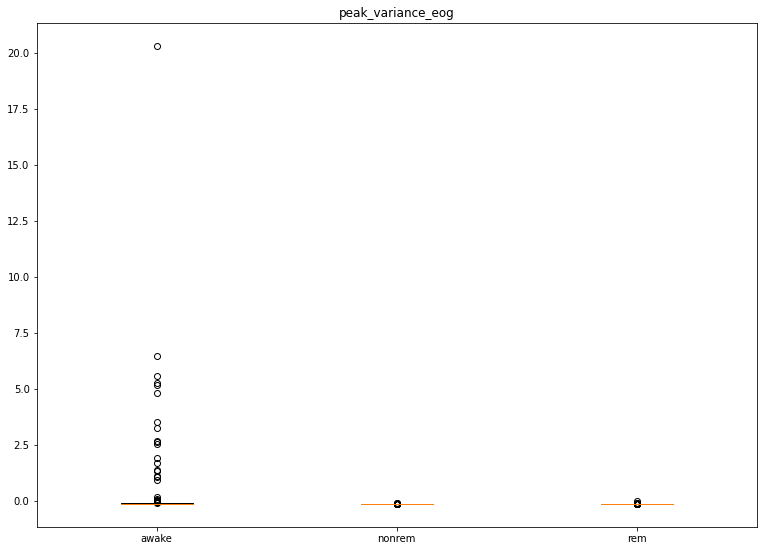

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


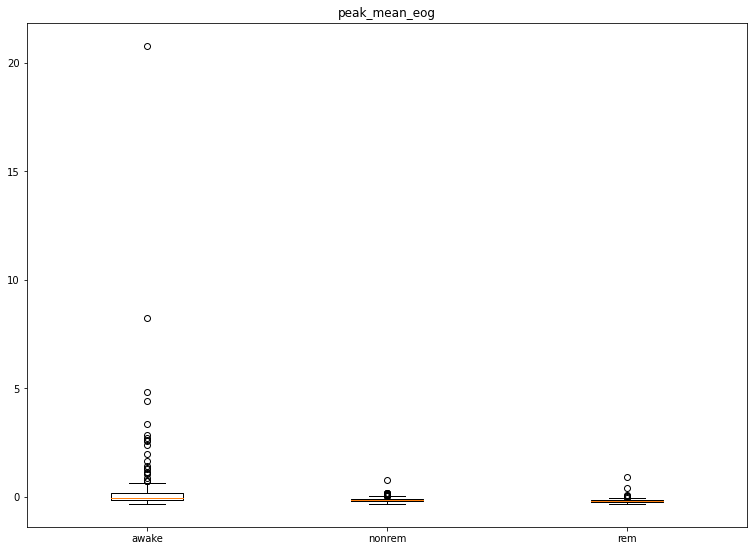

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


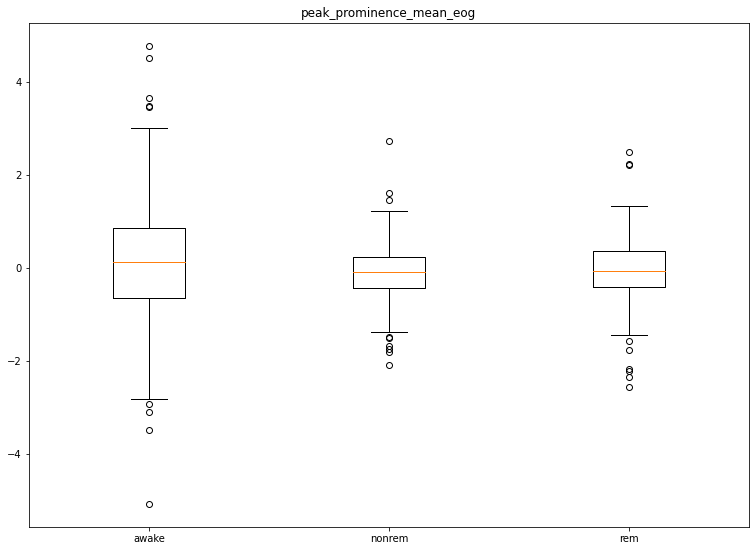

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


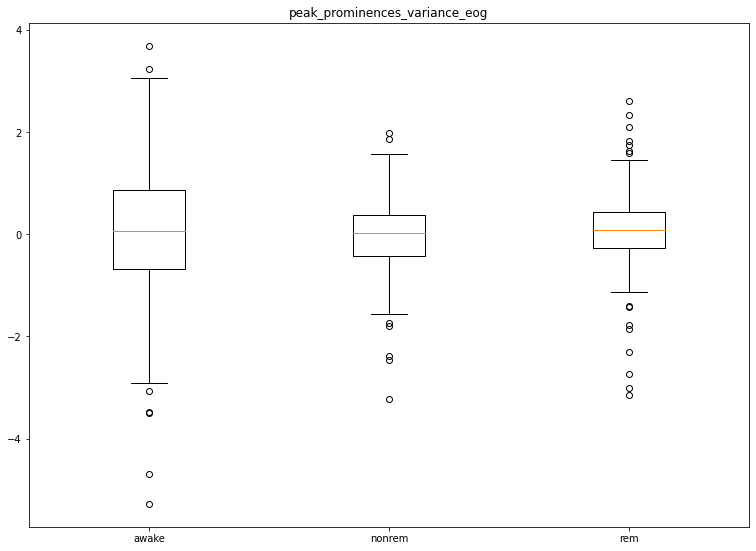

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


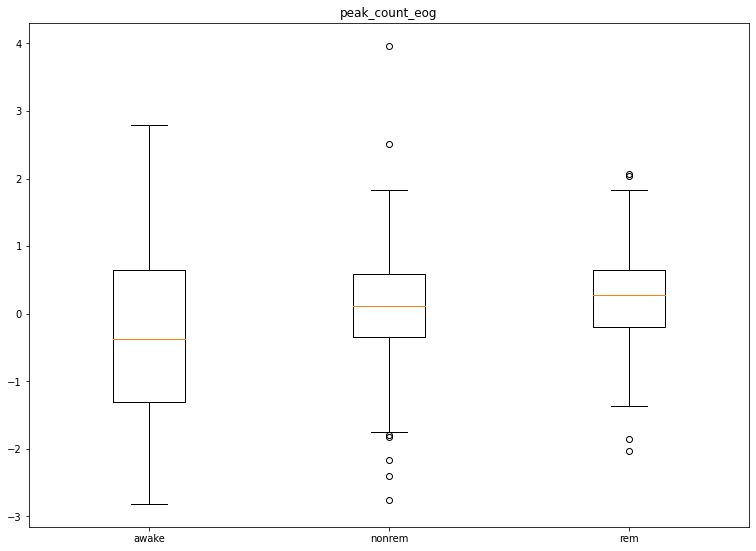

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


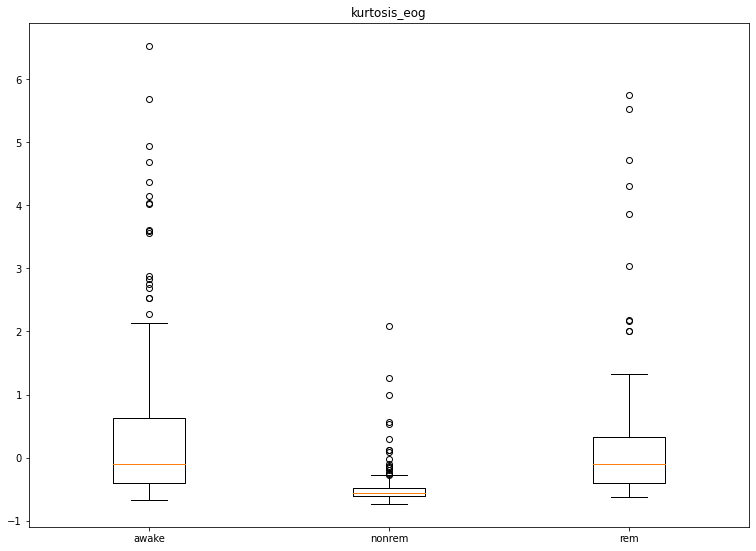

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


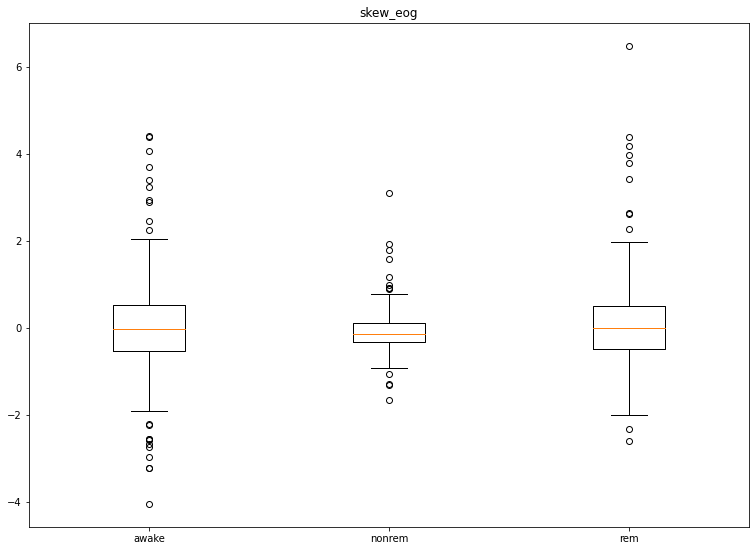

In [431]:
from numpy.core.numeric import NaN
def boxplot(dataframe,feature,ylim=(0,0)):
  labels=dataframe["labels"]
  types=getTypes(labels)
  x=[]
  for typ in types:
      x_type=[]
      for i in range(len(labels)):
        if(labels[i]==typ):
              x_type.append(dataframe[feature][i])
      x.append(x_type)
  fig = plt.figure(figsize =(10, 7))

  # Creating axes instance
  ax = fig.add_axes([0, 0, 1, 1])
  ax.set_title(feature)
  # Creating plot
  bp = ax.boxplot(x)
  ax.set_xticklabels(types)
  if ylim != (0,0) : plt.ylim(ylim[0],ylim[1])
  # show plot
  plt.show()
for feature in features:
  boxplot(std_data_set,feature)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


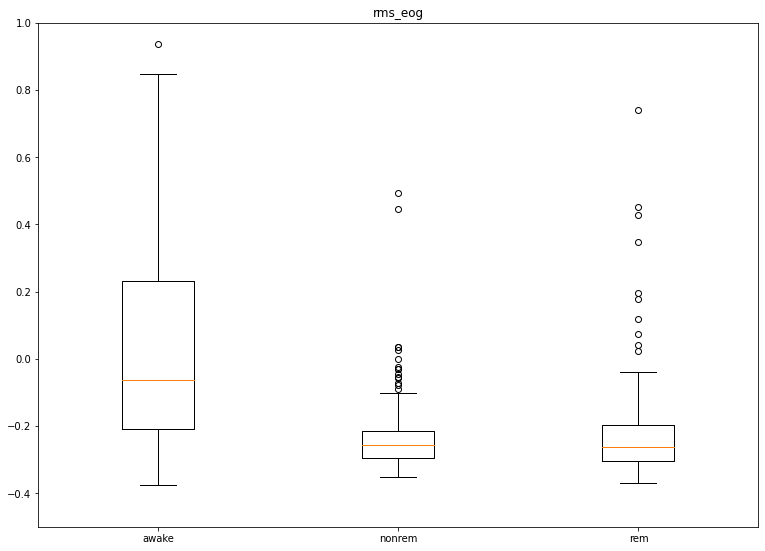

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


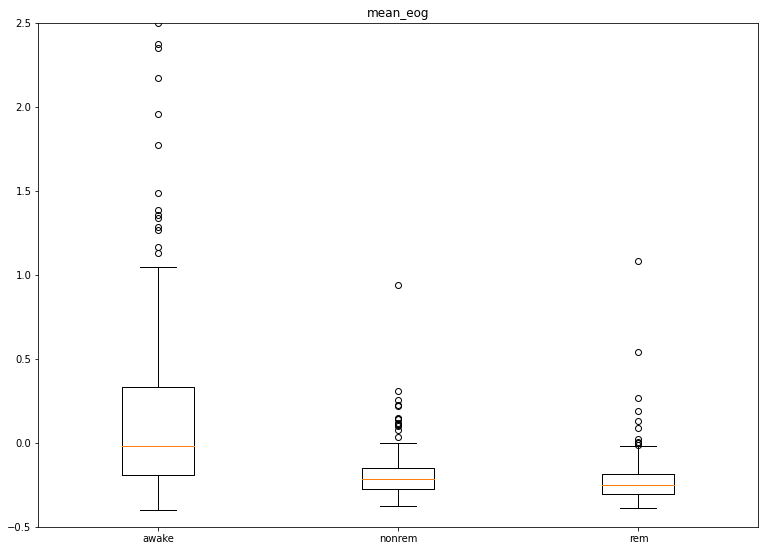

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


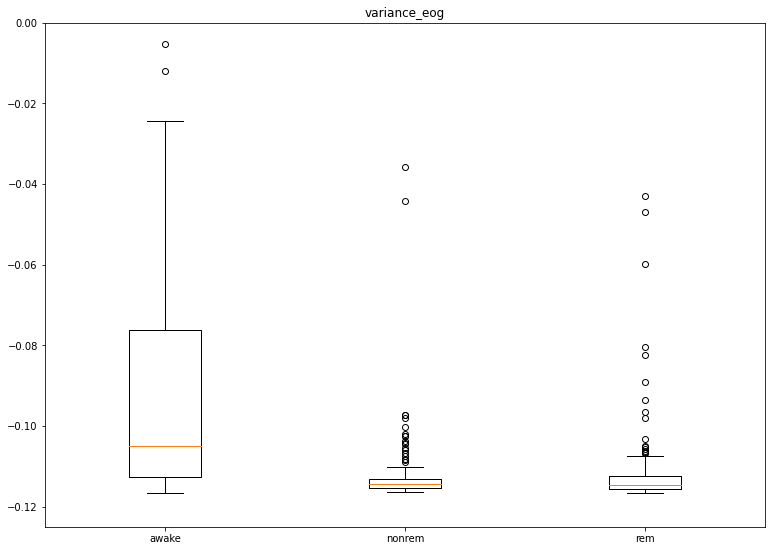

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


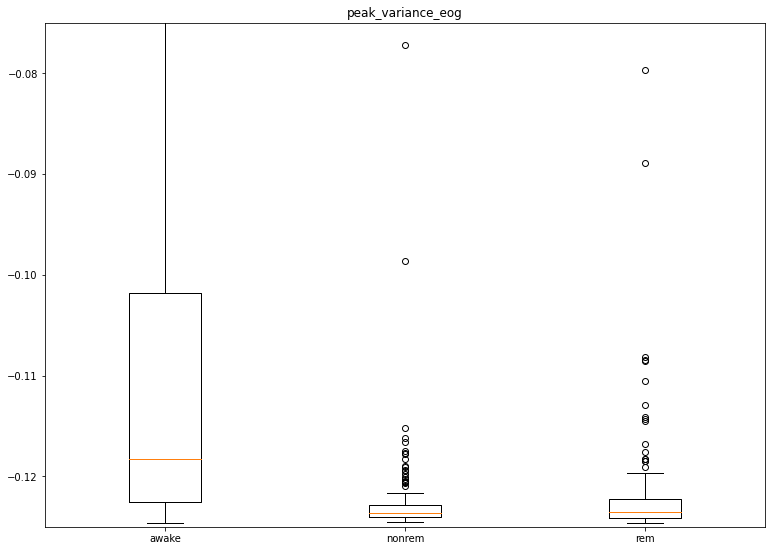

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


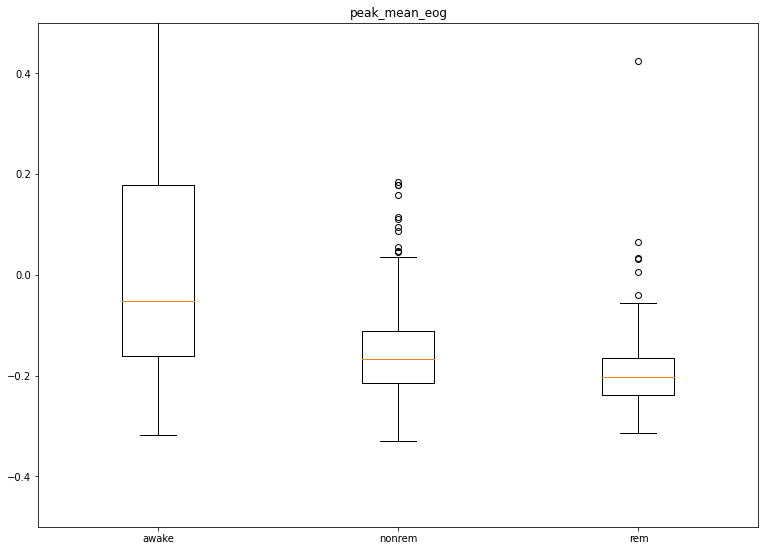

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


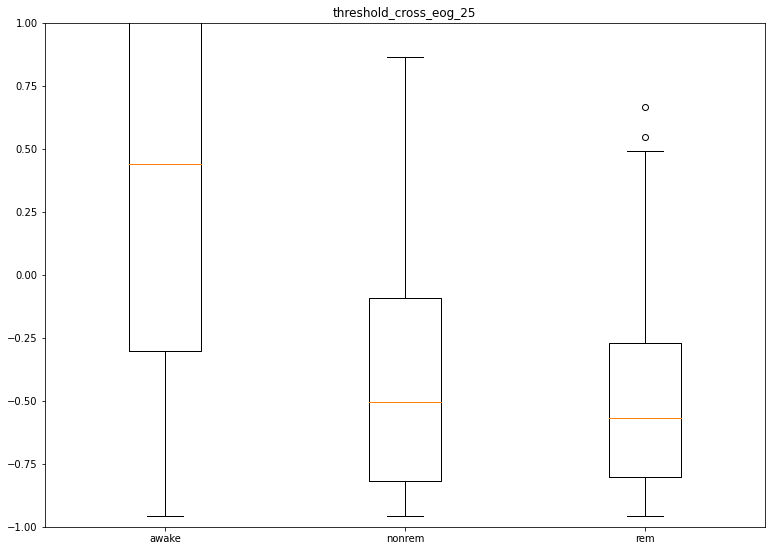

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


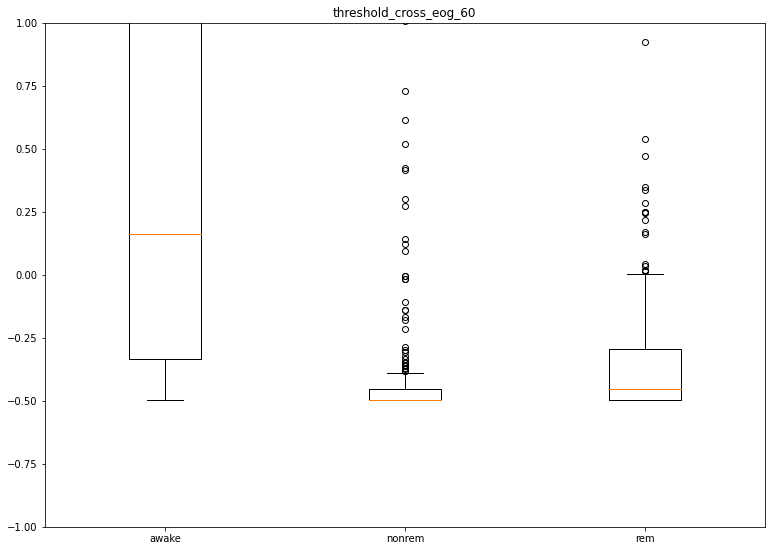

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


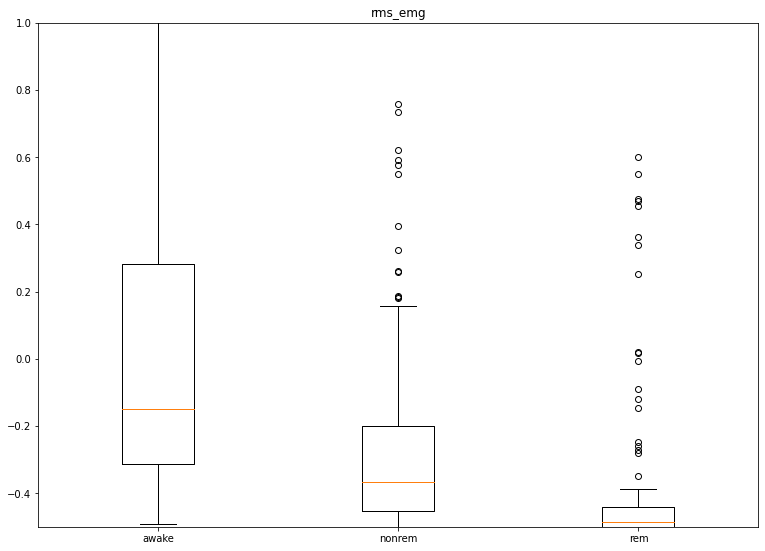

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


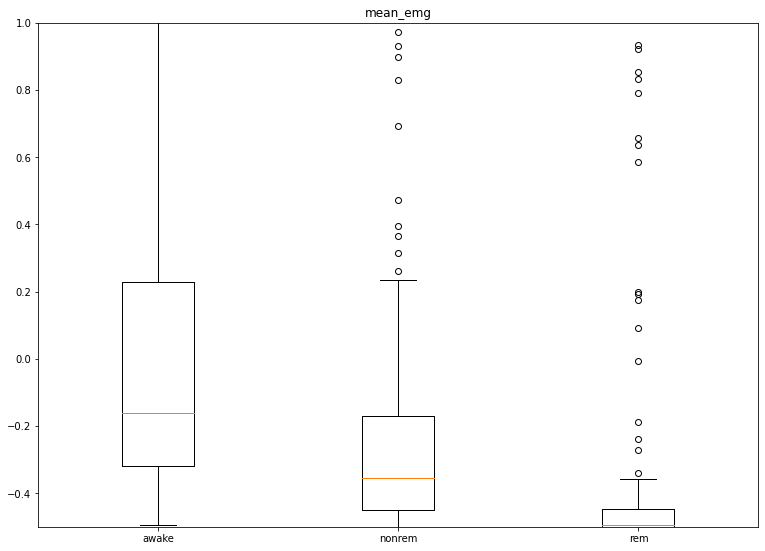

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


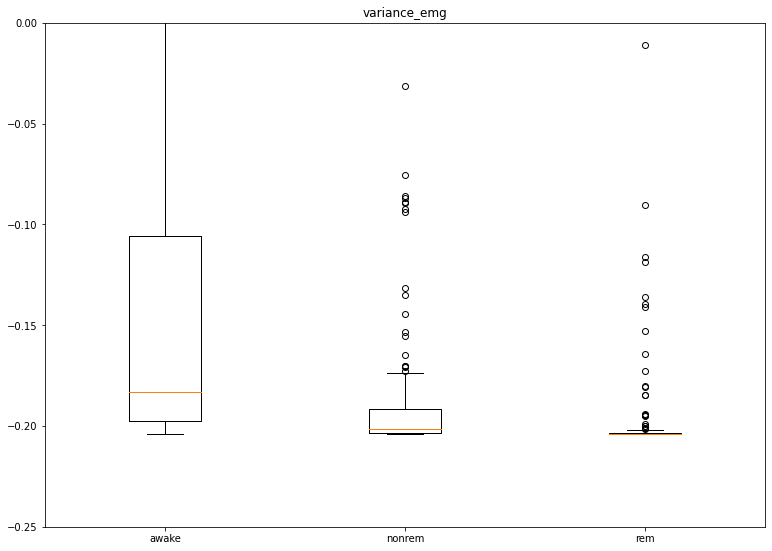

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


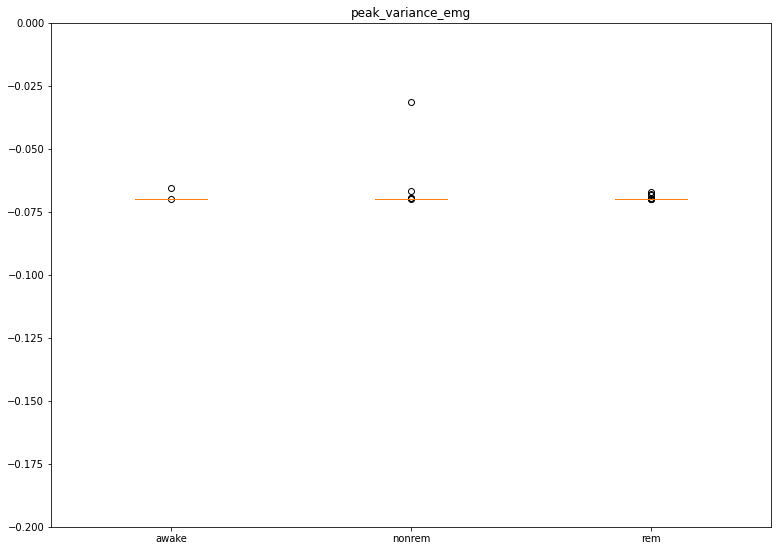

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


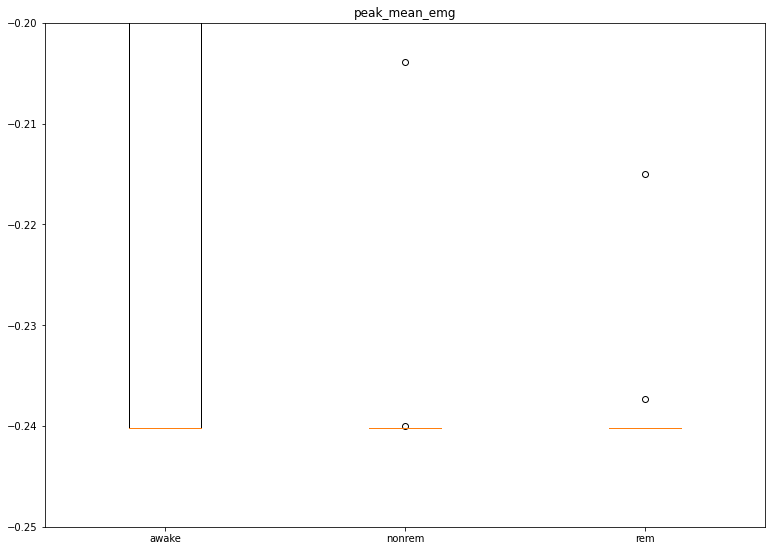

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


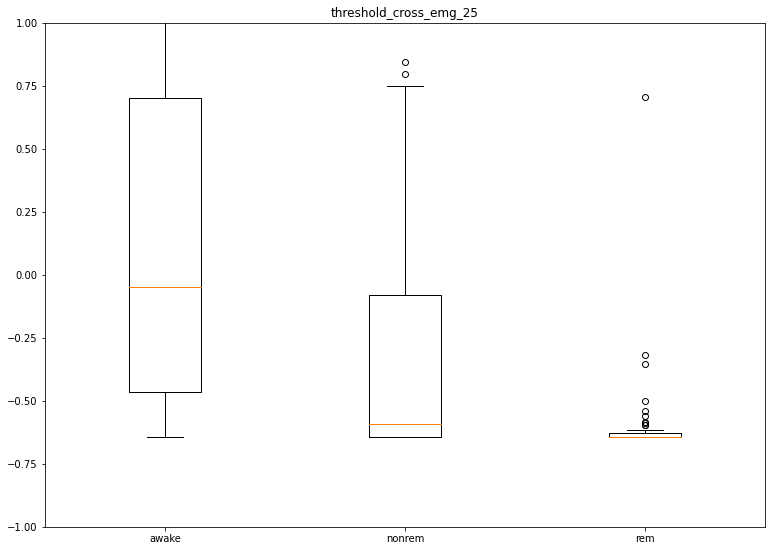

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


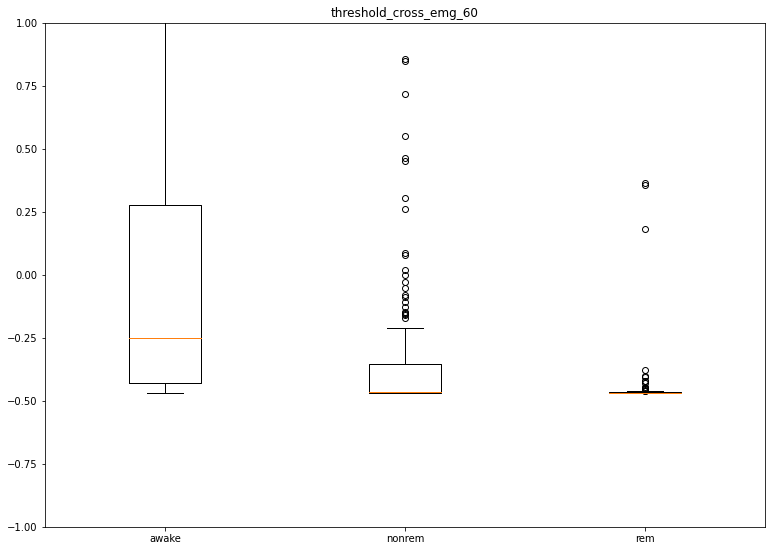

In [451]:


boxplot(std_data_set,"rms_eog",ylim=(-0.5,1.0))
boxplot(std_data_set,"mean_eog",ylim=(-0.5,2.5))
boxplot(std_data_set,"variance_eog",ylim=(-0.125,0.0))
boxplot(std_data_set,"peak_variance_eog",ylim=(-0.125,-0.075))
boxplot(std_data_set,"peak_mean_eog",ylim=(-0.5,0.5))
boxplot(std_data_set,"threshold_cross_eog_25",ylim=(-1,1))
boxplot(std_data_set,"threshold_cross_eog_60",ylim=(-1,1))
boxplot(std_data_set,"rms_emg",ylim=(-0.5,1.0))
boxplot(std_data_set,"mean_emg",ylim=(-0.5,1.0))
boxplot(std_data_set,"variance_emg",ylim=(-0.25,0.0))
boxplot(std_data_set,"peak_variance_emg",ylim=(-0.2,0.0))
boxplot(std_data_set,"peak_mean_emg",ylim=(-0.25,-0.20))
boxplot(std_data_set,"threshold_cross_emg_25",ylim=(-1,1))
boxplot(std_data_set,"threshold_cross_emg_60",ylim=(-1,1))

#Comparison of training and test data
The comparison is done by comparing the feature distributins.

In [433]:
test_paths={"awake":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Test/awake","nonrem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Test/nonrem", "rem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Test/rem"}
test_data_set={"labels":[]}

for feature in features_emg:
  test_data_set[feature]=[]
for feature in features_eog:
  test_data_set[feature]=[]

for sleep_state in test_paths.keys():
  files = os.listdir(test_paths[sleep_state])
  for filename in files:
    if ".csv" in filename:
      signal_df=pd.read_csv(test_paths[sleep_state]+"/"+filename)
      real_features_eog = extract_features_eog(filter_eog_signal(signal_df["eog"][0:-1]))
      real_features_emg = extract_features_emg(filter_emg_signal(signal_df["emg"][0:-1]))
      test_data_set["labels"].append(sleep_state)
      for i in range(0,len(features_emg)):
        test_data_set[features_emg[i]].append(real_features_emg[i])
      for i in range(0,len(features_eog)):
        test_data_set[features_eog[i]].append(real_features_eog[i])


#standardization with z-score
test_data_set_df=pd.DataFrame(test_data_set)
test_std_data_set=test_data_set_df.copy()
standardize(test_std_data_set,features,dataset_means_and_std)


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


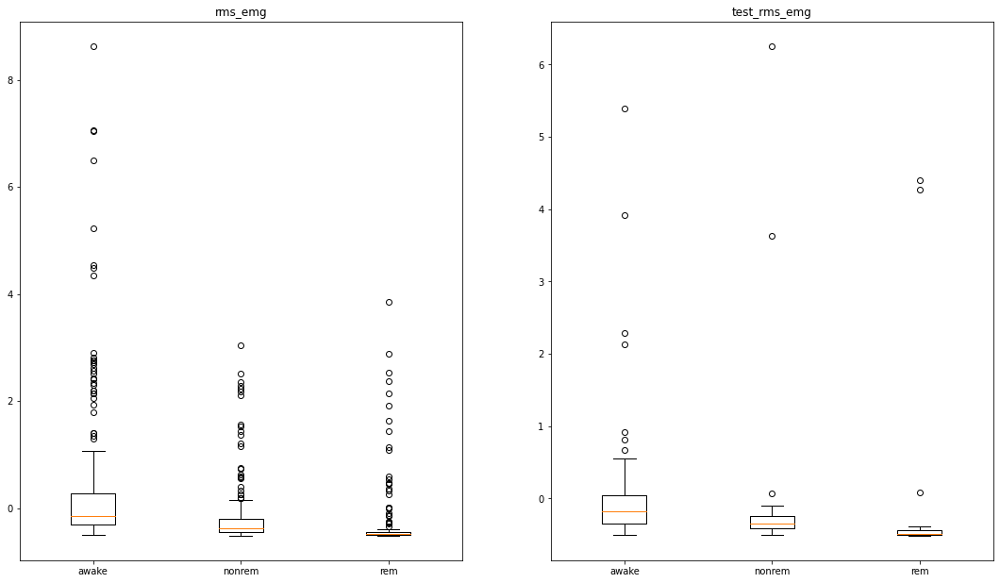

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


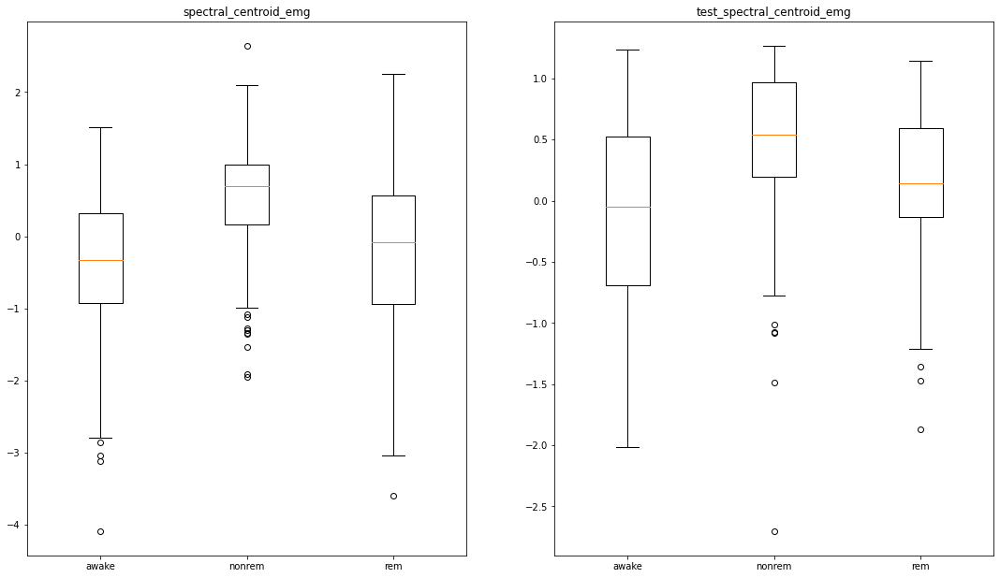

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


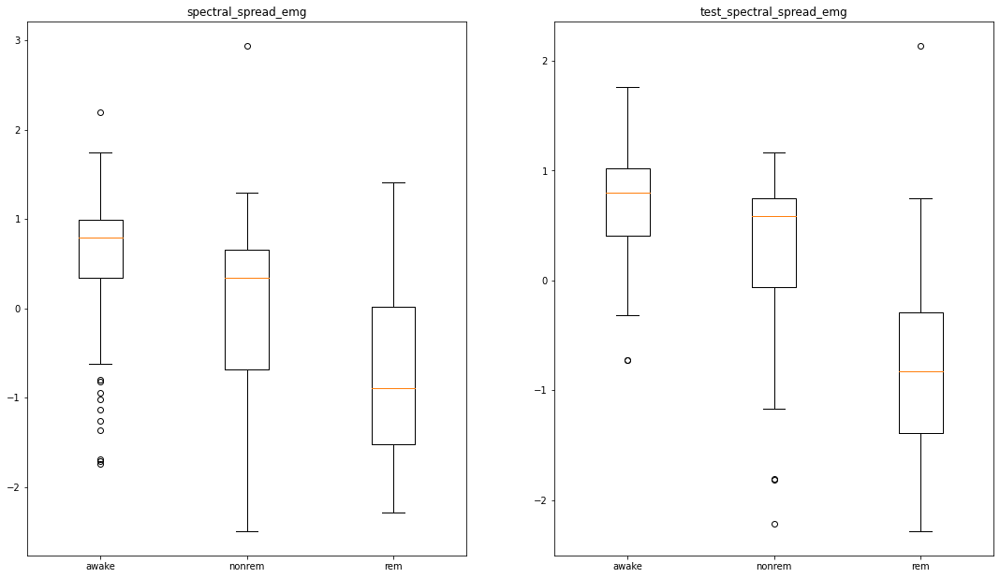

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


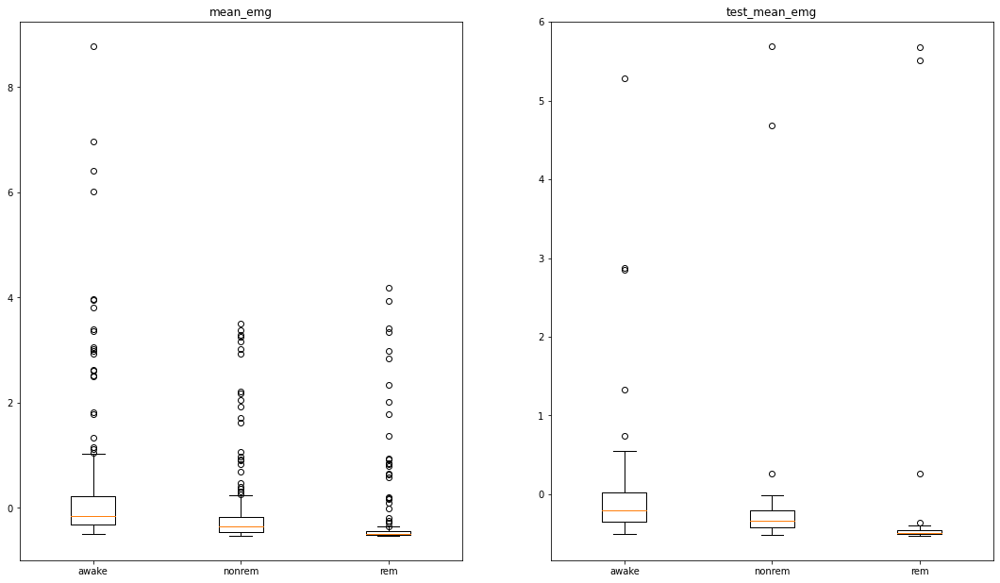

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


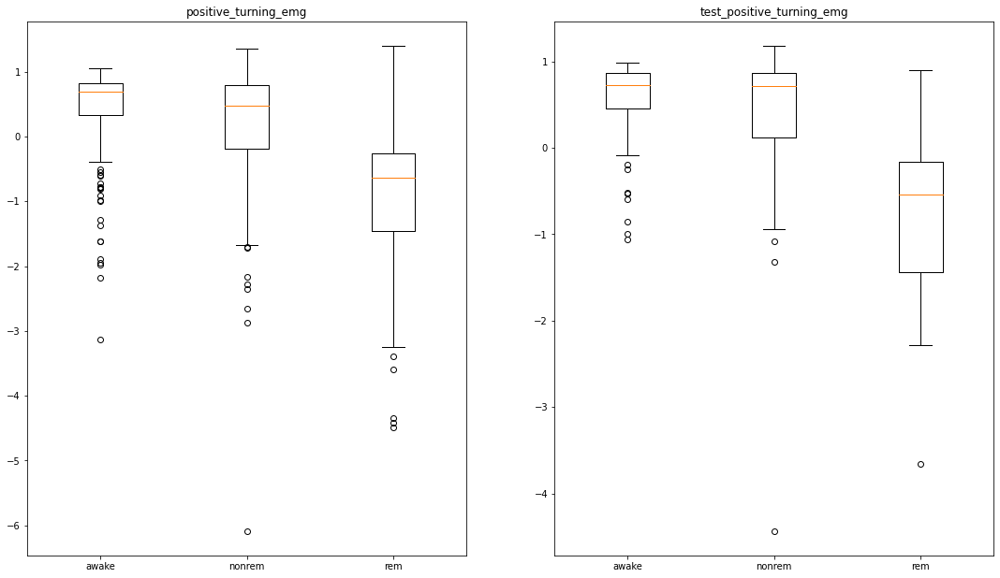

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


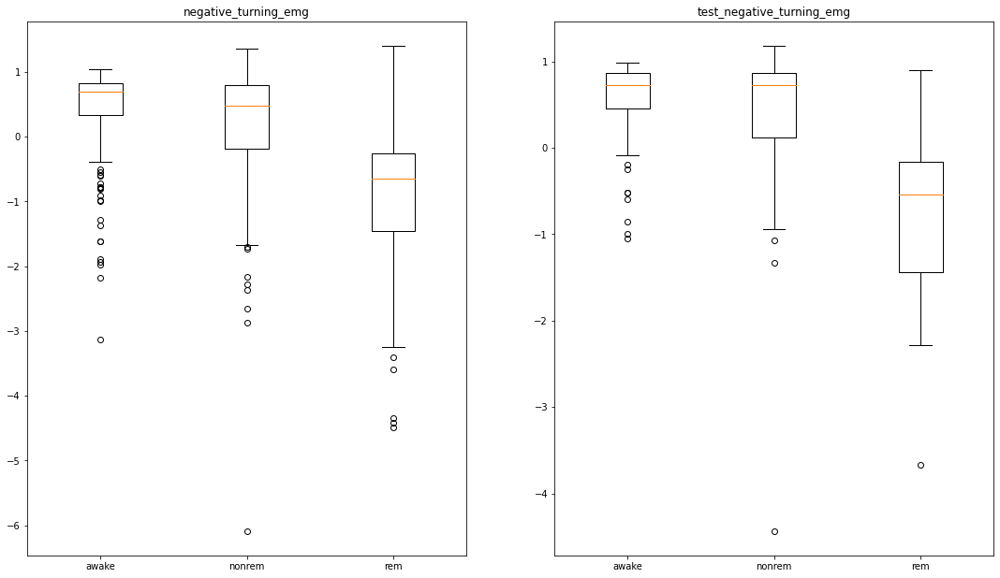

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


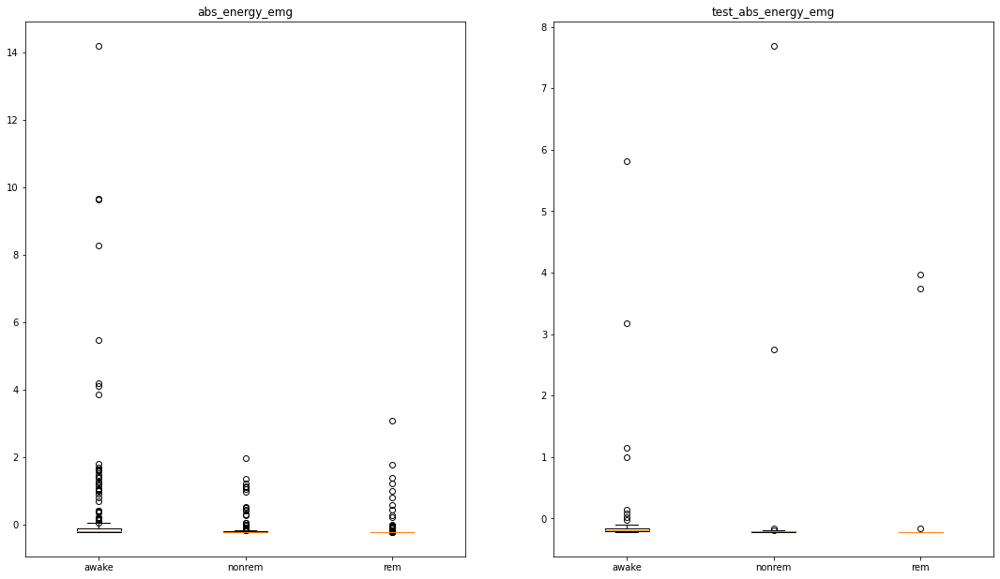

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


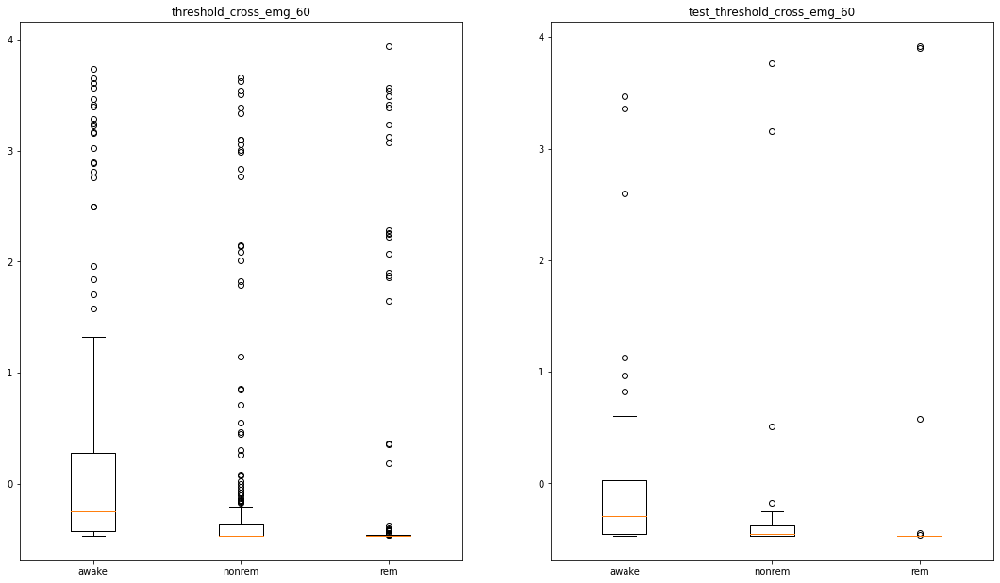

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


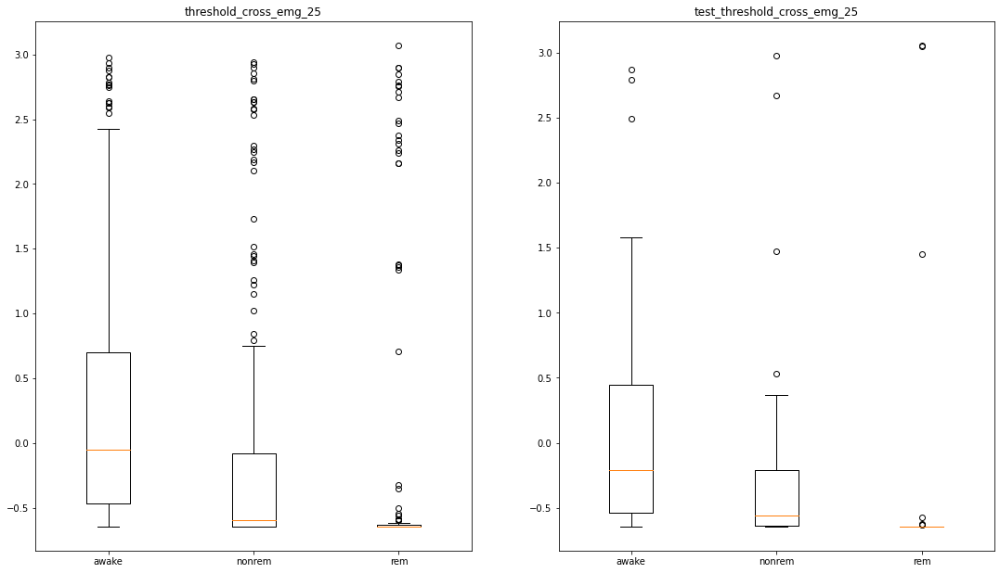

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


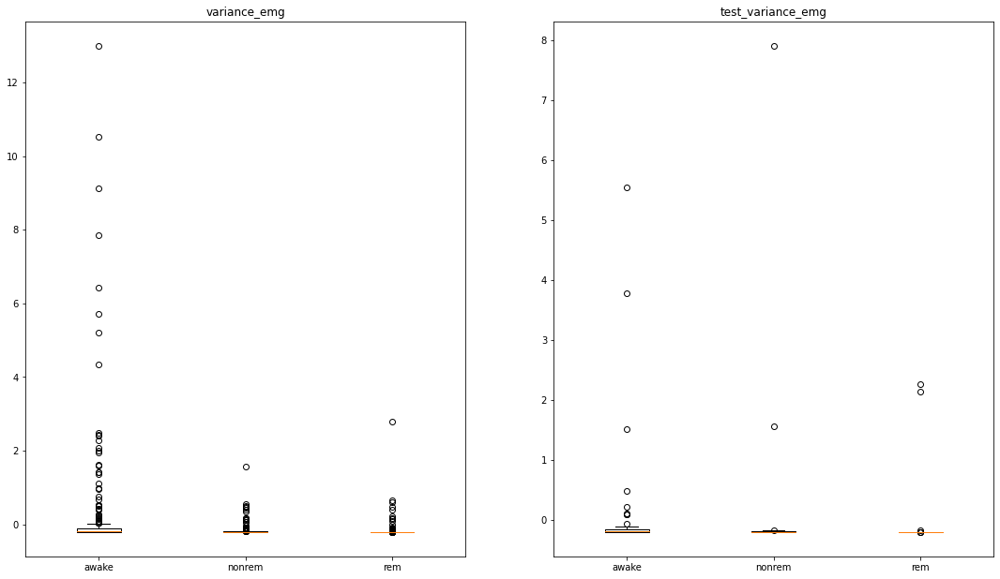

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


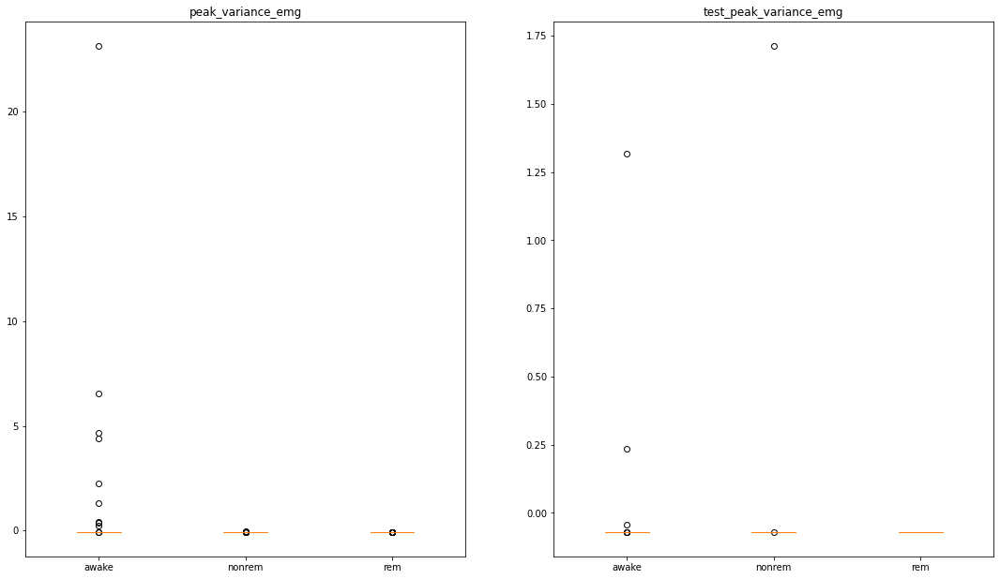

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


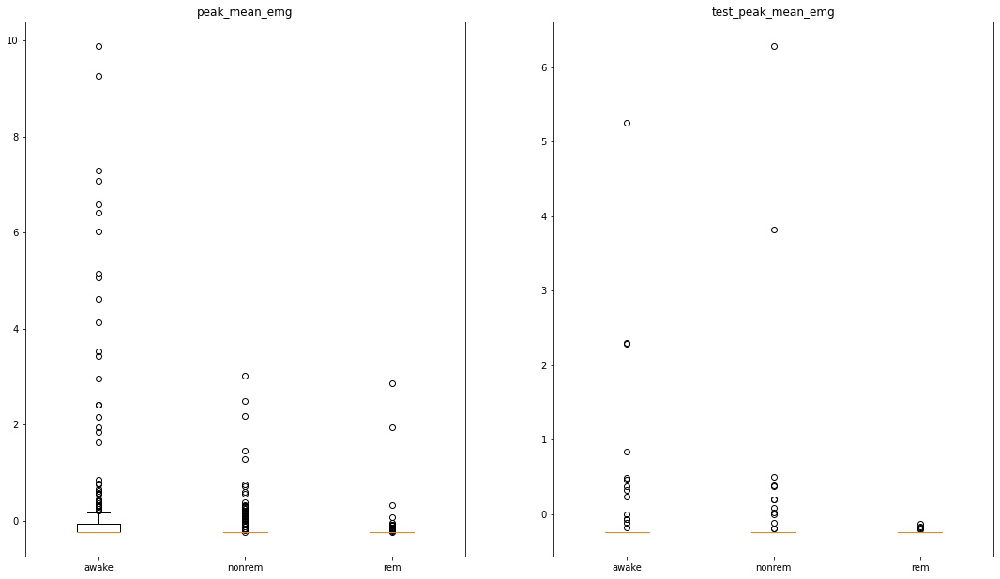

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


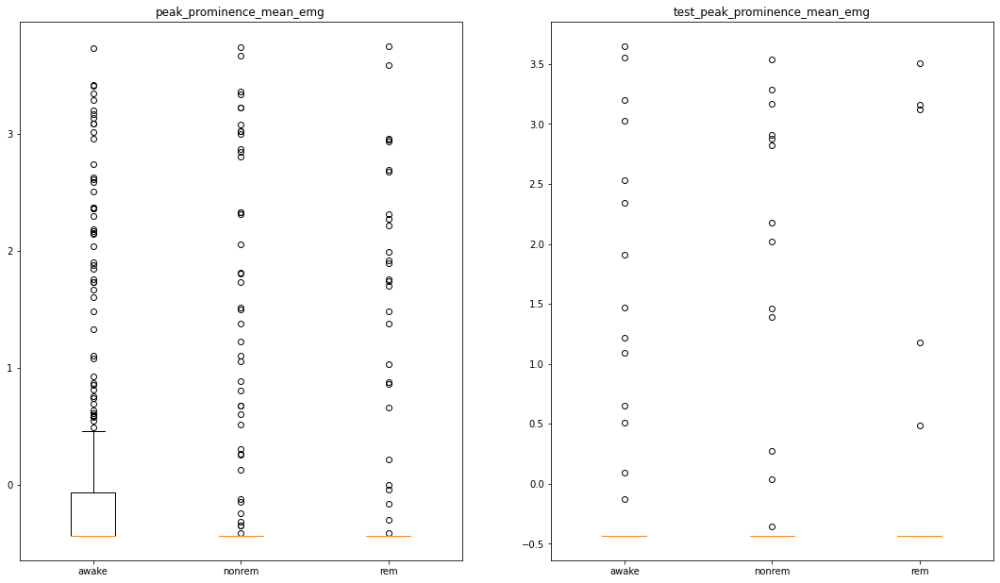

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


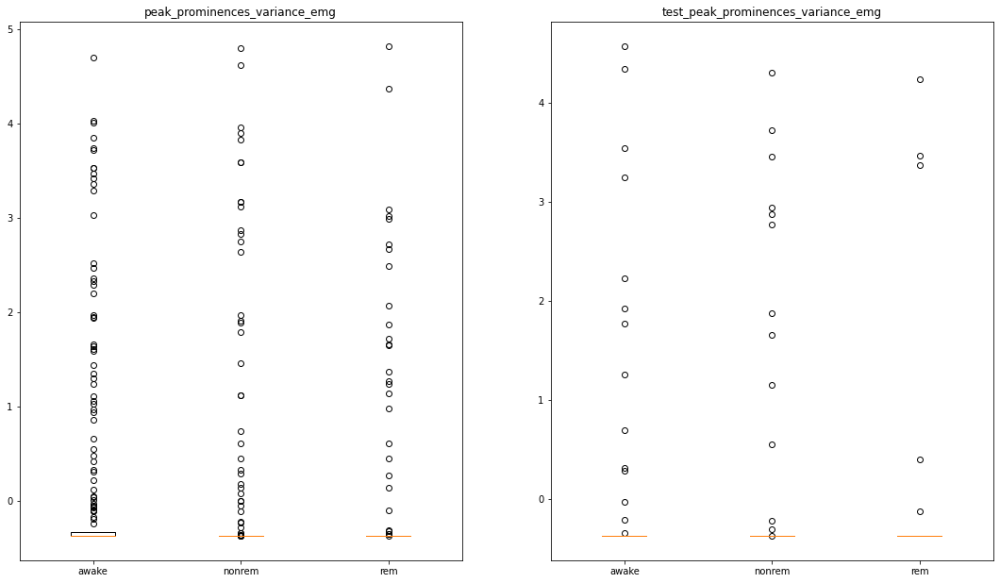

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


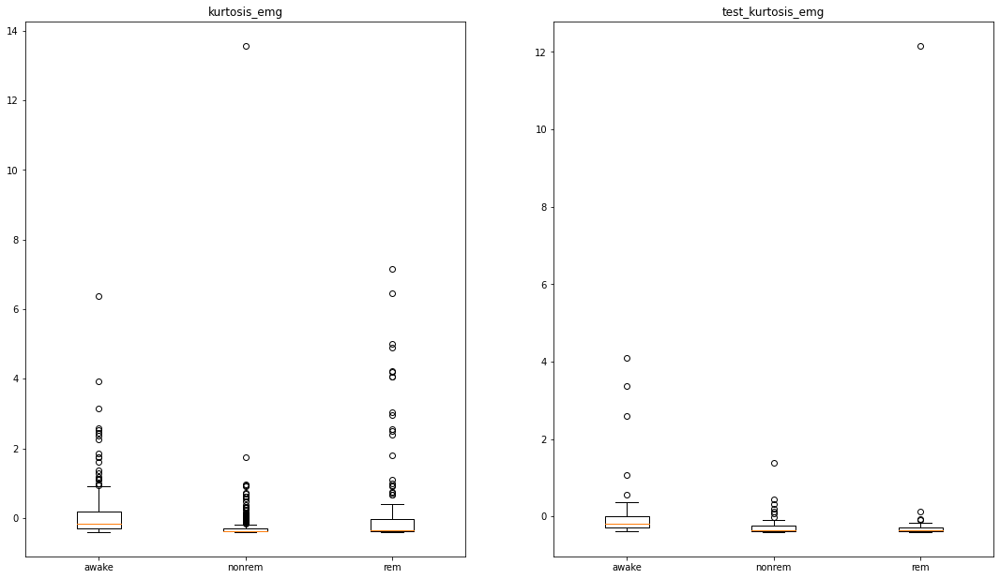

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


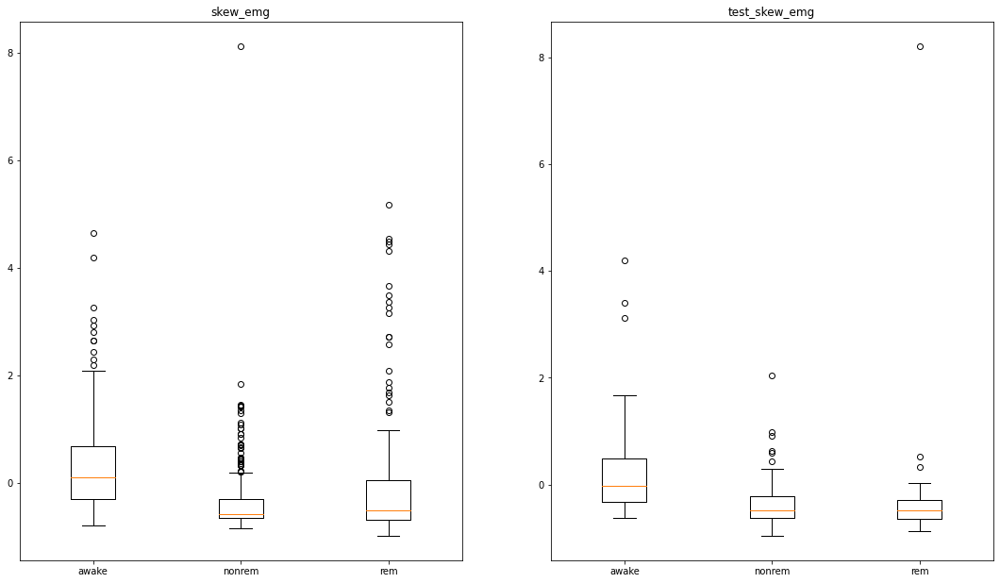

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


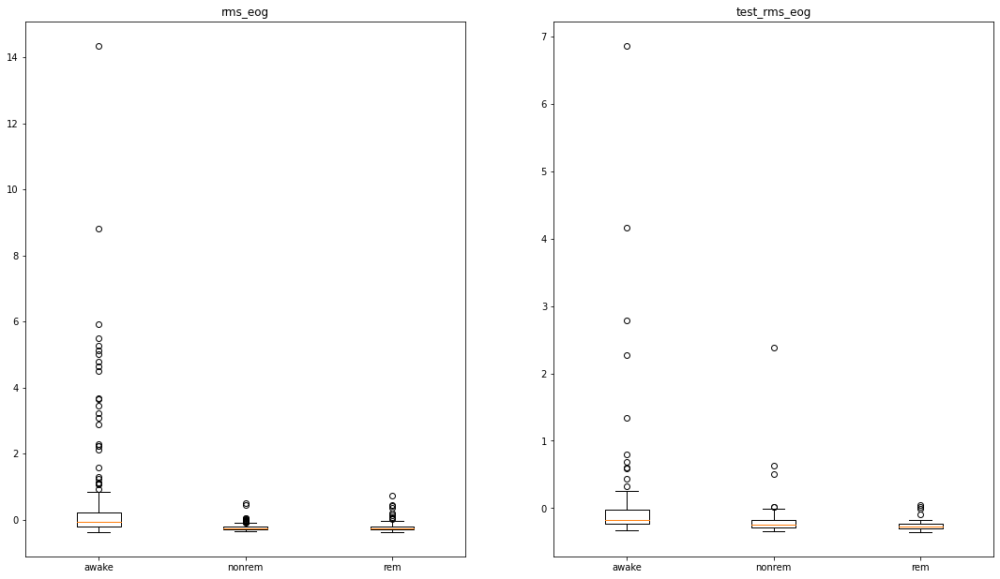

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


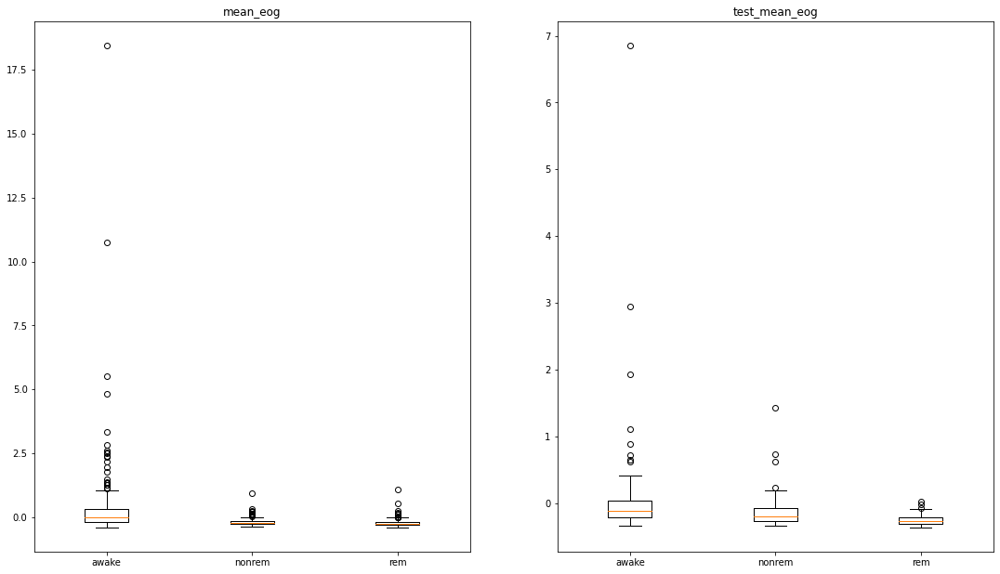

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


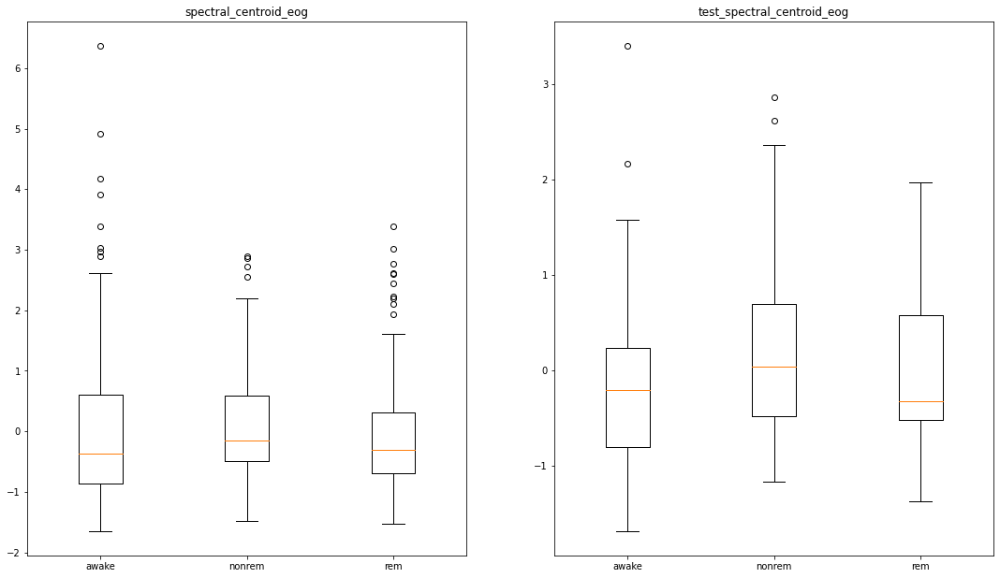

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


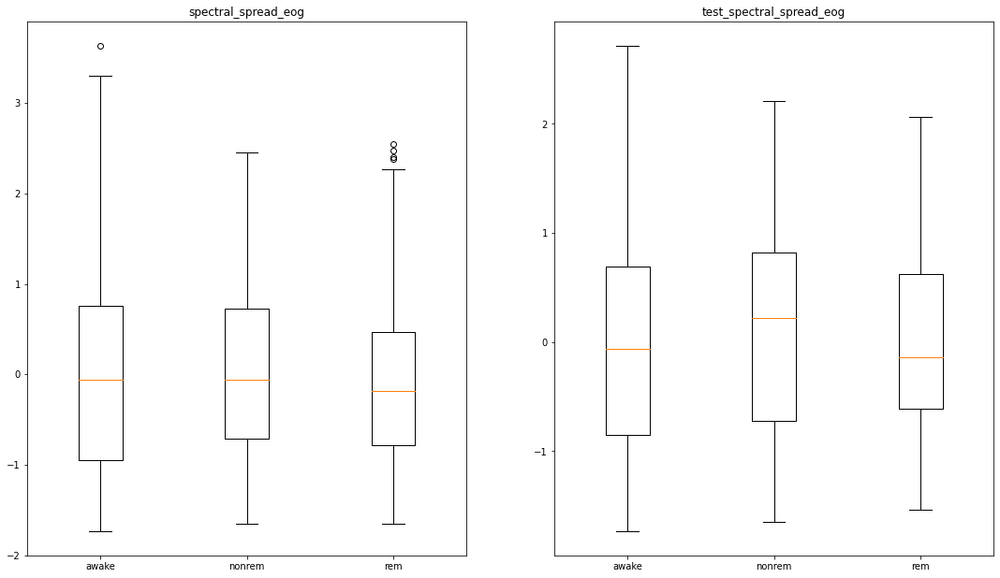

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


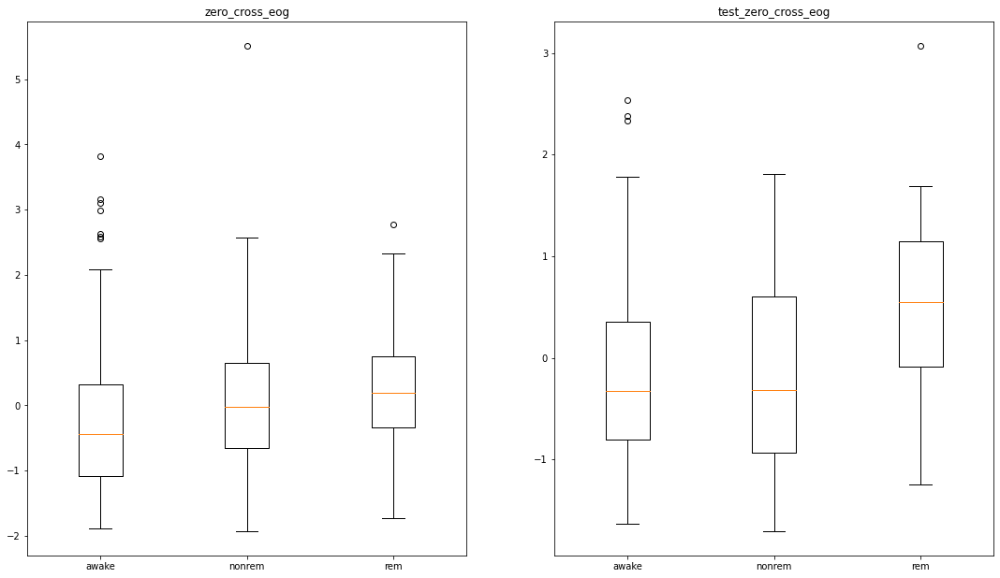

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


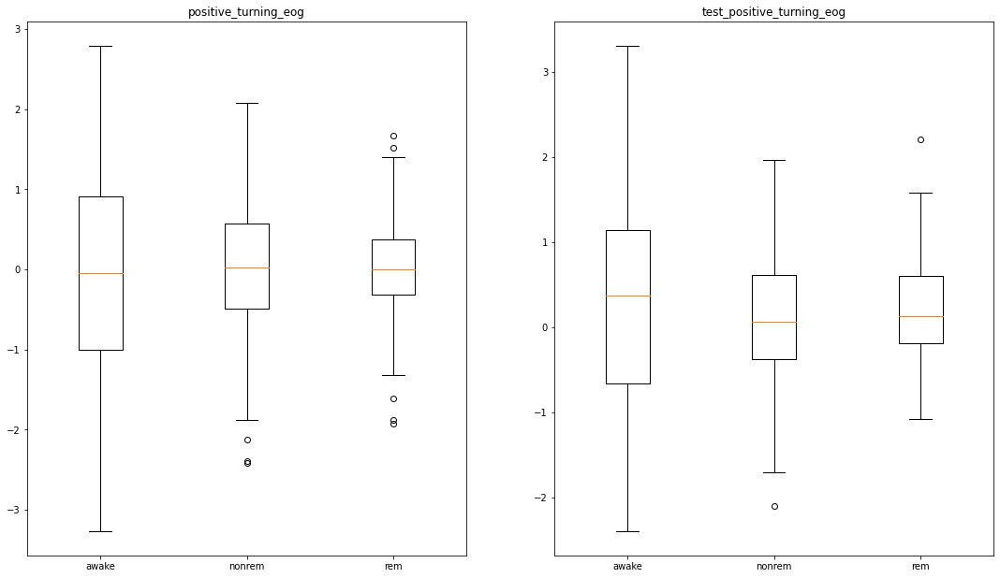

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


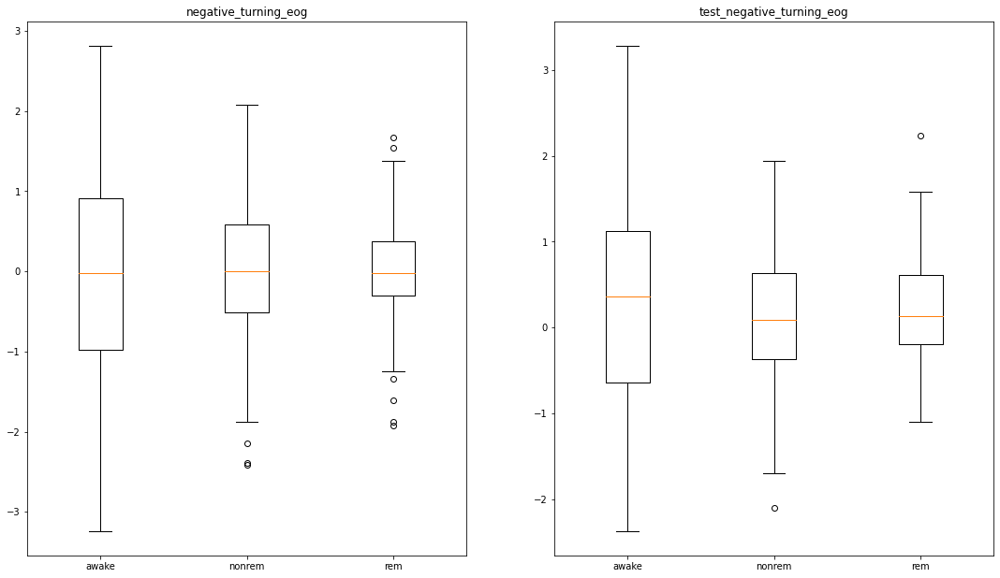

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


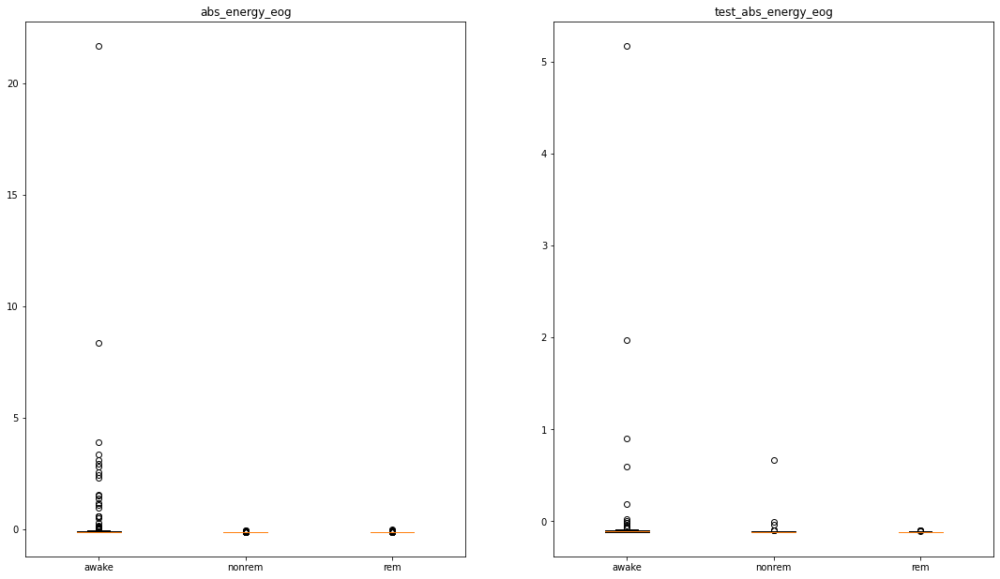

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


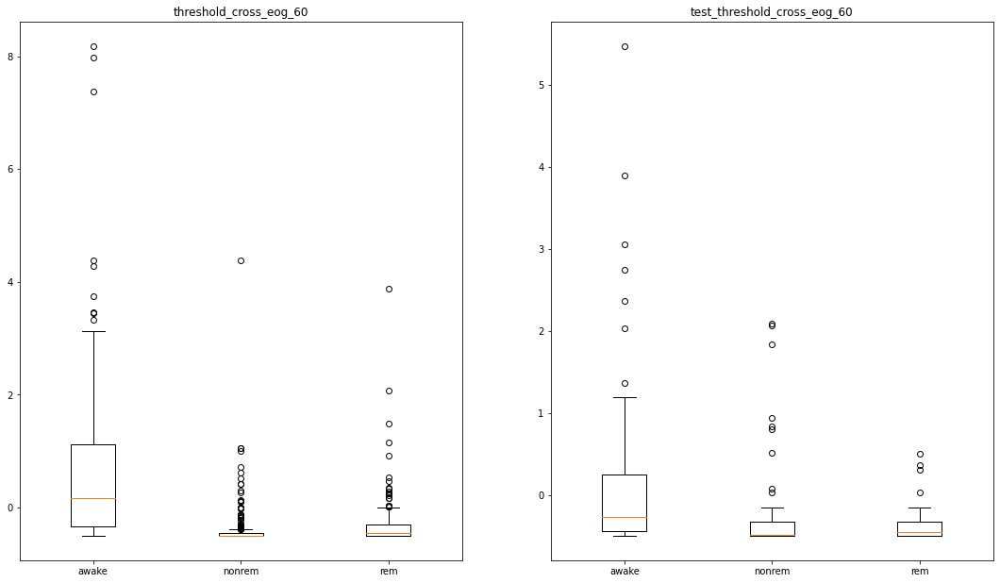

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


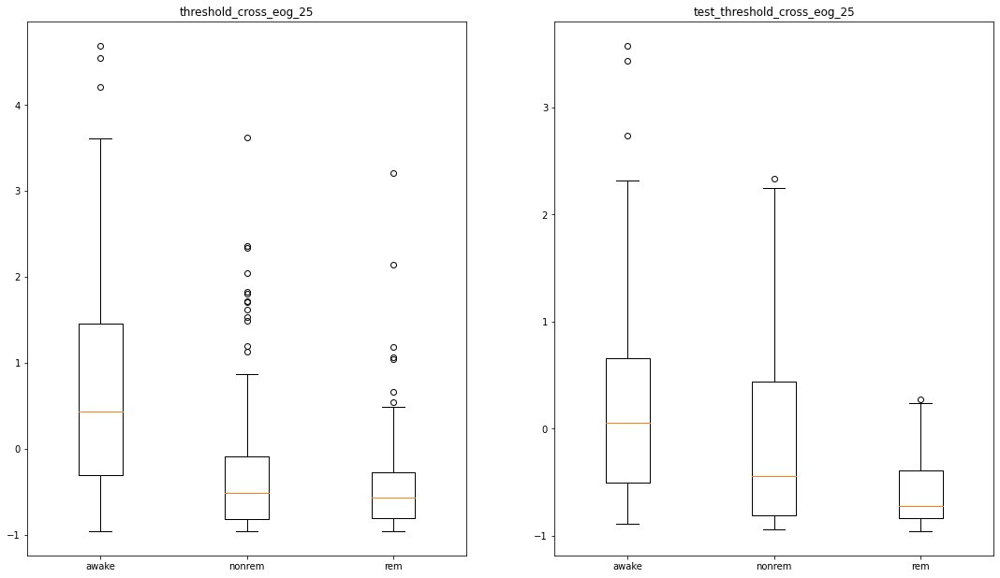

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


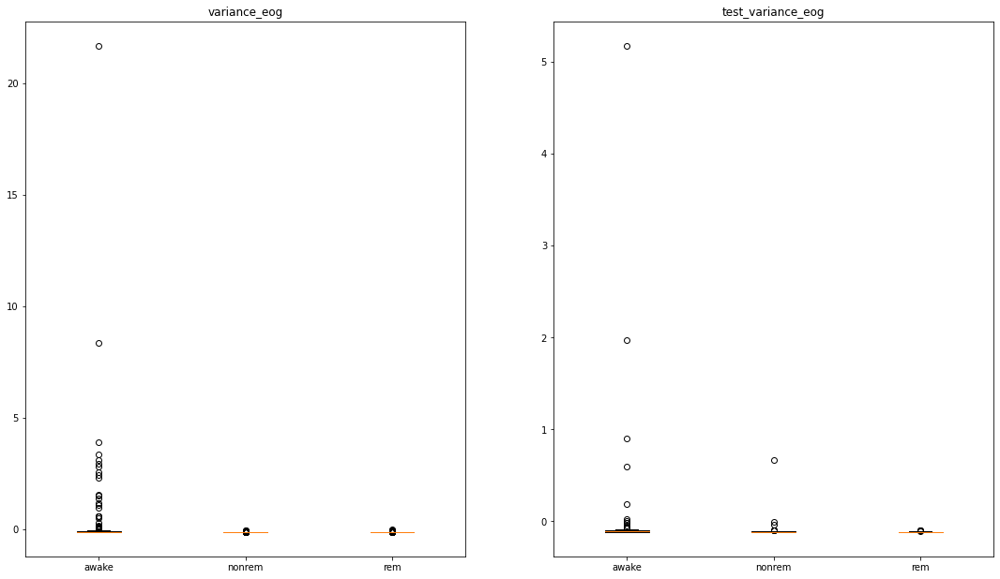

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


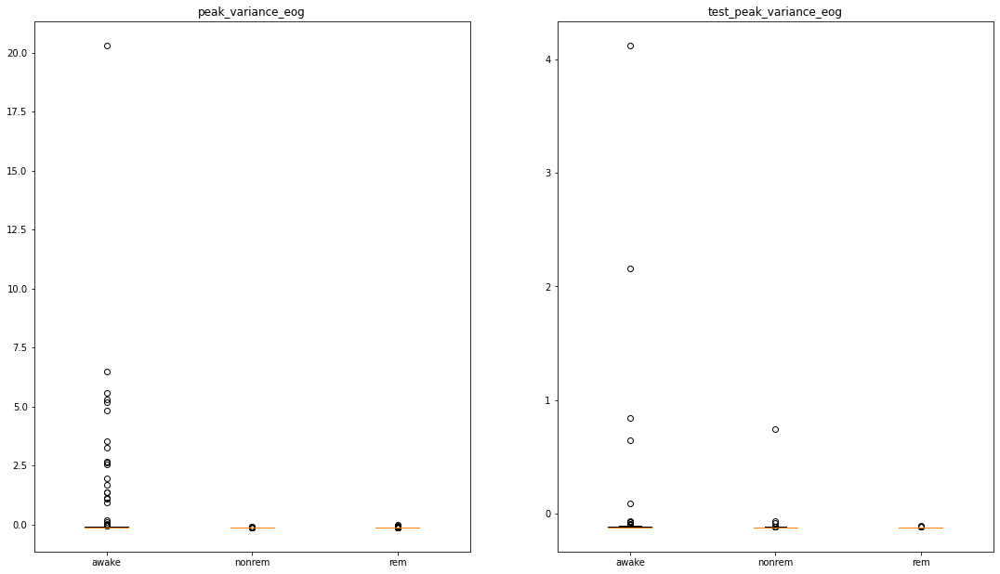

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


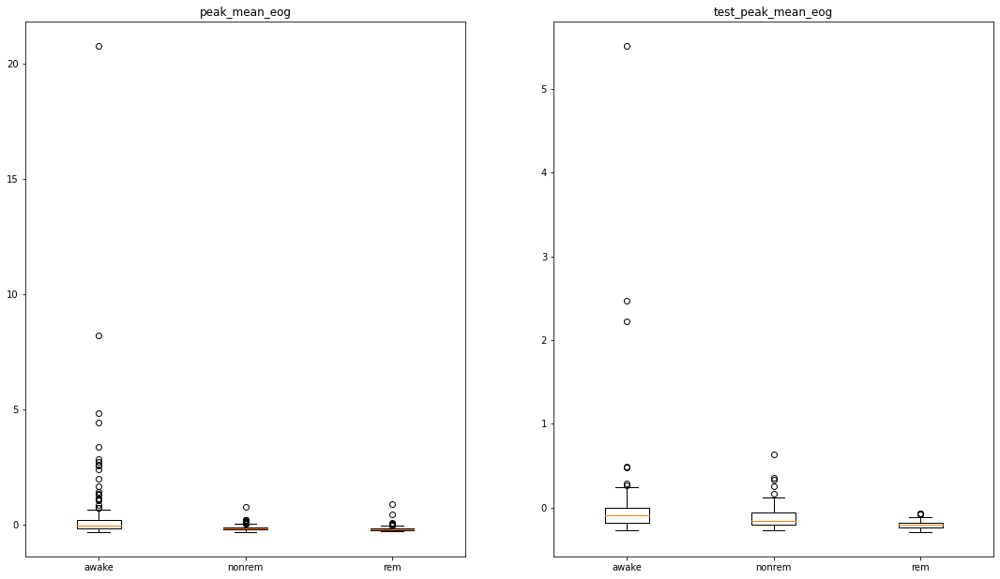

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


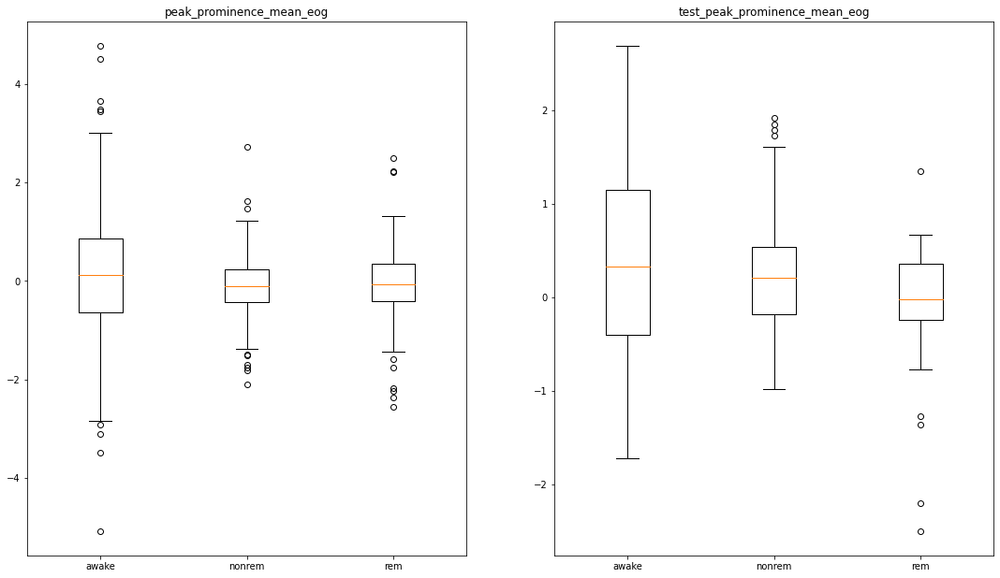

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


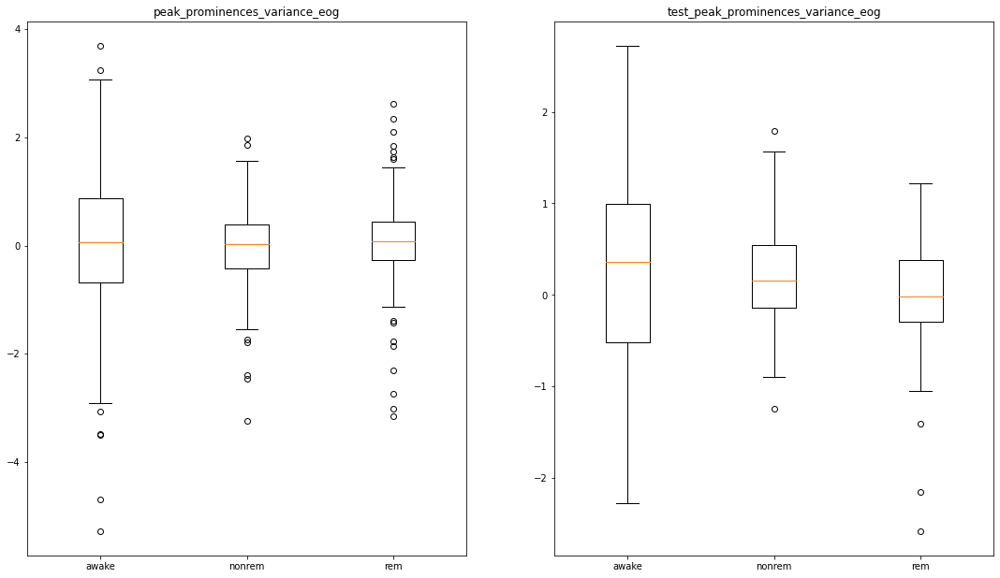

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


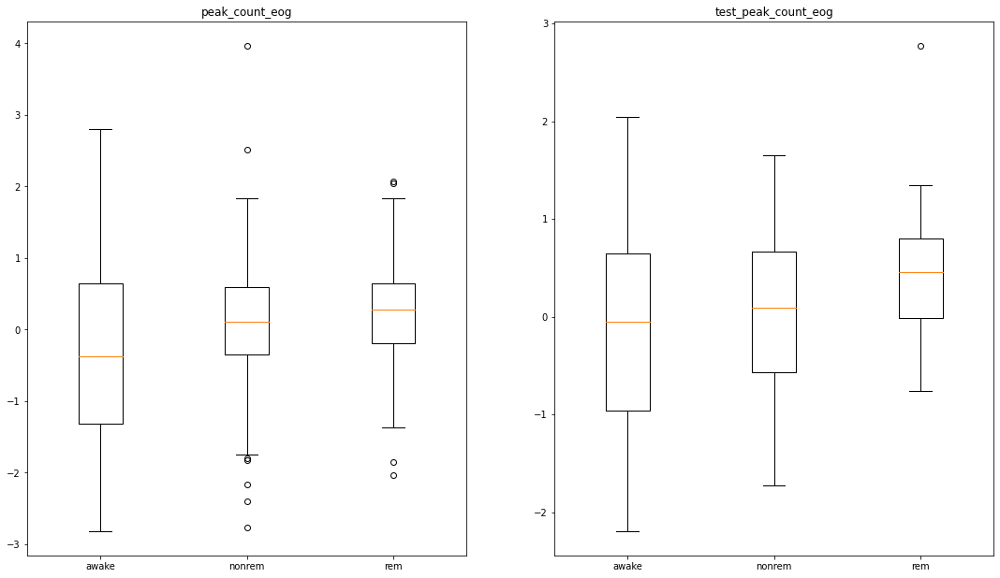

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


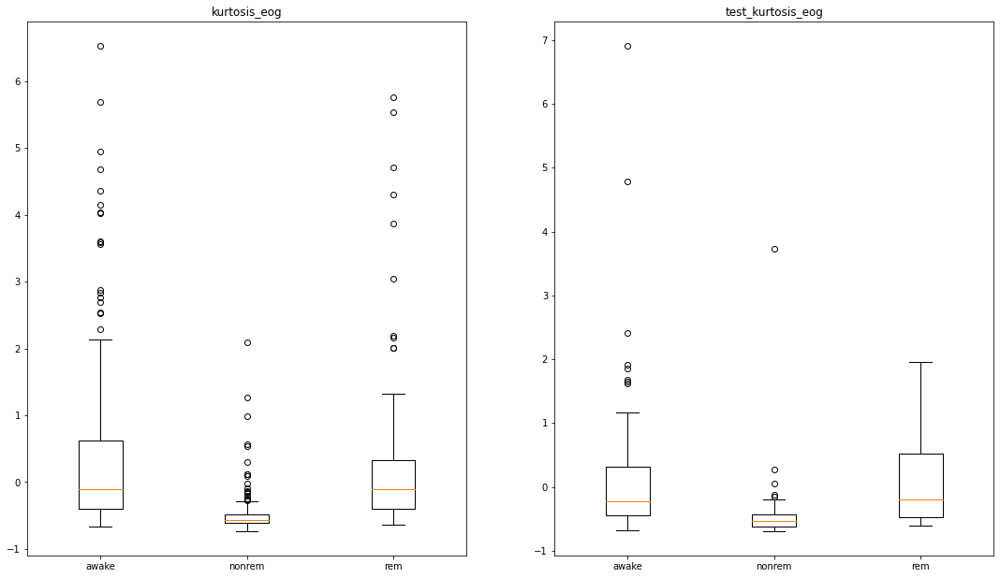

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


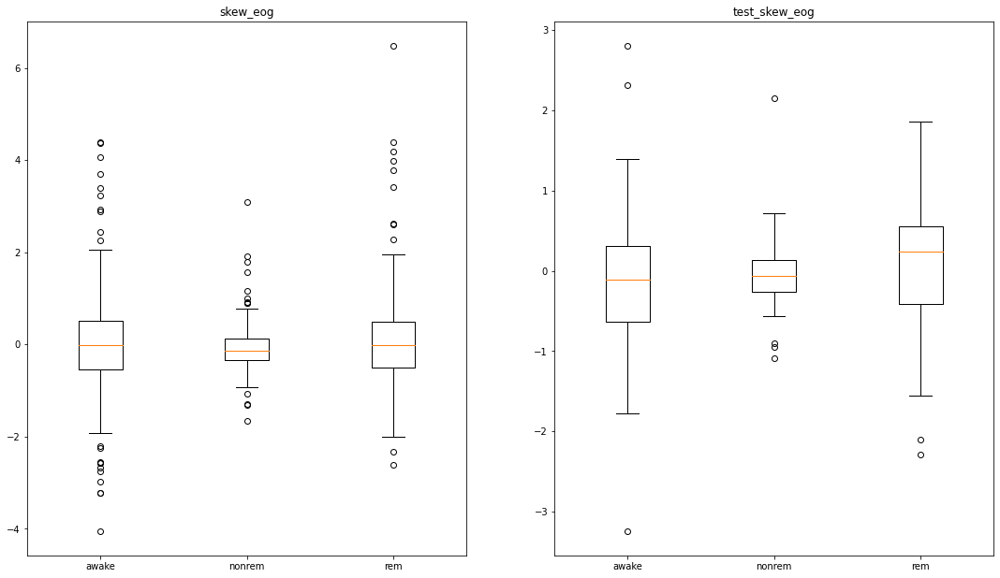

In [434]:
for feature in features:
  labels=std_data_set["labels"]
  labels_test=test_std_data_set["labels"]
  types=getTypes(labels)
  x_test=[]
  x=[]
  for typ in types:
      x_type=[]
      for i in range( len(labels)):
          if(labels[i]==typ):
              x_type.append(std_data_set[feature][i])
      x.append(x_type)

  for typ in types:
      x_type_test=[]
      for j in range(len(labels_test)):
          if(labels_test[j]==typ):
              x_type_test.append(test_std_data_set[feature][j])
      x_test.append(x_type_test)
  
  fig, (ax1, ax2) = plt.subplots(1, 2)
  fig.set_size_inches(18.5, 10.5)
  # Creating axes instance
  
  ax1.set_title(feature)
  ax2.set_title("test_"+feature)
  # Creating plot
  bp1 = ax1.boxplot(x)
  bp2 = ax2.boxplot(x_test)
  ax1.set_xticklabels(types)
  ax2.set_xticklabels(types)
  # show plot
  plt.show()

#Machine learning
Because of the nature of the problem that is classification we shall use K-nearest neighbour classifier.

In [435]:
#imports
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import sklearn
import seaborn as sns
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import recall_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import preprocessing
from sklearn import tree
from sklearn.naive_bayes import GaussianNB
import time

In [436]:
def getSamplesAndLabels(data,variables,label):
    x=[]
    y=[]
    for row in range(len(data)):
        sample=[]
        for variable in variables:
            sample.append(data[variable][row])
        x.append(sample)
        y.append(data[label][row])
        
    return x,y

In [437]:
features_emg=["rms_emg", 	"spectral_centroid_emg", 	"spectral_spread_emg" 
              ,"mean_emg","positive_turning_emg","negative_turning_emg"
              ,"abs_energy_emg","threshold_cross_emg_60","threshold_cross_emg_25","variance_emg","peak_variance_emg","peak_mean_emg","peak_prominence_mean_emg","peak_prominences_variance_emg","kurtosis_emg","skew_emg"]
features_eog=["rms_eog", 	"spectral_centroid_eog", 	"spectral_spread_eog"
              ,"zero_cross_eog","positive_turning_eog","negative_turning_eog"
              ,"abs_energy_eog","threshold_cross_eog_60","threshold_cross_eog_25","variance_eog"
              ,"peak_variance_eog","peak_mean_eog","peak_prominence_mean_eog","peak_prominences_variance_eog"
              ,"peak_count_eog","kurtosis_eog","skew_eog"]

In [438]:
features=["rms_eog","variance_eog","peak_variance_eog","peak_mean_eog",
          "threshold_cross_eog_25","threshold_cross_eog_60","rms_emg",
          "variance_emg","mean_emg","spectral_spread_emg","spectral_centroid_emg","peak_variance_emg","peak_mean_emg",
          "threshold_cross_emg_25","threshold_cross_emg_60","kurtosis_eog","kurtosis_emg"]
features = features_eog + features_emg
#features = ["rms_eog","rms_emg","variance_eog","variance_emg",]
X,y=getSamplesAndLabels(std_data_set,features,"labels")

#print(x)
#print(y)
print(len(X)==len(y))

True


In [439]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.20, random_state=42, shuffle=True, stratify=y)

#KNN-classifier

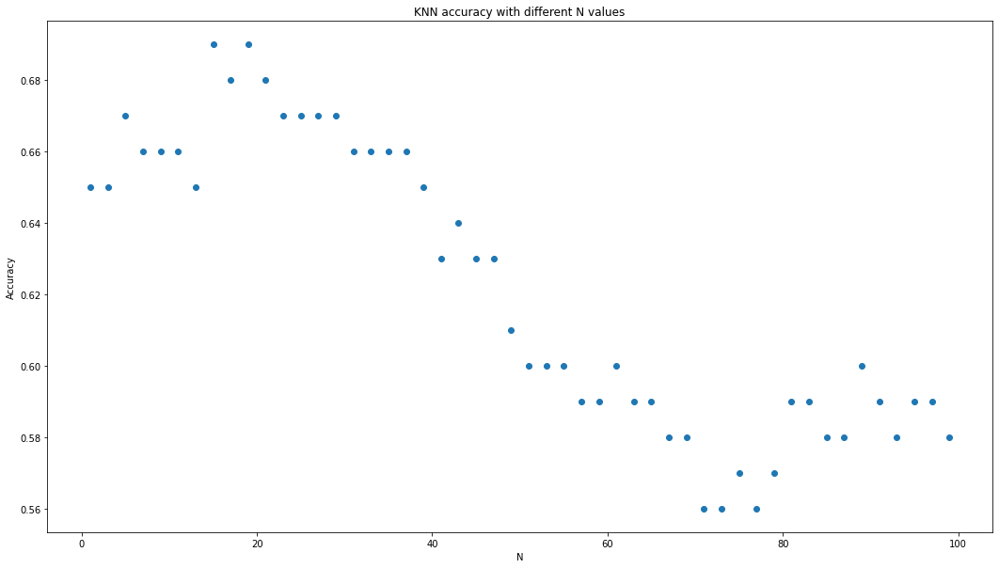

In [453]:
knn_accuracies=[]
x = range(1,100,2)
largest = 0
N=0
for i in x:
  knn=KNeighborsClassifier(n_neighbors=i)
  knn.fit(X_train,y_train)
  predictions = knn.predict(X_test)
  accuracy=np.round(accuracy_score(y_test, predictions),2)
  if accuracy > largest:
    N=i
    largest = accuracy
  knn_accuracies.append(accuracy)

fig, axs = plt.subplots()
fig.set_size_inches(18, 10)
axs.set_title("KNN accuracy with different N values")
axs.scatter(x, knn_accuracies, color='C0')
axs.set_xlabel("N")
axs.set_ylabel("Accuracy")
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMa

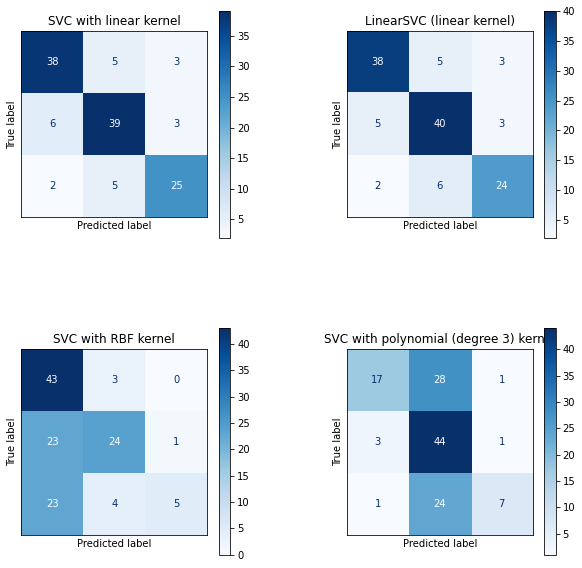

SVC with linear kernel accuracy: 0.81
LinearSVC (linear kernel) accuracy: 0.81
SVC with RBF kernel accuracy: 0.57
SVC with polynomial (degree 3) kernel accuracy: 0.54


In [454]:
C=1.0
svm_models = (
    sklearn.svm.SVC(kernel="linear", C=C),
    sklearn.svm.LinearSVC(C=C, max_iter=10000),
    sklearn.svm.SVC(kernel="rbf", gamma=0.7, C=C),
    sklearn.svm.SVC(kernel="poly", degree=3, gamma="auto", C=C),
)
svm_models = (clf.fit(X_train, y_train) for clf in svm_models)
titles = (
    "SVC with linear kernel",
    "LinearSVC (linear kernel)",
    "SVC with RBF kernel",
    "SVC with polynomial (degree 3) kernel",
)

# Set-up 2x2 grid for plotting.
fig, sub = plt.subplots(2, 2,figsize=(10,10))
plt.subplots_adjust(wspace=0.4, hspace=0.4)
accuracies = {}
best_accuracy=0
best_svc_model=0
for clf, title, ax in zip(svm_models, titles, sub.flatten()):
  plot_confusion_matrix(clf, X_test, y_test, ax=ax, cmap="Blues")
  ax.set_xticks(())
  ax.set_yticks(())
  ax.set_title(title)
  predictions_list=clf.predict(X_test)
  accuracy=np.round(accuracy_score(y_test, predictions_list),2)
  accuracies[title]= accuracy
  if accuracy>best_accuracy:
    best_accuracy=accuracy
    best_svc_model=clf
plt.show()
for key in accuracies.keys():
  print(key+" accuracy: "+str(accuracies[key]))

1
6
11
16
21
26
31
36
41
46
51
56
61
66
71
76
81
86
91
96
101
106
111
116
121
126
131
136
141
146
151
156
161
166
171
176
181
186
191
196
201
206
211
216
221
226
231
236
241
246
251
256
261
266
271
276
281
286
291
296
301
306
311
316
321
326
331
336
341
346
351
356
361
366
371
376
381
386
391
396
401
406
411
416
421
426
431
436
441
446
451
456
461
466
471
476
481
486
491
496


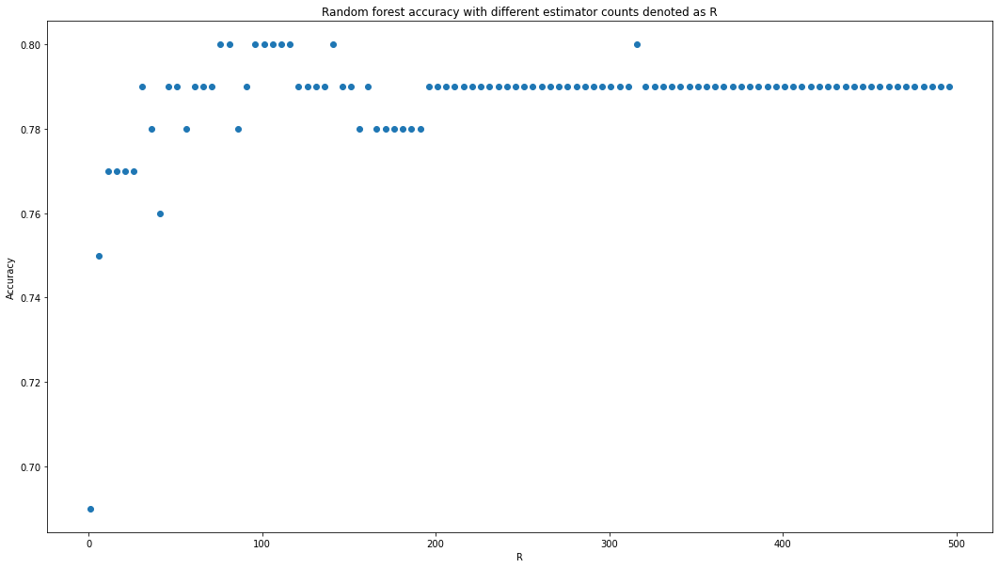

In [455]:
random_forest_accuracies=[]
rs=10
x = range(1,500,5)
largest = 0
R=0
best_random_forest_model=0
for i in x:
  os.system('clear')
  print(i)
  rf=RandomForestClassifier(n_estimators = i,random_state=rs)
  rf.fit(X_train,y_train)
  predictions = rf.predict(X_test)
  accuracy=np.round(accuracy_score(y_test, predictions),2)
  if accuracy > largest:
    R=i
    largest = accuracy
    best_random_forest_model=rf
  random_forest_accuracies.append(accuracy)

fig, axs = plt.subplots()
fig.set_size_inches(18, 10)
axs.set_title("Random forest accuracy with different estimator counts denoted as R")
axs.scatter(x, random_forest_accuracies, color='C0')
axs.set_xlabel("R")
axs.set_ylabel("Accuracy")
plt.show()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


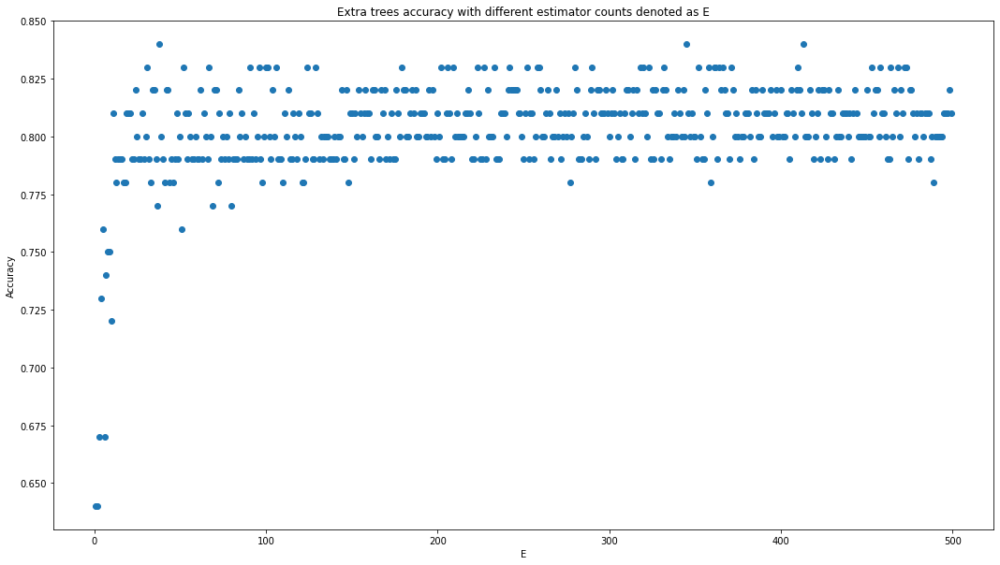

In [456]:
extra_trees_accuracies=[]
x = range(1,500)
largest = 0
E=0
best_extra_trees_model=0
for i in x:
  os.system('clear')
  print(i)
  et=ExtraTreesClassifier(n_estimators = i)
  et.fit(X_train,y_train)
  predictions = et.predict(X_test)
  accuracy=np.round(accuracy_score(y_test, predictions),2)
  if accuracy > largest:
    E=i
    largest = accuracy
    best_extra_trees_model=et
  extra_trees_accuracies.append(accuracy)

fig, axs = plt.subplots()
fig.set_size_inches(18, 10)
axs.set_title("Extra trees accuracy with different estimator counts denoted as E")
axs.scatter(x, extra_trees_accuracies, color='C0')
axs.set_xlabel("E")
axs.set_ylabel("Accuracy")
plt.show()

# Many machine learning models
* K-nearest neighbor (KNN)
  - KNN is a simple and intuitive method of classifier used by many previous studies for classifying signals and images
  - KNN classifier makes a decision by comparing a new sample of test data with training data
   - The basis of KNN is that when most of the k nearest
samples of data belong to a class, the sample also belongs to it. Therefore, the sample has the characteristics of the class. 

* Support vector classifier (SVM)
  - SVM is often used as classification algorithms, of body movements, images, sound, etc., which makes it a good model for our study
  - SVM offer a high classification accuracy
since it enables the combination with other pattern classification models to reach various objectives
that are taken in the classification, besides a high accuracy percentage
  - SVM's advatage is that it utilizes a kernel to reduce the computational strain of higher dimensionality of the mapping function
  - SVM is a widely used ML method for sleep analyses as it has generated higher empirical accuracy and better generalization capabilities than other standard supervised classifiers in previous studies (Fatma Guler and Ubeyli, 2007; Lotte et al., 2007; Xu et al., 2009; Li et al., 2012). Despite of that, SVM suffers from a selection of penalty parameter and thus, it is limited by the number of SVs.

* Decision tree (DT)
  - Decision tree algorithms are widely used in machine learning to study biomedical signals.
  - DT is a classification and apredictive model where a data item is
classfied by following a path of fulfilled conditions
from a root of the tree till approaching a leaf. The leaf
equals to a class label. Hence, a set of classification rules
are derived from decision tree.

* Random forest (RF)
 - RF is widely is used to study sleep scoring with biosignals.
 - RF is an ensemble ML method for classification. It assembles a set of trees at the training set, and the final classification outcomes are reached by the most votes in the forest. The training algorithm of RF employe the
general technique of bootstrap aggregating that chooses random
instances with replacement from the training set.

* Extra trees (ET)
  - ET constructs several trees and splits nodes by applying random subsets of features. The splitting condition is derived from impurity. This impurity for classification issues is computed using Gini impurity / information gain (entropy), while it is variance for regression trees. Hence, when we train the trees to predict the target variables, we can process the contribution of each feature in predicting the correct outcomes.
  - Feature significance of ET classifier is computed by averaging the decrease in impurity over trees.

* Naive Bayes (NB)
  - NB is one of the most common supervised classifiers to study sleep stages
  - NB is a probabilistic classifier that is derived from Bayes theorem (i.e., Bayesian statistics) with robust independence presumptions between features. It presumes that the existence (or nonexistence) of a particular feature of a class is unrelated to the existence (or nonexistence) of any other features.
  - A benefit of NB is that it requires only a small
number of training data to weight the significance of parameters in
classification process.

15 76 38
KNN
Prediction time:  0.014611959457397461 seconds
Accuracy:  0.69


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


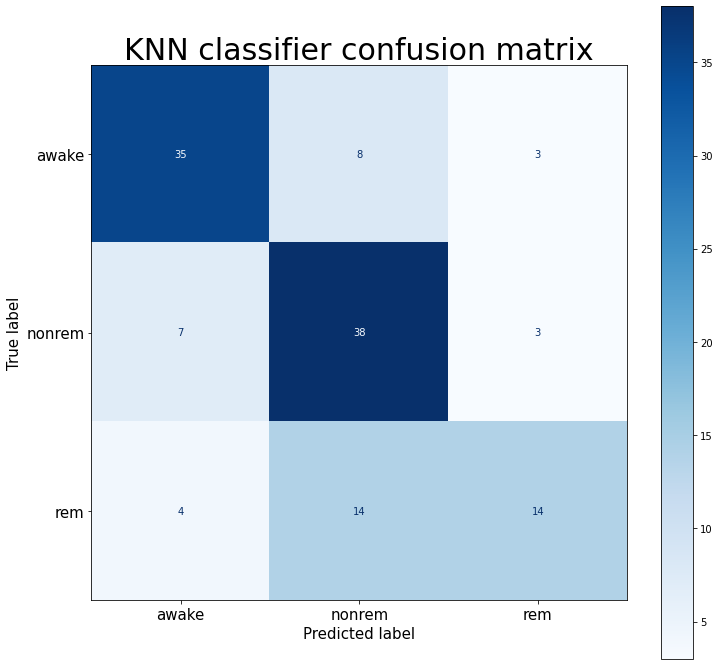

------------------------------
SVC
Prediction time:  0.005187034606933594 seconds
Accuracy:  0.81


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


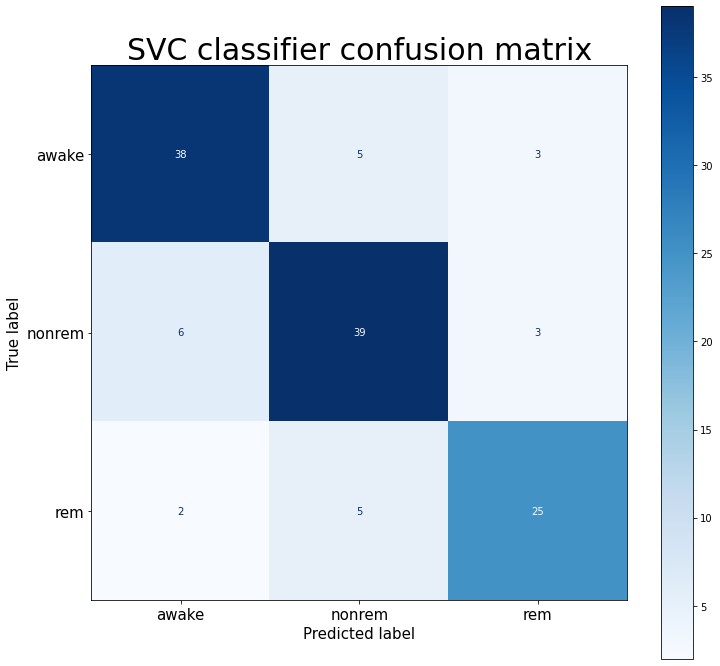

------------------------------
Decision tree
Prediction time:  0.003610372543334961 seconds
Accuracy:  0.71


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


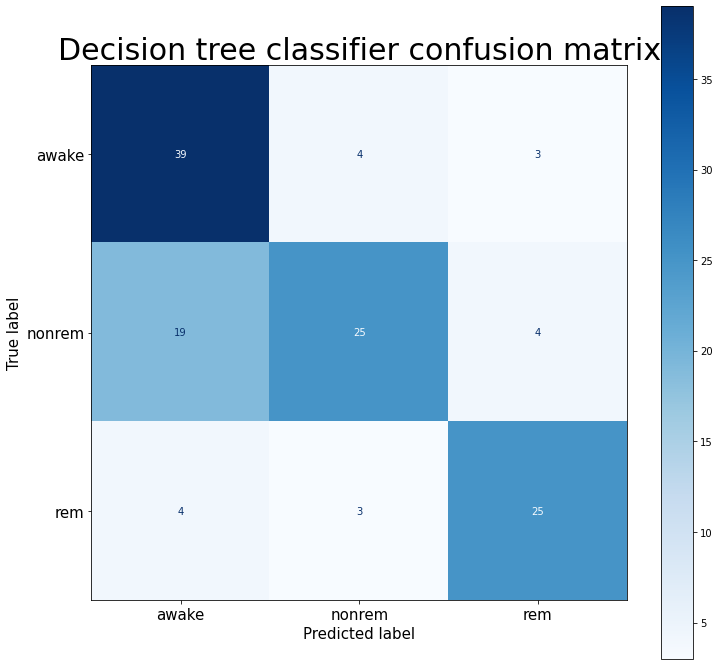

------------------------------
Random forest
Prediction time:  0.020891666412353516 seconds
Accuracy:  0.8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


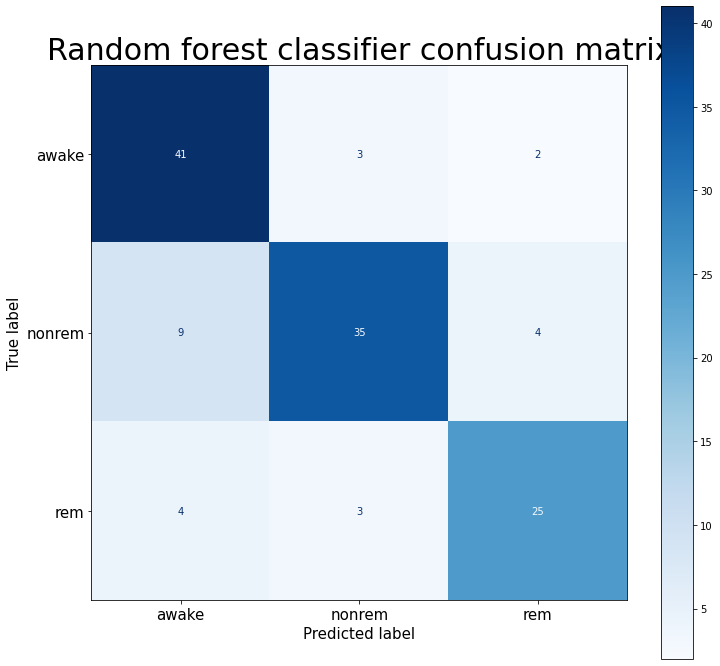

------------------------------
Extra trees
Prediction time:  0.01687908172607422 seconds
Accuracy:  0.84


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


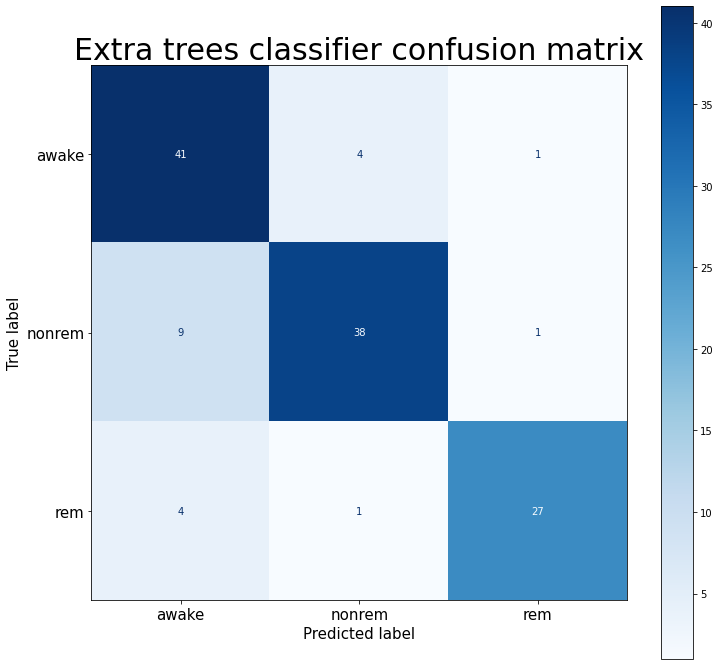

------------------------------
Naive bayes
Prediction time:  0.0035865306854248047 seconds
Accuracy:  0.6


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


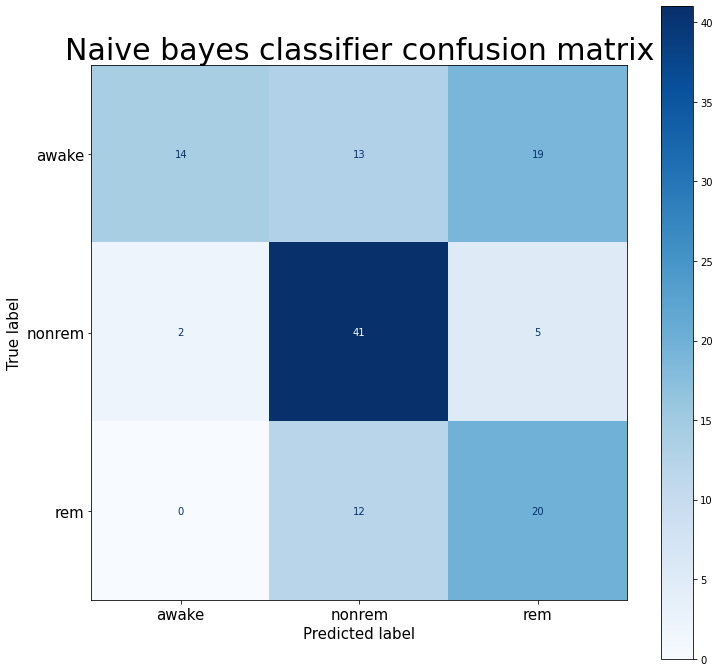

------------------------------
KNN accuracy: 0.69
SVC accuracy: 0.81
Decision tree accuracy: 0.71
Random forest accuracy: 0.8
Extra trees accuracy: 0.84
Naive bayes accuracy: 0.6


In [457]:
#hyperparameters
print(N,R,E)
nb=GaussianNB()
nb.fit(X_train, y_train)
dt=tree.DecisionTreeClassifier()
dt.fit(X_train, y_train)
knn=KNeighborsClassifier(n_neighbors=N)
knn.fit(X_train, y_train)


models = {"KNN":knn,"SVC":best_svc_model,
          "Decision tree":dt,"Random forest": best_random_forest_model,
          "Extra trees":best_extra_trees_model,"Naive bayes":nb}
predictions ={}
accuracies = {}
for key in models.keys():
  print(key)
  start=time.time()
  predictions[key] = models[key].predict(X_test)
  end=time.time()
  print("Prediction time: ",end-start,"seconds")
  accuracy = np.round(accuracy_score(y_test, predictions[key]),2)
  accuracies[key]=accuracy
  print("Accuracy: ", accuracy)
  fig, ax = plt.subplots(figsize=(12, 12))
  ax.set_title(key+" classifier confusion matrix", fontsize=30)
  plot_confusion_matrix(models[key], X_test, y_test, ax=ax, cmap="Blues")
  ax.xaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.yaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.set_xlabel("Predicted label",fontsize=15)
  ax.set_ylabel("True label",fontsize=15)
  plt.show()
  print("------------------------------")
for key in accuracies.keys():
  print(key+" accuracy: "+str(accuracies[key]))

#Performance on the actual test data

KNN
Training time:  0.007045745849609375 seconds
Prediction time:  0.013018369674682617 seconds
Accuracy:  0.67


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


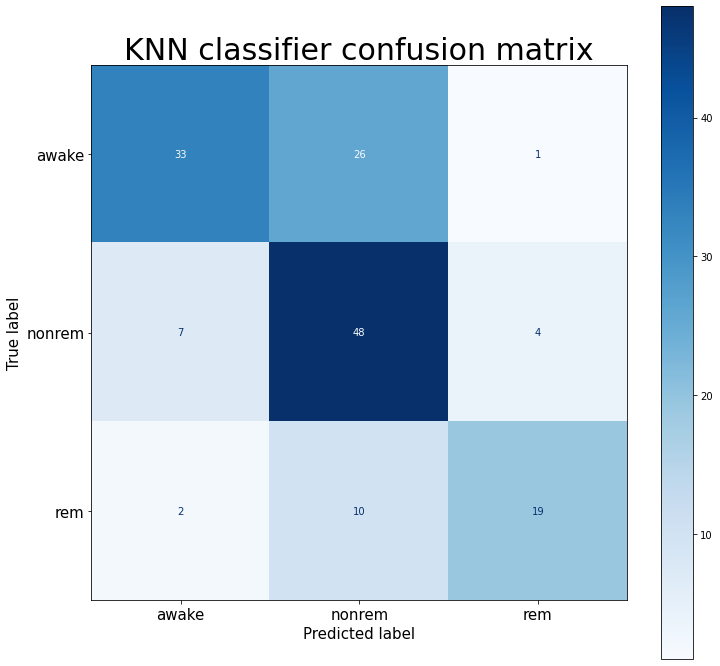

------------------------------------------
SVC
Training time:  0.03961014747619629 seconds
Prediction time:  0.003211498260498047 seconds
Accuracy:  0.75


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


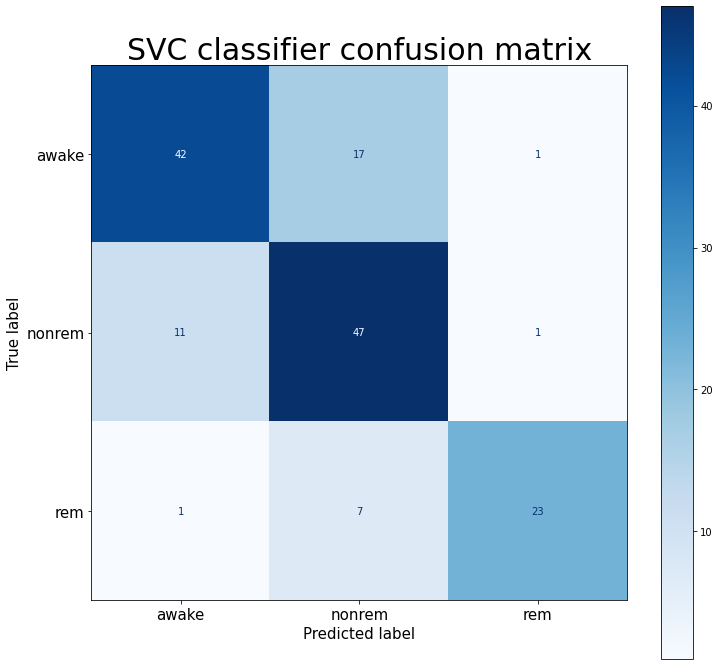

------------------------------------------
Decision tree
Training time:  0.02064657211303711 seconds
Prediction time:  0.0017287731170654297 seconds
Accuracy:  0.67


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


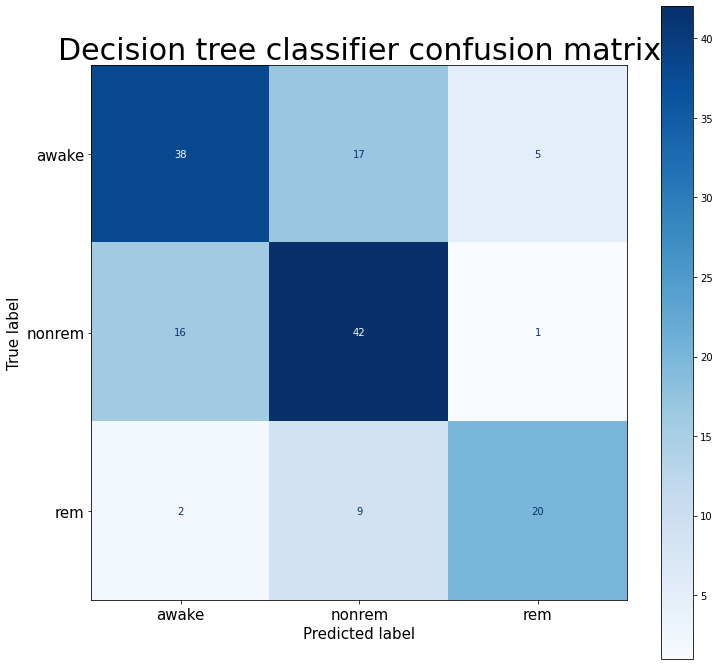

------------------------------------------
Random forest
Training time:  0.2450573444366455 seconds
Prediction time:  0.014767885208129883 seconds
Accuracy:  0.78


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


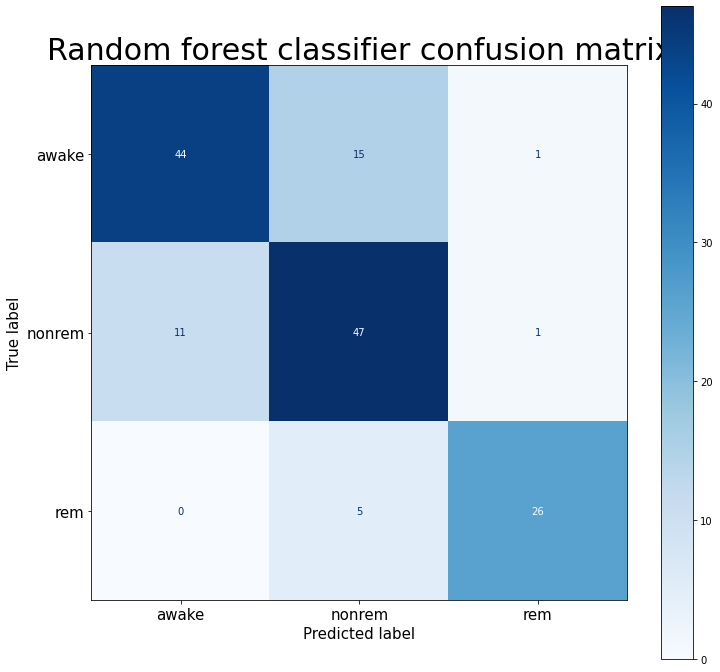

------------------------------------------
Extra trees
Training time:  0.08778858184814453 seconds
Prediction time:  0.008567333221435547 seconds
Accuracy:  0.79


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


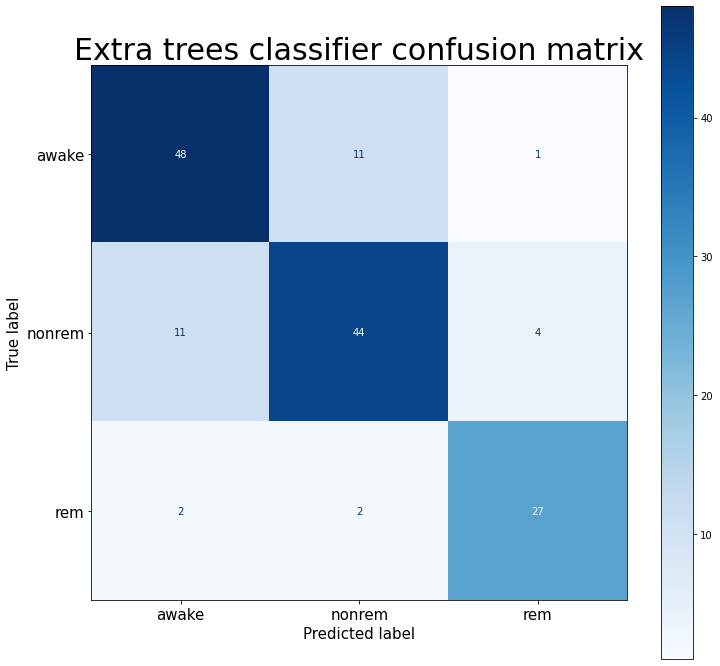

------------------------------------------
Naive bayes
Training time:  0.006728649139404297 seconds
Prediction time:  0.002894878387451172 seconds
Accuracy:  0.54


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


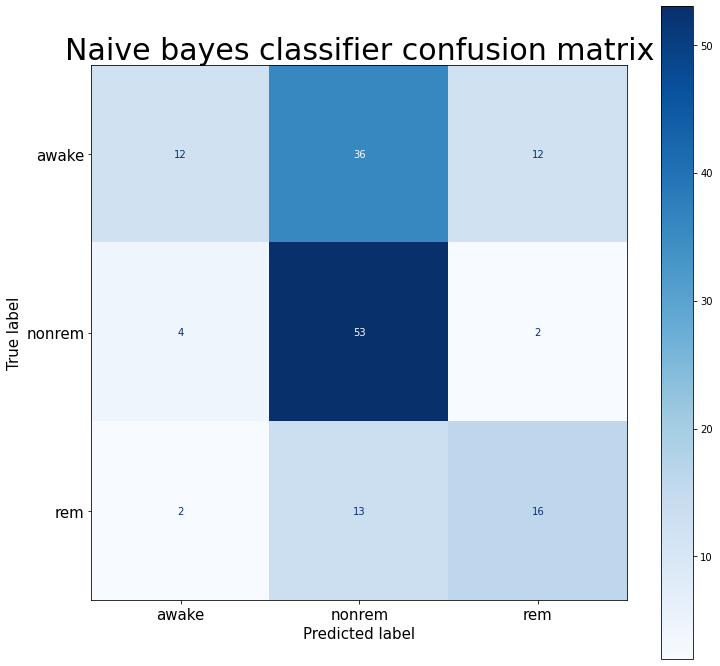

------------------------------------------
KNN accuracy: 0.67
SVC accuracy: 0.75
Decision tree accuracy: 0.67
Random forest accuracy: 0.78
Extra trees accuracy: 0.79
Naive bayes accuracy: 0.54


In [458]:
X_test2,y_test2=getSamplesAndLabels(test_std_data_set,features,"labels")
#print(len(y_test2))
models = {"KNN":KNeighborsClassifier(n_neighbors=N),"SVC":best_svc_model,
          "Decision tree":tree.DecisionTreeClassifier(),"Random forest": RandomForestClassifier(n_estimators = R,random_state=rs),
          "Extra trees":ExtraTreesClassifier(n_estimators = E,random_state=rs),"Naive bayes":GaussianNB()}
predictions ={}
accuracies = {}
for key in models.keys():
  start=time.time()
  # Constructing the model
  models[key].fit(X, y)
  print(key)
  end=time.time()
  print("Training time: ",end-start,"seconds")
  start=time.time()
  predictions[key] = models[key].predict(X_test2)
  end=time.time()
  print("Prediction time: ",end-start,"seconds")
  accuracy = np.round(accuracy_score(y_test2, predictions[key]),2)
  accuracies[key]=accuracy
  print("Accuracy: ", accuracy)
  fig, ax = plt.subplots(figsize=(12, 12))
  ax.set_title(key+" classifier confusion matrix", fontsize=30)
  plot_confusion_matrix(models[key], X_test2, y_test2, ax=ax, cmap="Blues")
  ax.xaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.yaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.set_xlabel("Predicted label",fontsize=15)
  ax.set_ylabel("True label",fontsize=15)
  plt.show()
  print("------------------------------------------")
for key in accuracies.keys():
  print(key+" accuracy: "+str(accuracies[key]))

#Conclusion of sleep stages

* The results illustrate that the feature extractions provide promising possibilities to distinguish between different sleep stages of awake, nonrem and rem

* It  is  noted  that  the  awake stage shows the  highest  muscular  activity (emg) in  comparison  to  the rem stage which has the lowest emg activity, this is not suprising as the human body is indulent in rem stage. Additionally, it should be considered that muscular activity is strongly linked to the epoch energy. Similarly, eog activity shows strong amplitudes in the awake stage as it  is clear that the awake stage presents high  ocular  activity  (eye  movements  and  eye blinks) but also in rem stage as it is common for rapid eye-movement to occur, which appears in eog signals

* We found that the Extra trees classifier is the most suitable for sleep stage scoring with higher accuracy incomparable to KNN classifier ???

#Questions for the discussion session
* Which standardization method should we use?
* EMG signal filtering - what bandpass cutoff frequencies should be used?
* Should the samples be divided into windows of sleep epoches (e.g. 30s window and include overlapping?)